In [44]:
import pandas as pd
import numpy as np
import sys
import matplotlib.pyplot as plt

In [45]:
df1=pd.read_excel('ukraineannotation.xlsx')

In [46]:
df1

,Tweet,Sentiment
0,@sporarena @UgurMeleke Bilu ukraynalilar pkk a...,n
1,Ukraynalılar Romanya sınırını yürüyerek geçmey...,ntr
2,#İngiltere Savunma Bakanı: Ruslar hala büyük h...,ntr
3,@absent005 Bizim enflasyon gariban Ukraynalıyı...,n
4,@TurkishIndy Cengiz biraz da Ukraynalilar'in ....,n
...,...,...
1495,@Dursund13021363 Meğer Ukraynalılar bunun için...,ntr
1496,Allah kimseyi bir ülke gözlerimizin önünde vat...,ntr
1497,@VickieSchn_ lazlar ve ukraynalılar türklerin ...,ntr
1498,@griffincomtr @temmuz1919 Hayırrr sevgi kelebe...,ntr


In [47]:
df1.copy()
df1["Sentiment"].replace({"ntr": "Neutral", "p": "Positive","n":"Negative"}, inplace=True)

In [48]:
df1

,Tweet,Sentiment
0,@sporarena @UgurMeleke Bilu ukraynalilar pkk a...,Negative
1,Ukraynalılar Romanya sınırını yürüyerek geçmey...,Neutral
2,#İngiltere Savunma Bakanı: Ruslar hala büyük h...,Neutral
3,@absent005 Bizim enflasyon gariban Ukraynalıyı...,Negative
4,@TurkishIndy Cengiz biraz da Ukraynalilar'in ....,Negative
...,...,...
1495,@Dursund13021363 Meğer Ukraynalılar bunun için...,Neutral
1496,Allah kimseyi bir ülke gözlerimizin önünde vat...,Neutral
1497,@VickieSchn_ lazlar ve ukraynalılar türklerin ...,Neutral
1498,@griffincomtr @temmuz1919 Hayırrr sevgi kelebe...,Neutral


In [49]:
df1['Sentiment'].value_counts()

Neutral     1148
Positive     208
Negative     144
Name: Sentiment, dtype: int64

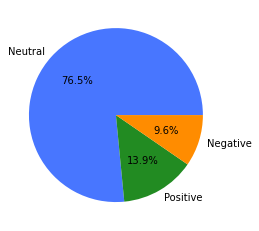

In [80]:
colors=['#4876FF','#228B22','darkorange']
plt.pie(df1['Sentiment'].value_counts(),labels=['Neutral','Positive','Negative'],colors=colors,autopct='%1.1f%%')
plt.show()


In [10]:
#PREPROCESSING

In [11]:
import re

In [12]:
df1['Tweet'] = [token.lower() for token in df1['Tweet']]
df1.head(5)

,Tweet,Sentiment
0,@sporarena @ugurmeleke bilu ukraynalilar pkk a...,Negative
1,ukraynalılar romanya sınırını yürüyerek geçmey...,Neutral
2,#i̇ngiltere savunma bakanı: ruslar hala büyük ...,Neutral
3,@absent005 bizim enflasyon gariban ukraynalıyı...,Negative
4,@turkishindy cengiz biraz da ukraynalilar'in ....,Negative


In [13]:
found = df1[df1['Tweet'].str.contains('\n')]
found.count()

Tweet        392
Sentiment    392
dtype: int64

In [14]:
df1['Tweet'] = df1['Tweet'].replace('\n', '', regex=True)
found = df1[df1['Tweet'].str.contains('\n')]
found.count()

Tweet        0
Sentiment    0
dtype: int64

In [15]:
found = df1[df1['Tweet'].str.contains('@')]
found.count()

Tweet        735
Sentiment    735
dtype: int64

In [16]:
df1['Tweet'] = df1['Tweet'].replace('@[A-Za-z0-9_]+', '', regex=True).replace('@[A-Za-z0-9_]', '', regex=True)
found = df1[df1['Tweet'].str.contains('@')]
found.count()

Tweet        1
Sentiment    1
dtype: int64

In [17]:
df1['Tweet'] = df1['Tweet'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)
found = df1[df1['Tweet'].str.contains('http')]
found.count()

Tweet        0
Sentiment    0
dtype: int64

In [18]:
#REMOVE PUNCTUATIONS, EMOJIS AND NUMBERS

In [19]:
sentences = df1['Tweet'].copy()
new_sent = []
i = 0
for sentence in sentences:
    new_sentence = re.sub('[0-9]+', '', sentence)
    new_sent.append(new_sentence)
    i += 1
    
df1['Tweet'] = new_sent
df1

,Tweet,Sentiment
0,bilu ukraynalilar pkk anılarınızı kadınların...,Negative
1,ukraynalılar romanya sınırını yürüyerek geçmey...,Neutral
2,#i̇ngiltere savunma bakanı: ruslar hala büyük ...,Neutral
3,bizim enflasyon gariban ukraynalıyı da vurdu....,Negative
4,cengiz biraz da ukraynalilar'in .... koysun🤣,Negative
...,...,...
1495,meğer ukraynalılar bunun için bekliyor imişle...,Neutral
1496,allah kimseyi bir ülke gözlerimizin önünde vat...,Neutral
1497,lazlar ve ukraynalılar türklerin kıpak ve peç...,Neutral
1498,hayırrr sevgi kelebeği ukraynalılar asla ırk...,Neutral


In [20]:
import string

table = str.maketrans('', '', string.punctuation)
sentences = df1['Tweet'].copy()
new_sent = []
for sentence in sentences:
    words = sentence.split()
    stripped = [w.translate(table) for w in words]
    new_sent.append(stripped)

In [21]:
df1['Tweet'] = new_sent
df1

,Tweet,Sentiment
0,"[bilu, ukraynalilar, pkk, anılarınızı, kadınla...",Negative
1,"[ukraynalılar, romanya, sınırını, yürüyerek, g...",Neutral
2,"[i̇ngiltere, savunma, bakanı, ruslar, hala, bü...",Neutral
3,"[bizim, enflasyon, gariban, ukraynalıyı, da, v...",Negative
4,"[cengiz, biraz, da, ukraynalilarin, , koysun🤣]",Negative
...,...,...
1495,"[meğer, ukraynalılar, bunun, için, bekliyor, i...",Neutral
1496,"[allah, kimseyi, bir, ülke, gözlerimizin, önün...",Neutral
1497,"[lazlar, ve, ukraynalılar, türklerin, kıpak, v...",Neutral
1498,"[hayırrr, sevgi, kelebeği, ukraynalılar, asla,...",Neutral


In [22]:
#TOKENIZATION

In [23]:
import time
import logging

from zemberek import (
    TurkishSpellChecker,
    TurkishSentenceNormalizer,
    TurkishSentenceExtractor,
    TurkishMorphology,
    TurkishTokenizer
)

logger = logging.getLogger(__name__)

morphology = TurkishMorphology.create_with_defaults()
normalizer = TurkishSentenceNormalizer(morphology)
extractor = TurkishSentenceExtractor()

2023-01-18 21:15:52,382 - zemberek.morphology.turkish_morphology - INFO
Msg: TurkishMorphology instance initialized in 12.482295989990234



In [24]:
#NORMALIZATION

In [25]:

def normalize_long_text(text):
    normalized_sentences = [normalizer.normalize(word) for word in text]
    normalized_text = " ".join(normalized_sentences)
    return normalized_text

In [26]:
sentences = df1['Tweet'].copy()
new_sent = []
start = time.time()

for token in sentences:   
    if token.count('') > 0:
        token = list(filter(('').__ne__, token))
    new_token = normalize_long_text(token)
    new_sent.append(new_token)

logger.info(f"Sentences normalized in: {time.time() - start} s")

2023-01-18 21:20:08,980 - __main__ - INFO
Msg: Sentences normalized in: 242.4724407196045 s



In [27]:
#STOPWORDS

In [31]:
from nltk.corpus import stopwords
stops = set(stopwords.words('turkish'))
print(stops)
import nltk
nltk.download('stopwords')
stops = set(stopwords.words('turkish'))
print(stops)

{'veya', 'da', 'nerede', 'acaba', 'biri', 'kim', 'neden', 'hiç', 'bazı', 'de', 'hem', 'gibi', 'hep', 'siz', 'niçin', 'ne', 'diye', 'o', 'az', 'daha', 'nasıl', 'ama', 'niye', 'hepsi', 'mı', 'nereye', 'sanki', 've', 'kez', 'nerde', 'birşey', 'ki', 'ise', 'eğer', 'her', 'şu', 'aslında', 'tüm', 'bu', 'çünkü', 'defa', 'belki', 'ile', 'biz', 'şey', 'en', 'ya', 'yani', 'mu', 'çok', 'mü', 'için', 'birkaç'}
{'veya', 'da', 'nerede', 'acaba', 'biri', 'kim', 'neden', 'hiç', 'bazı', 'de', 'hem', 'gibi', 'hep', 'siz', 'niçin', 'ne', 'diye', 'o', 'az', 'daha', 'nasıl', 'ama', 'niye', 'hepsi', 'mı', 'nereye', 'sanki', 've', 'kez', 'nerde', 'birşey', 'ki', 'ise', 'eğer', 'her', 'şu', 'aslında', 'tüm', 'bu', 'çünkü', 'defa', 'belki', 'ile', 'biz', 'şey', 'en', 'ya', 'yani', 'mu', 'çok', 'mü', 'için', 'birkaç'}


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alkan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
splitted_words = []
for sent in new_sent:
    words = sent.split()
    splitted_words.append(words)

In [33]:
clean_sent = []
for sentence in splitted_words:
    new_sentence = [w for w in sentence if w not in stops]
    clean_sent.append(new_sentence)

In [34]:
#lEMMATIZATION

In [35]:
for token in clean_sent:
    j = 0
    for word in token:
        new_word = word.replace('"', '').replace("’", '').replace("'", '').replace("”", '')
        token[j] = new_word
        j += 1

In [36]:
pip install zeyrek

Note: you may need to restart the kernel to use updated packages.


In [37]:
  import nltk
  nltk.download('punkt')
import zeyrek
analyzer = zeyrek.MorphAnalyzer()
lem_sent = []
for sent in clean_sent:
    normalized_sent = []
    for word in sent:
        if word == '':
            continue
        else:
            lem_word = analyzer.lemmatize(word)
            normalized_sent.append(lem_word[0][1][0])
    lem_sent.append(normalized_sent)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Alkan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


2023-01-18 21:56:39,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bolu_Noun_Prop)(-)(bolu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:39,838 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bol_Adj)(-)(bol:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:56:39,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bol_Adj)(-)(bol:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:56:39,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:39,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2

2023-01-18 21:56:40,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hedef_Noun_Prop)(-)(hedef:nounProper_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18

2023-01-18 21:56:40,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + leş:become_S + verbRoot_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:56:40,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:40,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Elmalı_Noun_Prop)(-)(elmalı:nounProper_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-01-18 21:56:40,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elma_Noun)(-)(elma:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-01-18 21:56:40,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilginç_Adj)(-)(ilginç:adjectiveRoot_ST)>

2023-01-18 21:56:40,181 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kontrast_Adj)(-)(kontrast:adjectiveRoot_ST)>

202

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Küçük_Noun_Prop)(-)(küçük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küçük_Noun)(-)(küçük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:40,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:40,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:56:40,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:40,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:56:40,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + tir:vCausTır_S + verbRoot_S + e:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:56:40,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:40,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:56:40,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:56:40,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:56:40,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:56:40,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:56:40,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:56:40,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S

2023-01-18 21:56:40,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-01-18 21:56:40,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dü:vPast_S + k:vA1pl_ST)>

2023-01-18 21:56:40,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dük:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:56:40,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dük:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:40,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayn

2023-01-18 21:56:40,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:56:40,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:56:40,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:56:40,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:56:40,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:40,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg

2023-01-18 21:56:40,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takılmak_Verb)(-)(takıl:verbRoot_S + ıyor:vProgYor_S + sun:vA2sg_ST)>

2023-01-18 21:56:40,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takmak_Verb)(-)(tak:verbRoot_S + ıl:vPass_S + verbRoot_S + ıyor:vProgYor_S + sun:vA2sg_ST)>

2023-01-18 21:56:40,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atatürk_Noun_Prop)(-)(atatürk:nounProper_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:56:40,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + di:vPast_S + n:vA2sg_ST)>

2023-01-18 21:56:40,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nankör_Adj)(-)(nankör:adjectiveRoot_ST)>

2023-01-18 21:56:40,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(piç_Noun)(-)(piç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:40,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:56:41,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:56:41,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + ndan:abl_ST)>

2023-01-18 21:56:41,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sökmek_Verb)(-)(sök:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:41,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Söke_Noun_Prop)(-)(söke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sökmek_Verb)(-)(sök:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:41,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Söke_Noun_Prop)(-)(söke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,030 - 

2023-01-18 21:56:41,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:56:41,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:56:41,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:56:41,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:56:41,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:41,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-

2023-01-18 21:56:41,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kültür_Noun)(-)(kültür:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-01-18 21:56:41,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kültür_Noun)(-)(kültür:noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-01-18 21:56:41,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sırbistan_Noun_Prop)(-)(sırbistan:nounProper_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:41,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sırbistan_Noun_Prop)(-)(sırbistan:nounProper_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:41,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkent_Noun)(-)(başkent:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:41,268 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:56:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:56:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(gid:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:41,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gide_Noun_Prop)(-)(gide:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:41,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-01-18 21:56:41,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:56:41,453 - zeyrek.rulebasedana

2023-01-18 21:56:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:56:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:56:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medenî_Adj)(-)(medeni:adjectiveRoot_ST)>

2023-01-18 21:56:41,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + da:pLoc_ST)>

2023-01-18 21:56:41,600 - zeyrek.rulebased

2023-01-18 21:56:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:56:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:56:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:56:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:56:41,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulan_Interj)(-)(ulan:interjRoot_ST)>

2023-01-18 21:56:41,747 - zeyrek.rulebasedanalyzer

2023-01-18 21:56:41,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + up:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplamak_Verb)(-)(topla:verbRoot_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:41,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S +

2023-01-18 21:56:41,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:56:41,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:56:41,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:56:41,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genel_Adj)(-)(genel:adjectiveRoot_ST)>

2023-01-18 21:56:41,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genelmek_Verb)(-)(genel:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:42,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:42,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>



2023-01-18 21:56:42,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Noun)(-)(sosyal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medya_Noun)(-)(medya:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:56:42,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özür_Noun)(-)(özür:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özür_Noun_Prop)(-)(özür:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilemek_Verb)(-)(dile:verbRoot_S + yip:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:56:42,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + niz:p2pl_S + de:loc_ST)>

2023-01-18 21:56:42,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)

2023-01-18 21:56:42,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:42,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:42,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:42,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekonomi_Noun)(-)(ekonomi:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:56:42,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(katkı_Noun)(-)(katkı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:56:42,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:56:42,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST

2023-01-18 21:56:42,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fiyatı_Noun_Prop)(-)(fiyatı:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:56:42,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artmak_Verb)(-)(art:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:56:42,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araba_Adj)(-)(araba:adjectiveRoot_ST)>

2023-01-18 21:56:42,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arab:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:42,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arab_Noun_Prop)(-)(arab:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:42,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araba_Noun)(-)(araba:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağlama

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Se_Noun_Abbrv)(-)(se:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + in:pGen_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köpek_Noun)(-)(köpek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peş_Noun)(-)(peş:nou

2023-01-18 21:56:42,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işkence_Noun)(-)(işkence:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işkence_Noun)(-)(işkence:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:42,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:56:42,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vahşet_Noun)(-)(vahşet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öte_Noun)(-)(öte:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:56:42,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:42,803 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:56:42,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:

2023-01-18 21:56:43,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + mız:p1pl_S + da:loc_ST)>

2023-01-18 21:56:43,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezmek_Verb)(-)(gez:verbRoot_S + dir:vCausTır_S + verbRoot_S + iyor:vProgYor_S + uz:vA1pl_ST)>

2023-01-18 21:56:43,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:43,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + a3sg_S + ları:p3pl_S + ndan:abl_ST)>

2023-01-18 21:56:43,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:56:43,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-1

2023-01-18 21:56:43,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pus_Noun)(-)(pus:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:56:43,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pus_Noun)(-)(pus:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:56:43,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pusu_Noun)(-)(pusu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:43,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atamak_Verb)(-)(at:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:43,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atmak_Verb)(-)(at:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:43,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(araç:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:56:43,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S +

2023-01-18 21:56:43,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mücadele_Noun_Prop)(-)(mücadele:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:43,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:56:43,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:56:43,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:43,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:56:43,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:43,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3

2023-01-18 21:56:43,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkmak_Verb)(-)(kork:verbRoot_S + tuk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:43,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + pnon_S + nun:gen_ST)>

2023-01-18 21:56:43,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + n:p2sg_S + un:gen_ST)>

2023-01-18 21:56:43,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nun:gen_ST)>

2023-01-18 21:56:43,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + un:gen_ST)>

2023-01-18 21:56:43,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:43,489 

2023-01-18 21:56:43,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşağılamak_Verb)(-)(aşağıl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-01-18 21:56:43,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:43,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:56:43,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:56:43,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaç_Adj)(-)(kaç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:56:43,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + ye:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:56:43,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:56:43,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:56:43,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkeğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:43,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkeğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:43,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-01-18 21:56:43,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:43,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:43,759 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:56:43,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asansör_Noun)(-)(asansör:noun_S + a3sg_S + pnon_S + le:ins_ST)>

2023-01-18 21:56:43,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ar:vAor_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:56:43,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkar_Noun)(-)(çıkar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:56:43,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:43,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)

2023-01-18 21:56:44,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:56:44,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medeniyet_Noun)(-)(medeniyet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-01-18 21:56:44,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:44,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:44,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelenek_Noun)(-)(gelenek:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:56

2023-01-18 21:56:44,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:56:44,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:56:44,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:56:44,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + adjAfterVerb_S + ımız:aP3sg_ST)>

2023-01-18 21:56:44,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ımız:p1pl_S + nom_ST)>

2023-01-18 21:56:44,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST)>



2023-01-18 21:56:44,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + ma:vNeg_S + vAorNegEmpty_S + m:vA1sg_ST)>

2023-01-18 21:56:44,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:56:44,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medenî_Adj)(-)(medeni:adjectiveRoot_ST)>

2023-01-18 21:56:44,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:44,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA

2023-01-18 21:56:44,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:44,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-01-18 21:56:44,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:44,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:44,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaç_Adj)(-)(kaç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:44,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:56:44,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aktarmak_Verb)(-)(aktar:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:44,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cesur_Adv)(-)(cesur:advRoot_ST)>

2023-01-18 21:56:44,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cesur_Adj)(-)(cesur:adjectiveRoot_ST)>

2023-01-18 21:56:44,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cesur_Noun_Prop)(-)(cesur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yürek_Noun_Prop)(-)(yürek:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:44,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yürek_Noun)(-)(

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karı_Noun)(-)(karı:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terk_Noun)(-)(terk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:56:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edip_Noun_Prop)(-)(edip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edip_Noun)(-)(edip:noun

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:56:44,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Adv)(-)(yerine:advRoot_ST)>

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerinmek_Verb)(-)(yerin:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:45,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Noun)(-)(yerine:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S 

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iz_Noun)(-)(iz:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iz_Noun)(-)(iz:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izin:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + ir:vAor_S + ler:vA3pl_ST)>

2023-01-18 21:56:45,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S +

2023-01-18 21:56:45,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şarkı_Noun)(-)(şarkı:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:45,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:45,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:56:45,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarr_S + lar:vA3pl_ST + dır:vCop_ST)>

2023-01-18 21:56:45,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-01-18 21:56:45,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot

2023-01-18 21:56:45,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:45,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:45,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ateş_Noun)(-)(ateş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:45,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:56:45,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Verdi_Noun_Prop)(-)(verdi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(verdi_Noun)(-)(verdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(u

2023-01-18 21:56:45,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çete_Noun)(-)(çete:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:56:45,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çete_Noun)(-)(çete:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:56:45,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çete_Noun)(-)(çete:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:56:45,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:45,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:45,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:45,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbr

2023-01-18 21:56:45,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kader_Noun_Prop)(-)(kader:nounProper_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:45,693 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:56:45,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:45,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirlemek_Verb)(-)(belirle:verbRoot_S + yebil:vAble_S + verbRoot_S + ir:vAor_S + ler:vA3pl_ST)>

2023-01-18 21:56:45,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fakat_Conj)(-)(fakat:conjRoot_ST)>

2023-01-18 21:56:45,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:56:45,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-01-18 21:56:45,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(-)(can:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siper_Noun)(-)(siper:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:45,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siper_Noun)(-)(siper:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:45,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siper_Adj)(-)(siper:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:45,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siper_Adj)(-)(siper:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:45,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:45,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:56:45,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mersin_Noun)(-)(mersin:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:56:45,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:45,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:45,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:56:45,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-0

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzeltmek_Verb)(-)(düzelt:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzeltmek_Verb)(-)(düzelt:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzelmek_Verb)(-)(düzel:verbRoot_S + t:vCaus_S + verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzelmek_Verb)(-)(düzel:verbRoot_S + t:vCaus_S + verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bide_Noun)(-)(bide:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:46,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Biden_Noun_Prop)(-)(biden:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,080 - z

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edinmek_Verb)(-)(edin:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edi_Noun_Prop)(-)(edi:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alkışlamak_Verb)(-)(alkışla:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:46,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alkışlamak_Verb)(-)(alkışla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:46,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-01-18 21:56:46,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:46,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:46,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatmak_Verb)(-)(yat:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:46,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bm_Noun_Abbrv)(-)(bm:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:56:46,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)>

2023-01-18 21:56:46,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + vImp_S + vA2sg

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüksek_Adj)(-)(yüksek:adjectiveRoot_ST)>

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yüksek_Noun_Prop)(-)(yüksek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüksek_Noun)(-)(yüksek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yük_Noun)(-)(yük:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + k:nA1pl_ST)>

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(analiz_Noun)(-)(analiz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emekli_Adj)(-)(emekli:adjectiveRoot_ST)>

2023-01-18 21:56:46,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emekli_Noun)(-)

2023-01-18 21:56:46,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:56:46,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hristiyan_Noun)(-)(hristiyan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-01-18 21:56:46,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hristiyan_Noun)(-)(hristiyan:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:56:46,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hristiyan_Noun_Prop)(-)(hristiyan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-01-18 21:56:46,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hristiyan_Noun_Prop)(-)(hristiyan:nounProper_S + lar:a3p

2023-01-18 21:56:46,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonuç_Noun)(-)(sonuç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:56:46,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:46,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkak_Adj)(-)(korkak:adjectiveRoot_ST)>

2023-01-18 21:56:46,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zorla_Adv)(-)(zorla:advRoot_ST)>

2023-01-18 21:56:46,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zorlamak_Verb)(-)(zorla:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:

2023-01-18 21:56:46,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Osman_Noun_Prop)(-)(osman:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:46,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:56:46,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST + postpZero_S + po2nRoot_S + po2nA3sg_S + sı:po2nP3sg_S + po2nNom_ST)>

2023-01-18 21:56:46,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarih_Noun)(-)(tarih:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:46,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boyunca_Postp_PCNom)(-)(boyunca:postpRoot_ST)>

2023-01-18 21:56:46,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boy_Noun)(-)(boy:noun_S + a3sg_S + un:p2sg_S + ca:equ_ST)>

2023-01-18 21:56:46,959 - zeyrek.ruleba

2023-01-18 21:56:47,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Noun)(-)(ard:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:56:47,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Adj)(-)(ard:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:56:47,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Adj)(-)(ard:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:56:47,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:47,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:47,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:47,113 - z

2023-01-18 21:56:47,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuma_Noun)(-)(kuma:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:47,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuman_Noun_Prop)(-)(kuman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:47,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:47,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:47,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop)(-)(slav:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)

2023-01-18 21:56:47,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birbiri_Pron_Quant)(-)(birbir:pronQuantModified_S + pQuantModA3pl_S + leri:pP3pl_S + ni:pAcc_ST)>

2023-01-18 21:56:47,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öldürmek_Verb)(-)(öldür:verbRoot_S + ecek:vFut_S + ler:vA3pl_ST)>

2023-01-18 21:56:47,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + dür:vCausTır_S + verbRoot_S + ecek:vFut_S + ler:vA3pl_ST)>

2023-01-18 21:56:47,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öldürmek_Verb)(-)(öldür:verbRoot_S + ecek:vFutPart_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + dür:vCausTır_S + verbRoot_S + ecek:vFutPart_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zerr_Noun_P

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)>

2023-01-18 21:56:47,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:v

2023-01-18 21:56:47,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:47,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + ince:vWhen_S + advRoot_ST)>

2023-01-18 21:56:47,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + in:p2sg_S + ce:equ_ST)>

2023-01-18 21:56:47,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + i:p3sg_S + nce:equ_ST)>

2023-01-18 21:56:47,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:56:47,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:47,645 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:56:47,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST)>

2023-01-18 21:56:47,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:47,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asla_Adv)(-)(asla:advRoot_ST)>

2023-01-18 21:56:47,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Noun)(-)(as:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:56:47,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(As_Noun_Prop)(-)(as:nounProper_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:56:47,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Noun)(-)(asl:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:47,7

2023-01-18 21:56:47,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-01-18 21:56:47,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:47,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:47,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:47,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:47,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:56:48,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:

2023-01-18 21:56:48,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:48,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:48,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:48,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:48,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:48,168 - zeyrek.ruleba

2023-01-18 21:56:48,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST)>

2023-01-18 21:56:48,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(gid:verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + pnon_S + le:ins_ST)>

2023-01-18 21:56:48,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alman_Noun_Prop)(-)(alman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:48,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + u:acc_ST)>

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:56:48,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-0

2023-01-18 21:56:48,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yine_Adv)(-)(yine:advRoot_ST)>

2023-01-18 21:56:48,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:48,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yine_Adv)(-)(yine:advRoot_ST)>

2023-01-18 21:56:48,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yine_Adv)(-)(yine:advRoot_ST)>

2023-01-18 21:56:48,585 - zeyre

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:56:48,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:48,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:56:48,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + uz:vA1pl_ST)>

2023-01-18 21:56:48,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:56:48,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:56:48,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aş_Noun)(-)(aş:noun_S + a3sg_S + ımız:p1pl_S + nom_ST)>

2023-01-18 21:56:48,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşı_Noun)(-)(aşı:noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-01-18 21:56:48,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşı_Adj)(-)(aşı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-01-18 21:56:48,986 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zenginlemek_Verb)(-)(zenginle:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zenginlemek_Verb)(-)(zenginle:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zengin_Adj)(-)(zengin:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zengin_Adj)(-)(zengin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zeng_Noun_Prop)(-)(zeng:nounProper_S + a3sg_S + pnon_S + in:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:49,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zeng_Noun_Prop)(-)(

2023-01-18 21:56:49,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:56:49,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST)>

2023-01-18 21:56:49,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rakam_Noun)(-)(rakam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adv)(-)(fazla:advRoot_ST)>

2023-01-18 21:56:49,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-01-18 21:56:49,249 - zeyrek.

2023-01-18 21:56:49,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taciz_Noun)(-)(taciz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:49,387 - zeyrek.rulebas

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yi_Noun_Abbrv)(-)(yi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doldurmak_Verb)(-)(doldur:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:56:49,503 - zeyrek.rulebasedanalyzer

2023-01-18 21:56:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:56:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:49,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(krem_Noun)(-)(krem:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-01-18 21:56:49,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(krem_Adj)(-)(krem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:56:49,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + i:p3pl_S + n

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iğrenç_Adj)(-)(iğrenç:adjectiveRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-01-18 21:56:49,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S

2023-01-18 21:56:50,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:50,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:50,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:56:50,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birlik:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:56:50,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birlik:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:56:50,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birlik:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:56:50,035 - zeyrek.ruleb

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakında_Adv)(-)(yakında:advRoot_ST)>

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:50,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:50,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:no

2023-01-18 21:56:50,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + up:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:56:50,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + abil:vAble_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:50,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cidden_Adv)(-)(cidden:advRoot_ST)>

2023-01-18 21:56:50,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cidde_Noun_Prop)(-)(cidde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:50,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayat_Noun)(-)(hayat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:50,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ters_Adj)(-)(ters:adjectiveRoot_ST)>

2023-01-18 21:56:50,321 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:56:50,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-01-18 21:56:50,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:50,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:50,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:50,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:56:50,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56

2023-01-18 21:56:50,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuyruk_Noun)(-)(kuyruğ:noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:56:50,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuyruk_Noun)(-)(kuyruğ:noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:56:50,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girmek_Verb)(-)(gir:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:50,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girmek_Verb)(-)(gir:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:56:50,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:50,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + no

2023-01-18 21:56:50,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:50,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:50,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:50,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusça_Adj_Prop)(-)(rusça:adjectiveRoot_ST)>

2023-01-18 21:56:50,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + ça:equ_ST)>

2023-01-18 21:56:50,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusça_Noun_Prop)(-)(rusça:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:50,721 - 

2023-01-18 21:56:50,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:50,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:50,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-01-18 21:56:50,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-01-18 21:56:50,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:56:50,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:56:50,853 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:56:50,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tu:nPast_S + nA3sg_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zulüm_Noun)(-)(zulüm:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göç_Noun)(-)(göç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:56:51,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-

2023-01-18 21:56:51,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İslâm_Noun_Prop)(-)(islam:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:51,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İslam_Noun_Prop)(-)(islam:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:51,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşmak_Verb)(-)(koş:verbRoot_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:51,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:56:51,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:56:51,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adj)(-)(güzel:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:51,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:56:51,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:56:51,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müthiş_Adj)(-)(müthiş:adjectiveRoot_ST)>

2023-01-18 21:56:51,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müthiş_Interj)(-)(müthiş:interjRoot_ST)>

2023-01-18 21:56:51,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(algılamak_Verb)(-)(algıl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:51,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Almanya_Noun_Prop)(-)(almanya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:51,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:5

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:51,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:51,423 - zeyrek.rulebasedanal

2023-01-18 21:56:51,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:51,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tahliye_Noun)(-)(tahliye:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:56:51,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önermek_Verb)(-)(öner:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:56:51,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önemek_Verb)(-)(öne:verbRoot_S + r:vAor_S + di:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:56:51,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Öner_Noun_Prop)(-)(öner:nounProper_S

2023-01-18 21:56:51,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalkmak_Verb)(-)(kalk:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:51,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:56:51,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaşam_Noun_Prop)(-)(yaşam:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:51,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + sunuz:vA2pl_ST)>

2023-01-18 21:56:51,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aö_Noun_Abbrv)(-)(aö:nounAbb

2023-01-18 21:56:51,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ısrar_Noun)(-)(ısrar:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:56:51,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyl:verbRoot_VowelDrop_S + üyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:51,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:56:51,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:51,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:51,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şâhıs_Noun)(-)(şahıs:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:51,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-1

2023-01-18 21:56:51,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nce:equ_ST)>

2023-01-18 21:56:51,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nce:equ_ST)>

2023-01-18 21:56:51,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:51,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğramak_Verb)(-)(uğra:verbRoot_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:52,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:52,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-01-18 21:56:52,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-01-18 21:56:52,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:56:52,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:56:52,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-01-18 21:56:52,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-01-18 21:56:52,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST

2023-01-18 21:56:52,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Noun)(-)(basit:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:52,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Noun)(-)(basit:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:52,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Adj)(-)(basit:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:52,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Adj)(-)(basit:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:52,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:52,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arad_Noun_Prop)(-)(arad:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:52,278 - zeyrek.rulebasedanalyz

2023-01-18 21:56:52,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haricî_Adj)(-)(harici:adjectiveRoot_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Noun)(-)(haric:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Noun)(-)(haric:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hari_Noun_Prop)(-)(hari:nounProper_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbir_Det)(-)(hiçbir:detRoot_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(statü_Noun)(-)(statü:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(statü_Noun)(-)(statü:n

2023-01-18 21:56:52,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:56:52,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:56:52,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:52,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:52,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:56:52,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplamak_Verb)(-)(topla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:56:52,541 - zeyrek.rulebasedanalyzer - WARNI

2023-01-18 21:56:52,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:52,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:56:52,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:56:52,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:56:52,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:56:52,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:56:52,679 - zeyrek.rulebaseda

2023-01-18 21:56:52,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-01-18 21:56:52,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:52,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iğrenç_Adv)(-)(iğrenç:advRoot_ST)>

2023-01-18 21:56:52,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iğrenç_Adj)(-)(iğrenç:adjectiveRoot_ST)>

2023-01-18 21:56:52,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pislik_Noun)(-)(pislik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:52,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pis_Adj)(-)(pis:adjectiveRoot_ST + lik:ness_S + noun_S

2023-01-18 21:56:52,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:52,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:52,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:52,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:56:52,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:52,942 - zeyrek.rulebasedanalyzer - WARNI

2023-01-18 21:56:53,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:53,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:53,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedeniyle_Adv)(-)(nedeniyle:advRoot_ST)>

2023-01-18 21:56:53,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:56:53,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:53,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:53,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:v

2023-01-18 21:56:53,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:56:53,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:53,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:53,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(itiraz_Noun)(-)(itiraz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:53,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:56:53,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + siniz:qA2pl_ST)>

2023-01-18 21:56:53,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun

2023-01-18 21:56:53,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:56:53,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:56:53,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değim_Noun)(-)(değim:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:53,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:53,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + 

2023-01-18 21:56:53,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deri_Adj)(-)(deri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-01-18 21:56:53,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(derin_Adj)(-)(derin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:53,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:53,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bizzat_Adv)(-)(bizzat:advRoot_ST)>

2023-01-18 21:56:53,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dugin_Noun_Prop)(-)(dugin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:53,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarafından_Adv)(-)(tarafından:advRoot_ST)>

2023-01-18 21:56:53,497 - zeyrek.rulebasedan

2023-01-18 21:56:53,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + dür:vCausTır_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:53,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elektronik_Noun)(-)(elektroniğ:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:56:53,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elektronik_Noun)(-)(elektroniğ:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:53,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bozmak_Verb)(-)(boz:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:53,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boza_Noun)(-)(boza:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:53,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüksek_Adj)(-)(yüksek:adjectiveRoot_ST)>

2023-01-18 21:56:53,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:56:53,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:56:53,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:56:53,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-01-18 21:56:53,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşlanmak_Verb)(-)(konuşlan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:56:53,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşlanmak_Verb)(-)(konuşlan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:56:53,7

2023-01-18 21:56:53,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun)(-)(ağız:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:53,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:53,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:56:53,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-01-18 21:56:53,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:53,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pno

2023-01-18 21:56:54,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + ma:vNeg_S + yacak:vFutPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:56:54,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:54,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:54,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haf_Noun)(-)(haf:noun_S + a3sg_S + pnon_S + ta:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:56:54,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hafta_Noun_Time)(-)(hafta:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S

2023-01-18 21:56:54,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:56:54,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:56:54,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:54,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rincon_Noun_Prop)(-)(rincon:nounProper_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:54,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumuşak_Adj)(-)(yumuşak:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:54,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumuşak_Adj)(-)(yumuşak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:54,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:56:54,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:56:54,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:54,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:54,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(enez_Adj)(-)(enez:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:54,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(enez_Adj)(-)(enez:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:54,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Enez_Noun_Prop)(-)(enez:nounProper_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + p

2023-01-18 21:56:54,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bot_Noun)(-)(bot:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:56:54,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bot_Noun)(-)(bot:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:56:54,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(delmek_Verb)(-)(del:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:54,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:54,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(püskürmek_Verb)(-)(püskür:verbRoot_S + t:vCaus_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:54,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güçlü_Adj)(-)(güçlü:adjectiveRoot_ST)>

2023-01-18 21:56:54,484 - zeyrek.rulebasedanalyz

2023-01-18 21:56:54,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erişkin_Adj)(-)(erişkin:adjectiveRoot_ST)>

2023-01-18 21:56:54,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sağlık_Noun_Prop)(-)(sağlık:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:54,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağlık_Noun)(-)(sağlık:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:54,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:54,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:54,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:56:54,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:54,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:54,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fotoğraf_Noun)(-)(fotoğraf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:54,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kare_Noun)(-)(kare:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:54,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kare_Adj)(-)(kare:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:54,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paylaşmak_Verb)(-)(paylaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:56:54,785 - zeyrek.rulebaseda

2023-01-18 21:56:54,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(krem_Adj)(-)(krem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-01-18 21:56:54,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapılanmak_Verb)(-)(yapılan:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:54,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:54,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:54,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:54,932 - zeyrek.rulebasedanalyzer - WARNING

2023-01-18 21:56:55,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Adj)(-)(can:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:56:55,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:55,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:56:55,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:56:55,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:56:55,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inşaa_Noun)(-)(inşaa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,085 - zeyrek.rulebasedanalyzer

2023-01-18 21:56:55,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:56:55,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:56:55,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşarmak_Verb)(-)(yaşar:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + adjAfterVerb_ST)>

2023-01-18 21:56:55,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşarmak_Verb)(-)(yaşar:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:55,233 - zeyrek.rulebasedanalyzer

2023-01-18 21:56:55,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akı_Noun)(-)(akı:noun_S + a3sg_S + m:p1sg_S + ın:gen_ST)>

2023-01-18 21:56:55,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akım_Noun)(-)(akım:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:55,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akım_Noun)(-)(akım:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:55,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + ın:gen_ST)>

2023-01-18 21:56:55,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beğenmek_Verb)(-)(beğen:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-01-18 21:56:55,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beğenmek_Verb)(-)(beğen:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18

2023-01-18 21:56:55,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Neptün_Noun_Prop)(-)(neptün:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(füze_Noun)(-)(füze:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:56:55,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cockpit_Noun_Prop)(-)(cockpit:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:55,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cockpit_Noun_Prop)(-)(cockpit:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:55,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:55,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:

2023-01-18 21:56:55,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:55,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:55,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST)>

2023-01-18 21:56:55,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:55,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:55,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Batı_Noun_Prop)(-)(batı:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3s

2023-01-18 21:56:55,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:55,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:55,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşımak_Verb)(-)(taş:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:55,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşmak_Verb)(-)(taş:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:55,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S +

2023-01-18 21:56:55,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkezî_Adj)(-)(merkezi:adjectiveRoot_ST)>

2023-01-18 21:56:55,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:55,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:55,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:56:55,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demokrasi_Noun)(-)(demokrasi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:55,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(g

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçma_Noun)(-)(saçma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapmak_Verb)(-)(sap:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapan_Noun)(-)(sapan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapa_Adj)(-)(sapa:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:56,081 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:56:56,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + a3sg_S + ları:p3pl_S + yla:ins_ST)>

2023-01-18 21:56:56,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + lar:a3pl_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:56:56,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + lar:a3pl_S + ı:p3pl_S + yla:ins_ST)>

2023-01-18 21:56:56,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ifşa_Noun)(-)(ifşa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + adjAfterVerb_S + im:aP1sg_ST)>

2023-01-18 21:56:56,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:56:56,220 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:56:56,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Noun)(-)(paket:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:56,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Noun)(-)(paket:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:56,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Noun)(-)(paket:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:56:56,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Adj)(-)(paket:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:56:56,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Adj)(-)(paket:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:56,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Adj)(-)(paket:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST

2023-01-18 21:56:56,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dram_Noun)(-)(dram:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:56:56,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dram_Noun)(-)(dram:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:56:56,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + n:vPass_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:56,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Noun)(-)(lider:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:56,489 - zeyrek.ruleb

2023-01-18 21:56:56,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyükelçi_Noun)(-)(büyükelçi:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:56,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:56:56,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:56:56,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + arak:vByDoingSo_S + advRoot_ST)>

2023-01-18 21:56:56,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplamak_Verb)(-)(topla:verbRoot_S + n:vPass_S + verbRoot_S + arak:vByDoingSo_S + advRoot_ST)>

2023-01-18 21:56:56,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Noun)(-)

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:56:56,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elinden_Noun)(-)(elinden:noun_S + a3sg_S + pnon_S + no

2023-01-18 21:56:56,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:56,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:56,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:56,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:56,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:56:56,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + 

2023-01-18 21:56:57,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:56:57,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adj)(-)(zor:adjectiveRoot_ST)>

2023-01-18 21:56:57,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adv)(-)(zor:advRoot_ST)>

2023-01-18 21:56:57,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Noun)(-)(zor:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:57,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-01-18 21:56:57,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bırakmak_Verb)(-)(bırak:verbRoot_S + tık:vPastPart_S + adjAfte

2023-01-18 21:56:57,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:57,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:57,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:56:57,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:wit

2023-01-18 21:56:57,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:57,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:57,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:57,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:56:57,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + m:vA1sg_ST)>

2023-

2023-01-18 21:56:57,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Adj)(-)(mavi:adjectiveRoot_ST)>

2023-01-18 21:56:57,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Noun)(-)(mavi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:57,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cici_Adj)(-)(cici:adjectiveRoot_ST)>

2023-01-18 21:56:57,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ci_Noun_Abbrv)(-)(ci:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj

2023-01-18 21:56:57,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mankurt_Adj)(-)(mankurt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:56:57,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:56:57,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-01-18 21:56:57,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:56:57,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:56:57,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:56:57,585 - zeyrek.r

2023-01-18 21:56:57,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-01-18 21:56:57,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Interj)(-)(yazık:interjRoot_ST)>

2023-01-18 21:56:57,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Adv)(-)(yazık:advRoot_ST)>

2023-01-18 21:56:57,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:57,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:57,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + 

2023-01-18 21:56:57,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adv)(-)(fazla:advRoot_ST)>

2023-01-18 21:56:57,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-01-18 21:56:57,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adj)(-)(fazla:adjectiveRoot_ST)>

2023-01-18 21:56:57,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faz_Noun)(-)(faz:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:56:57,892 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyümek_Verb)(-)(büyü:verbRoot_S + meden:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-01-18 21:56:57,892 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyümek_Verb)(-)(büyü:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:56:57,892 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:ab

2023-01-18 21:56:58,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:56:58,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:56:58,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:58,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:58,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:56:58,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Nou

2023-01-18 21:56:58,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:56:58,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:56:58,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:56:58,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:58,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moldova_Noun_Prop)(-)(moldova:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:56:58,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:56:58,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + vImp_S + sün:vA3sg_ST)>

2023-01-18 21:56:58,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:58,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:56:58,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:56:58,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:56:58,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:56:58,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elde_Noun)(-)(elde:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:58,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:56:58,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023

2023-01-18 21:56:58,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüntü_Noun)(-)(görüntü:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:56:58,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olay_Noun)(-)(olay:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:56:58,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:56:58,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:56:58,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:56:58,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_

2023-01-18 21:56:58,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öğretmek_Verb)(-)(öğret:verbRoot_S + se:vDesr_S + ydi:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:56:58,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkçe_Noun_Prop)(-)(türkçe:nounProper_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:56:58,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beraber_Adj)(-)(beraber:adjectiveRoot_ST)>

2023-01-18 21:56:58,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beraber_Postp_PCIns)(-)(beraber:postpRoot_ST)>

2023-01-18 21:56:58,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beraber_Adv)(-)(beraber:advRoot_ST)>

2023-01-18 21:56:58,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atmak_Verb)(-)(at:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:56:58,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atamak_Verb)(-)(ata:verbRoot_S + vImp_S + vA2sg_ST)>


2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Adv)(-)(dün:advRoot_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dü_Noun)(-)(dü:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Noun_Time)(-)(dün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:56:58,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(be

2023-01-18 21:56:58,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Chp_Noun_Abbrv)(-)(chp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zihniyet_Noun)(-)(zihniyet:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:58,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zihniyet_Noun)(-)(zihniyet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:58,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:56:58,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:58,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>


2023-01-18 21:56:59,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:59,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,142 - 

2023-01-18 21:56:59,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eski_Adj)(-)(eski:adjectiveRoot_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eskimek_Verb)(-)(eski:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eski_Noun)(-)(eski:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:56:59,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:56:59,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:56:59,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:56:59,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:56:59,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Noun)(-)(top:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + un:gen_ST)>

2023-01-18 21:56:59,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + un:gen_ST)>

2023-01-18 21:56:59,390 - zeyrek.rulebasedanalyzer - WARNING
M

2023-01-18 21:56:59,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:56:59,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçer_Noun)(-)(geçer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-01-18 21:56:59,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(analiz_Noun)(-)(analiz:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:56:59,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lüzum_Noun)(-)(lüzum:noun_S + a3sg_S + 

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tehlike_Noun)(-)(tehlike:noun_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:56:59,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:56:59,644 - zeyrek.rulebasedanalyzer - WARNI

2023-01-18 21:56:59,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:56:59,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:56:59,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:56:59,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + n:pP2sg_S + i:pAcc_ST)>

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + pP3sg_S + ni:pAcc_ST)>

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yırtmak_Verb)(-)(yırt:verbRoot_S + tı:vPast_S + n:vA2sg_ST)>

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peki_Adv)(-)(peki:advRoot_ST)>

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:56:59,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:56:59,945 - zeyrek.rulebase

2023-01-18 21:57:00,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:00,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bâtın_Noun)(-)(batın:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:00,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bâtın_Noun)(-)(batın:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:00,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:00,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:00,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bâtın_Adj)(-)(batın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ge_Noun)(-)(ge:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:00,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,161 - zeyr

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pardo_Noun_Prop)(-)(pardo:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pardon_Noun)(-)(pardon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarışın_Adj)(-)(sarışın:adjectiveRoot_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Adj)(-)(mavi:adjectiveRoot_ST)>

2023-01-18 21:57:00,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Noun)(-)

2023-01-18 21:57:00,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bozulmak_Verb)(-)(bozul:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:00,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bozmak_Verb)(-)(boz:verbRoot_S + ul:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:00,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:00,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:57:00,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:00,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_S

2023-01-18 21:57:00,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-01-18 21:57:00,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:00,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + yeceğ:vFutPart_S + noun_S + a3sg_S + iniz:p2pl_S + e:dat_ST)>

2023-01-18 21:57:00,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + vImp_S + ün:vA2pl_ST)>

2023-01-18 21:57:00,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönü_Noun)(-)(dönü:noun

2023-01-18 21:57:00,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muhtemel_Adj)(-)(muhtemel:adjectiveRoot_ST)>

2023-01-18 21:57:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:00,693 - zeyrek.rulebased

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tutmak_Verb)(-)(tut:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tutmak_Verb)(-)(tut:verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tut_Noun_Prop)(-)(tut:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + muş:nNarr_S + nA3sg_ST)>

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:00,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:00,831 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-01-18 21:57:00,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:00,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:00,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağızdan_Adv)(-)(ağızdan:advRoot_ST)>

2023-01-18 21:57:00,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun)(-)(ağız:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:00,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:00,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:00,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şarkı_Noun)(-)(şarkı:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:00,963 - zeyrek.rulebased

2023-01-18 21:57:01,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:01,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaç_Adj)(-)(kaç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:01,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğramak_Verb)(-)(uğra:verbRoot_S + ma:vNeg_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:01,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:01,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S 

2023-01-18 21:57:01,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:01,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aranmak_Verb)(-)(aran:verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:01,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aramak_Verb)(-)(ara:verbRoot_S + n:vPass_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:01,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Amerika_Noun_Prop)(-)(amerika:nounProper_S + a3sg_S + pnon_S + 

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuruş_Noun)(-)(kuruş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ak_Noun_Abbrv)(-)(ak:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-01-18 21:57:01,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:57:01,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yük_Noun)(-)(yük:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + k:nA1pl_ST)>

2023-01-18 21:57:01,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-01-18 21:57:01,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:01,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:01,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:01,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + u

2023-01-18 21:57:01,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:01,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:01,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-01-18 21:57:01,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-01-18 21:57:01,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:01,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Noun)(-)(zor:noun_S + a3sg_S + un:p2sg_S + da:loc_ST)>

2023-01-18 21:57

2023-01-18 21:57:01,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:01,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:01,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:01,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST)>

2023-01-18 21:57:01,849 - zeyrek.rulebased

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:01,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:01,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-01-18 21:57:02,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:02,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-01-18 21:57:02,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:02,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:02,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:02,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:02,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:02,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İslâm_Noun_Prop)(-)(islam:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:02,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İslam_Noun_Prop)(-)(islam:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:02,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayılmak_Verb)(-)(bayıl:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:02,235 - zeyrek.rulebase

2023-01-18 21:57:02,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + dı:vPast_S + k:vA1pl_ST)>

2023-01-18 21:57:02,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + dık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:02,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + dık:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + yacağ:vFut_S + ız:vA1pl_ST)>

2023-01-18 21:

2023-01-18 21:57:02,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:02,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kafa_Noun)(-)(kafa:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:02,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarşaf_Noun)(-)(çarşaf:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:02,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:02,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:02,497 - zeyrek.rulebasedanalyzer - WARNING
M

2023-01-18 21:57:02,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adj)(-)(hayır:adjectiveRoot_ST)>

2023-01-18 21:57:02,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Interj)(-)(hayır:interjRoot_ST)>

2023-01-18 21:57:02,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adv)(-)(hayır:advRoot_ST)>

2023-01-18 21:57:02,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Noun)(-)(hayır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:02,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + no

2023-01-18 21:57:02,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:02,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:02,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(dert:noun_S + ler:a3pl_S + imiz:p1pl_S + nom_ST)>

2023-01-18 21:57:02,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:02,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-01-18 21:57:02,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,783 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:02,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:02,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmalık_Noun)(-)(saçmalık:noun_S + lar:a3pl_S + pnon_S + a

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:03,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S +

2023-01-18 21:57:03,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:03,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:03,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST)>

2023-01-18 21:57:03,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST)>

2023-01-18 21:57:03,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:03,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:57:03,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dingil_Noun)(-)(dingil:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:03,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dingil_Noun)(-)(dingil:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:03,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dingil_Adj)(-)(dingil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:03,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dingil_Adj)(-)(dingil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:03,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-01-18 21:57:03,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:03,400 

2023-01-18 21:57:03,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:57:03,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:57:03,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

2023-01-18 21:57:03,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Noun)(-)(bütün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:03,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li

2023-01-18 21:57:03,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-01-18 21:57:03,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:03,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:03,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:03,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + il:vPass_S + verbR

2023-01-18 21:57:03,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:03,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:03,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hastahane_Noun)(-)(hastahane:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:03,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yürümek_Verb)(-)(yürü:verbRoot_S + yerek:vByDoingSo_S + advRoot_ST)>

2023-01-18 21:57:03,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(gid:verbRoot_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:57:03,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + il:vPass_S + verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST)>

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:03,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bünye_Noun)(-)(bünye:noun_S + a3sg_S + si:p3s

2023-01-18 21:57:04,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özel_Adj)(-)(özel:adjectiveRoot_ST)>

2023-01-18 21:57:04,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(statü_Noun)(-)(statü:noun_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:57:04,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:04,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + malı:vNeces_S + vA3sg_ST)>

2023-01-18 21:57:04,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:04,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:04,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:57:04,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girişim_Noun)(-)(girişim:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girişim_Noun)(-)(girişim:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girişim_Noun)(-)(girişim:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girişim_Noun)(-)(girişim:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:04,224 - zeyrek.rulebasedanalyzer -

2023-01-18 21:57:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + ün:p2sg_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:04,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:04,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:04,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplamak_Verb)(-)(topla:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:04,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:57:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilgi_Noun)(-)(bilgi:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + adjAfterVerb_S + u:aP3sg_ST)>

2023-01-18 21:57:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:04,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:04,540 - zeyrek.rulebasedanaly

2023-01-18 21:57:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(solcu_Adj)(-)(solcu:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Adj)(-)(sol:adjectiveRoot_ST + cu:aAgt_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(solcu_Adj)(-)(solcu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Adj)(-)(sol:adjectiveRoot_ST + cu:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:04,672 - zeyrek.rulebasedana

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağa_Noun)(-)(ağa:noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağaç_Noun)(-)(ağac:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağlamak_Verb)(-)(bağla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:04,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + n:p2sg_S + ı

2023-01-18 21:57:04,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:04,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:04,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:57:04,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:57:04,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:04,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:04,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)

2023-01-18 21:57:05,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:05,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:05,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:05,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:05,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uzungöl_Noun_Prop)(-)(uzungöl:nounProper_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>



2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:05,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:05,258 - zeyrek.rule

2023-01-18 21:57:05,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(havalimanı_Noun)(-)(havalimanı:noun_S + a3sg_S + pnon_S + na:dat_ST)>

2023-01-18 21:57:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(havalimanı_Noun)(-)(havalimanı:noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-01-18 21:57:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(havalimanı_Noun)(-)(havalimanı:noun_S + a3sg_S + p3sg_S + na:dat_ST)>

2023-01-18 21:57:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(indirmek_Verb)(-)(indir:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inmek_Verb)(-)(in:verbRoot_S + dir:vCausTır_S + verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(indirmek_Verb)(-)(indir:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:05

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + m:p1sg_S + de:loc_ST)>

2023-01-18 21:57:05,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + m:p

2023-01-18 21:57:05,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelişmek_Verb)(-)(geliş:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:05,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelişmek_Verb)(-)(geliş:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:05,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayısal_Adj)(-)(sayısal:adjectiveRoot_ST)>

2023-01-18 21:57:05,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + pnon_S + nom_ST + sal:related_S + adjectiveRoot_ST)>

2023-01-18 21:57:05,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(engel_Noun)(-)(engel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:05,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:05,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:57:05,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:05,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:05,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:05,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayınvalide_Noun)(-)(kayınvalide:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:05,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sabahtan_Adv)(-)(sabahtan:advRoot_ST)>

2023-01-18 21:57:05,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sabah_Noun_Time)(-)(sabah:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:57:05,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saba

2023-01-18 21:57:05,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:05,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:05,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:05,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:05,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ima_Noun)(-)(ima:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:05,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imam_Noun)(-)(imam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:05,991 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:57:06,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:06,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Eti_Noun_Prop)(-)(eti:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + nil:vPass_S + verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:57:06,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + nil:vPass_S + verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:57:06,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yenmek_Verb)(-)(yen:verbRoot_S + il:vPass_S + verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:57:06,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yenmek_Verb)(-)(yen:verbRoot_S + il:vPass_S + verbRoot_S + me:v

2023-01-18 21:57:06,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + dı:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:06,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmaz_Adj)(-)(olmaz:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:06,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmaz_Noun)(-)(olmaz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:06,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:57:06,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:06,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vI

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaratık_Noun)(-)(yaratık:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sömürmek_Verb)(-)(sömür:verbRoot_S + me:vNeg_S + dik:vPastPart_S + noun_S + a3sg_S + leri:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:06,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sömürmek_Verb)(-)(sömür:verbRoot_S + me:vNeg_S + dik:vPastPart_S + noun_

2023-01-18 21:57:06,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:06,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şart_Noun)(-)(şart:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:57:06,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şart_Noun)(-)(şart:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:06,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:57:06,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mevcut_Adj)(-)(mevcut:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tur:nCop_ST)>

2023-01-18 21:57:06,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mevcut_Noun)(-)(mevcut:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S 

2023-01-18 21:57:06,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:06,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:06,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:06,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(

2023-01-18 21:57:06,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(günlük_Adj)(-)(günlük:adjectiveRoot_ST)>

2023-01-18 21:57:06,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(günlük_Noun)(-)(günlük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST + lük:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Noun)(-)(ekmeğ:noun_S + a3sg_S + imiz:p1pl_S + i:acc_ST)>

2023-01-18 21:57:06,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-01-18 21:57:06,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(veri_No

2023-01-18 21:57:06,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:06,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:06,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerizekalı_Adj)(-)(gerizekalı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Interj)(-)(yazık:interjRoot_ST)>

2023-01-18 21:57:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:57:07,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:07,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:07,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:57:07,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiltere_Noun_Prop)(-)(ingiltere:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:07,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:07,047 - zeyr

2023-01-18 21:57:07,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:07,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:57:07,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biri_Pron_Quant)(-)(biri:pronQuant_S + pQuantA3sg_S + pP3sg_S + ne:pDat_ST)>

2023-01-18 21:57:07,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:07,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:07,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:07,162 

2023-01-18 21:57:07,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarla_Noun)(-)(tarla:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:07,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarla_Noun)(-)(tarla:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:07,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:07,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:07,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,310 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:57:07,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:07,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mantık_Noun)(-)(mantığ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:07,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bakbak_Noun_Prop)(-)(bakbak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + nız:p2pl_S + nom_ST)>

2023-01-18 21:57:07,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bakbak_Noun_Prop)(-)(bakbak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

202

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Max_Noun_Abbrv)(-)(max:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saat_Noun)(-)(saat:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:57:07,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:57:07,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şarkı_Noun)(-)(şarkı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:07,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:07,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:07,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_

2023-01-18 21:57:07,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adjectiveRoot_ST)>

2023-01-18 21:57:07,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mazlum_Noun_Prop)(-)(mazlum:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ahıska_Noun_Prop)(-)(ahıska:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-01-18 21:57:07,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kafkas_Noun_Prop)(-)(kafkas:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:07,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounPro

2023-01-18 21:57:07,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:07,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:07,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:07,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(net_Adj)(-)(net:adjectiveRoot_ST)>

2023-01-18 21:57:07,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(net_Noun)(-)(net:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:07,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + uyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:07,949 - zeyrek.r

2023-01-18 21:57:08,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:08,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:08,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:08,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğal_Adj)(-)(doğal:adjectiveRoot_ST)>

2023-01-18 21:57:08,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adv)(-)(fazla:advRoot_ST)>

2023-01-18 21:57:08,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-01-18 21:57:08,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adj)(-)(fazla:adjectiveRoot_ST)>

2023-01-18 21:57:08,096 - zeyrek.rul

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:08,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(senaryo_Noun)(-)(senaryo:noun_S + a3sg_S + pnon_S + yu:acc_ST)>

2023-01-18 21:57:08,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabullenmek_Verb)(-)(kabullen:verbRoot_S + ir:vAor_S + di:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:08,250 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:08,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığır_Noun)(-)(sığır:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:08,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığır_Noun)(-)(sığır:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:08,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ımız:p1pl_S + ı:acc_ST)>

2023-01-18 21:57:08,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ımız:p1pl_S + ı:acc_ST)>

2023-01-18 21:57:08,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taciz_Noun)(-)(taciz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:57:08,402 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Postp_PCIns)(-)(birlikte:postpRoot_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Adv)(-)(birlikte:advRoot_ST)>

2023-01-18 21:57:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kırım_Noun_Prop)(-)(kırım:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırım_Noun)(-)(kırım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kır_Adj)(-)(kır:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kır_Adj)(-)(kır:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kır_Noun)(-)(kır:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

20

2023-01-18 21:57:08,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inmek_Verb)(-)(in:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:08,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(in_Noun)(-)(in:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:57:08,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-1

2023-01-18 21:57:08,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takmak_Verb)(-)(tak:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:08,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bulgaristan_Noun_Prop)(-)(bulgaristan:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:08,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konteynır_Noun)(-)(konteynır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:08,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kent_Noun)(-)(kent:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:57:08,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gücenmek_Verb)(-)(gücen:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:08,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gücenmek_Verb)(-)(gücen:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:08,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:57:09,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süt_Noun)(-)(süt:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süt_Noun)(-)(süt:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:09,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + ıl:vPass_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:09,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:09,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun

2023-01-18 21:57:09,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:09,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:09,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söyleşi_Noun)(-)(söyleşi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinlemek_Verb)(-)(dinle:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:09,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinlemek_Verb)(-)(dinle:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:09,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doymak_Verb)(-)(doy:verbRoot_S + am:vUnableProg1_S + ıyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-01-18 21:57:09,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Adj)(-)(genç:

2023-01-18 21:57:09,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + lık:ness_S + noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:09,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:09,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + lık:ness_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:09,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + lık:ness_S + noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:09,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + lık:ness_S + noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:09,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:57:09,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:09,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:09,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:09,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçi_Noun)(-)(seçi:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:09,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçim_Noun)(-)(seçim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:09,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:09,522 - zeyrek.rulebased

2023-01-18 21:57:09,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:09,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:09,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaka_Noun)(-)(yaka:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:09,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezmek_Verb)(-)(gez:verbRoot_S + ici:vAgt_S + adjAfterVerb_ST)>

2023-01-18 21:57:09,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezmek_Verb)(-)(gez:verbRoot_S + ici:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:09,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezi_Adj)(-)(gezi:adjectiveR

2023-01-18 21:57:09,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:57:09,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:57:09,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şike_Noun)(-)(şike:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:09,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:09,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:09,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:09,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:57:09,785 - zeyr

2023-01-18 21:57:09,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:09,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:09,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:09,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:09,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:09,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(kor:verbRoot_VowelDrop_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:09,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:57:10,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satılık_Adj)(-)(satılık:adjectiveRoot_ST)>

2023-01-18 21:57:10,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satı_Adj)(-)(satı:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satı_Noun)(-)(satı:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(daire_Noun)(-)(daire:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + am:vUnableProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + un:vPass_S + verbRoot_S + am:vUnableProg1_S + ıyor:vProgYor_S + vA3sg_

2023-01-18 21:57:10,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + n:vPass_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:10,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:10,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:10,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oran_Noun)(-)(oran:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inmek_Verb)(-)(in:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(in_Noun)(-)(in:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:10,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:57:10,471 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülkem_Noun_Prop)(-)(ülkem:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:10,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:10,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:10,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,486 - zeyrek.rulebase

2023-01-18 21:57:10,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:57:10,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:57:10,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünmek_Verb)(-)(düşün:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:10,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünmek_Verb)(-)(düşün:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:10,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünmek_Verb)(-)(düşün:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:10,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünmek_Verb)(-)(düşün:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:10,624 - zeyre

2023-01-18 21:57:10,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:10,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:10,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okumak_Verb)(-)(oku:verbRoot_S + muş:vNarr_S + tu:vPastAfterTense_S + m:vA1sg_ST)>

2023-01-18 21:57:10,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okumak_Verb)(-)(oku:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tu:nPast_S + m:nA1sg_ST)>

2023-01-18 21:57:10,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:10,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna

2023-01-18 21:57:10,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:10,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:10,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:10,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapamak_Verb)(-)(kapa:verbRoot_S + t:vCaus_S + verbRoot_S + ıyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-01-18 21:57:10,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bot_Noun)(-)(bot:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:10,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bot_Noun)(-)(bot:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:10,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:57:11,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + t:vCaus_S + verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:11,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vladimir_Noun_Prop)(-)(vladimir:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-01-18 21:57:11,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugü

2023-01-18 21:57:11,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özgür_Adj)(-)(özgür:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + yıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalmak_Verb)(-)(çal:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:11,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:11,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:11,18

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Batı_Noun_Prop)(-)(batı:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3sg_S + pno

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konut_Noun)(-)(konut:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kredi_Noun)(-)(kredi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Noun)(-)(paket:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Noun)(-)(paket:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paket_Adj)(-)(paket:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:11,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + il:vPass_S + verbRoot_S + dik:vPastPart_S + adjAfterVerb_S + leri:aP3pl_ST)>

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + dik:vPastPart_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:57:11,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:11,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + miş:vNarr_S + ler:vA3pl_ST)>

2023-01-18 21:57:11,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:11,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:11,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:57:11,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zamanında_Adv)(-)(zamanında:advRoot_ST)>

20

2023-01-18 21:57:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + k:vA1pl_ST)>

2023-01-18 21:57:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + ıl:vPass_S + verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanmak_Verb)(-)(kan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + k:vA1pl_ST)>

2023-01-18 21:57:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanmak_Verb)(-)(kan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + ıl:vPass_S + verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_

2023-01-18 21:57:12,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetkili_Adj)(-)(yetkili:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:12,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetki_Noun)(-)(yetki:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:12,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dayanmak_Verb)(-)(dayan:verbRoot_S + dır:vCausTır_S + verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-01-18 21:57:12,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:57:12,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:12,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:12,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(popo_Noun)(-)(popo:noun_S + a3sg_S + su:p3sg_S + nu:acc_ST)>

2023-01-18 21:57:12,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:12,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sopalamak_Verb)(-)(sopal:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:12,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Noun)(-)(yanlış:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adj)(-)(yanlış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adj)(-)(yanlış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hükümet_Noun)(-)(hükümet:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:57:12,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:57:12,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıllarınca_Noun)(-)(akıllarınca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mizah_Noun)(-)(mizah:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:12,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-0

2023-01-18 21:57:12,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vNeg_S + yecek:vFut_S + ti:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:12,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:12,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(direnmek_Verb)(-)(diren:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:12,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diremek_Verb)(-)(dire:verbRoot_S + n:vPass_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(List_Noun_Prop)(-)(list:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(liste_Noun)(-)(liste:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,792 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:57:12,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orospu_Noun)(-)(orospu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Noun)(-)(koca:noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Adj)(-)(koca:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(galat_Noun)(-)(galat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muamele_Noun)(-)(muamele:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:12,946 - zeyrek.rulebasedanaly

2023-01-18 21:57:13,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:13,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:13,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:13,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:13,077 - ze

2023-01-18 21:57:13,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(protesto_Noun)(-)(protesto:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:57:13,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:57:13,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:13,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:13,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:13,193 - zeyrek.rule

2023-01-18 21:57:13,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:57:13,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:13,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanada_Noun_Prop)(-)(kanada:nounProper_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:13,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaptırım_Noun)(-)(yaptırım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:13,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + ı:p3sg_S + nom_S

2023-01-18 21:57:13,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Adj)(-)(lider:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:13,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Adj)(-)(lider:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:13,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:13,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kılık_Noun)(-)(kılığ:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:13,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kılık_Noun)(-)(kılığ:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:

2023-01-18 21:57:13,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:13,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adv)(-)(tabii:advRoot_ST)>

2023-01-18 21:57:13,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adj)(-)(tabii:adjectiveRoot_ST)>

2023-01-18 21:57:13,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barbar_Adj)(-)(barbar:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:57:13,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barbar_Adj)(-)(barbar:adjectiveRoot_ST + ca:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:13,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun

2023-01-18 21:57:13,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikiyüzlü_Adj)(-)(ikiyüzlü:adjectiveRoot_ST)>

2023-01-18 21:57:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

20

2023-01-18 21:57:13,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:13,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:13,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinmek_Verb)(-)(din:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:13,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:13,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:13,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:57:13,911 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:57:14,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ay_Noun)(-)(ay:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:57:14,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ay_Noun_Prop)(-)(ay:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-01-18 21:57:14,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ay_Noun_Prop)(-)(ay:nounProper_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:57:14,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + duğ:vPastPart_S + adjAfterVerb_S + u:aP3sg_ST)>

2023-01-18 21:57:14,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 2

2023-01-18 21:57:14,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-01-18 21:57:14,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:14,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:14,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Noun)(-)(devam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:14,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:14,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST

2023-01-18 21:57:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:14,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(g

2023-01-18 21:57:14,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:14,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:14,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pislemek_Verb)(-)(pisle:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:14,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Trt_Noun_Abbrv)(-)(trt:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:14,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + vImpYemekYe_S + vA2sg_ST)>

2023-01-18 21:57:14,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenmek_Verb)(-)(güven:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + sa:vCond_S 

2023-01-18 21:57:14,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:14,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:14,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + a3sg_S + ları:p3pl_S + ndan:abl_ST)>

2023-01-18 21:57:14,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:14,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:14,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + lar:a3pl_S + ı:p3pl_S + ndan:abl_ST)>

2023-01-18 21:57:14,634 - zeyrek.rulebasedanal

2023-01-18 21:57:14,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:14,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mutlu_Adj)(-)(mutlu:adjectiveRoot_ST)>

2023-01-18 21:57:14,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mut_Noun_Prop)(-)(mut:nounProper_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:14,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + üm:p1sg_S + nom_ST)>

2023-01-18 21:57:14,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türkü_Noun)(-)(türkü:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:14,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + üm:nA1sg_S

2023-01-18 21:57:14,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöp_Noun)(-)(çöp:noun_S + a3sg_S + pnon_S + nom_ST + lüğ:ness_S + noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:14,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pislik_Noun)(-)(pisliğ:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:14,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pislik_Noun)(-)(pisliğ:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:14,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pis_Adj)(-)(pis:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:14,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pis_Adj)(-)(pis:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:14,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Noun)(-)(hayır:noun_S + a3sg_S + pnon_S + nom_ST +

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimi_Det)(-)(kimi:detRoot_ST)>

2023-01-18 21:57:14,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:15,013 - zeyrek.rulebasedanalyzer 

2023-01-18 21:57:15,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:15,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsveç_Noun_Prop)(-)(isveç:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Finlandiya_Noun_Prop)(-)(finlandiya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:15,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:15,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(katılmak_Verb)(-

2023-01-18 21:57:15,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hav_Noun)(-)(hav:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:15,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Noun)(-)(hava:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:15,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:15,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Adj)(-)(hava:adjectiveRoot_ST)>

2023-01-18 21:57:15,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hav_Noun)(-)(hav:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:15,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Noun)(-)(hava:noun_S + a3s

2023-01-18 21:57:15,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:15,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:15,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:15,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:15,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağış_Noun)(-)(bağış:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,452 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nijerya_Noun_Prop)(-)(nijerya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iki_Num_Card)(-)(iki:numeralRoot_ST)>

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarafından_Adv)(-)(tarafından:advRoot_ST)>

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:15,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:15,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:

2023-01-18 21:57:15,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dük:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + yle:ins_ST)>

2023-01-18 21:57:15,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:15,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimlik_Noun)(-)(kimlik:noun_S + a3sg_S + leri:p3pl_S + yle:ins_ST)>

2023-01-18 21:57:15,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimlik_Noun)(-)(kimlik:noun_S + ler:a3pl_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:57:15,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimlik_Noun)(-)(kimlik:noun_S + ler:a3pl_S + i:p3pl_S + yle:ins_ST)>

2023-01-18 21:57:15,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + ma:vNeg_S + yacak:vFut_S + vA3sg_ST + tır:vCop_ST)>

2023-01-18 21:57:15,768 - z

2023-01-18 21:57:15,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:57:15,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:15,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:15,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:15,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:15,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:15,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dü:vPast_S + m:vA

2023-01-18 21:57:16,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hemen_Adv)(-)(hemen:advRoot_ST)>

2023-01-18 21:57:16,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(engellemek_Verb)(-)(engelle:verbRoot_S + di:vPast_S + ler:vA3pl_ST)>

2023-01-18 21:57:16,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(propaganda_Noun)(-)(propaganda:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Adj)(-)(aracı:adjectiveRoot_ST)>

2023-01-18 21:57:16,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arac_Noun_Prop)(-)(arac:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:16,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arac_Noun_Prop)(-)(arac:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:16,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(arac:noun_S + a3sg_S + pnon_S + ı:

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + in:p2sg_S + de:loc_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:16,285 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:16,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:57:16,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:16,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:16,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(koru:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:16,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(koru:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:16,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:57:16,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:57:16,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + dı:vPast_S + lar:vA3pl_ST)>

2023-01-18 21:57:16,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-01-18 21:57:16,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-01-18 21:57:16,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:57:16,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:16,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:16,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 2

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:16,702 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:16,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:16,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:16,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:16,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(protesto_Noun)(-)(protesto:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,818 - zeyrek.rulebased

2023-01-18 21:57:16,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yunmak_Verb)(-)(yun:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:16,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:16,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ermeni_Noun_Prop)(-)(ermeni:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 2

2023-01-18 21:57:17,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:17,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:17,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:17,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:17,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:17,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(meymenet_Noun)(-)(meymenet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:57:17,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:17,272 - z

2023-01-18 21:57:17,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-01-18 21:57:17,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:17,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + ma:vNeg_S + vImp_S + yın:vA2pl_ST)>

2023-01-18 21:57:17,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(be_Interj)(-)(be:inter

2023-01-18 21:57:17,519 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:17,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:17,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iddia_Noun)(-)(iddia:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:17,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:57:17,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tank_Noun)(-)(tank:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:17,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tank_Noun)(-)(tank:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:17,542 - zeyrek.rulebas

2023-01-18 21:57:17,658 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:17,658 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:17,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokmak_Verb)(-)(sok:verbRoot_S + tu:vPast_S + vA3sg_ST)>

2023-01-18 21:57:17,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:17,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:17,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:17,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:17,689 - zeyrek.rulebasedanalyzer 

2023-01-18 21:57:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âlim_Noun)(-)(alim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ali_Adj)(-)(ali:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:17,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:17,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:17,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:17,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onmak_Verb)(

2023-01-18 21:57:17,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhurbaşkanı_Noun)(-)(cumhurbaşkanı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhurbaşkanı_Noun)(-)(cumhurbaşkanı:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-01-18 21:57:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erdoğan_Noun_Prop)(-)(erdoğan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-01-18 21:57:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dost_Noun)(-)(dost:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dost_Adj)(-)(dost:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:57:18,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + dık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-01-18 21:57:18,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + dık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:18,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + dık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:18,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:18,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + t:v

2023-01-18 21:57:18,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-01-18 21:57:18,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:18,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sararmak_Verb)(-)(sarar:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:18,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sarar_Noun_Prop)(-)(sarar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:18,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lord_Noun_Prop)(-)(lord:nounProper_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:57:18,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lord_Noun_Prop)(-)(lord:nounProper_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:57:18,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lo

2023-01-18 21:57:18,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:57:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-01-18 21:57:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:57:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:57:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-01-18 21:57:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durdurmak_Verb)(-)(durdur:verbRoot_S + ul:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + dur:vCausTır_S + verbRoot_S + ul:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çağrı_Noun_Prop)(-)(çağrı:nounProper_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:18,537 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çağrı_Noun)(-)(çağrı:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:18,537 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:57:18,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:v

2023-01-18 21:57:18,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küre_Noun)(-)(küre:noun_S + a3sg_S + pnon_S + nom_ST + sel:related_S + adjectiveRoot_ST)>

2023-01-18 21:57:18,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağımsız_Adj)(-)(bağımsız:adjectiveRoot_ST)>

2023-01-18 21:57:18,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:57:18,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medya_Noun)(-)(medya:noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-01-18 21:57:18,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülakat_Noun)(-)(mülakat:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:18,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülakat_Noun)(-)(mülakat:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gece_Adv)(-)(gece:advRoot_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ge_Noun)(-)(ge:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gece_Noun_Time)(-)(gece:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güya_Adv)(-)(güya:advRoot_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:18,807 - 

2023-01-18 21:57:18,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takım_Noun)(-)(takım:noun_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-01-18 21:57:18,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oynamak_Verb)(-)(oyna:verbRoot_S + yınca:vWhen_S + advRoot_ST)>

2023-01-18 21:57:18,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:57:18,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:57:18,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:18,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:18,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + no

2023-01-18 21:57:19,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(turizm_Noun)(-)(turizm:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(otel_Noun)(-)(otel:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:19,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ın:

2023-01-18 21:57:19,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müzakere_Noun)(-)(müzakere:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:19,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST)>

2023-01-18 21:57:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kazan_Noun_Prop)(-)(kazan:nounPr

2023-01-18 21:57:19,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:19,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(coğrafya_Noun)(-)(coğrafya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kader_Noun_Prop)(-)(kader:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:57:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + a3sg_S + pnon_S + nom_

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>



2023-01-18 21:57:19,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:19,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:19,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:19,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)(sivil:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:19,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>


2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-01-18 21:57:19,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onmak_Verb)(-)(on:verbRoot_S + vImp_S + un:vA2pl_ST)>



2023-01-18 21:57:19,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satı_Noun)(-)(satı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + malı:vNeces_S + yız:vA1pl_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:19,925 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + umuz:p1pl_S + u:acc_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + e:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + ler:vA3pl_ST)>

2023-01-18 21:57:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_N

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pay_Noun)(-)(pay:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-

2023-01-18 21:57:20,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inmek_Verb)(-)(in:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:20,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(in_Noun)(-)(in:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşik_Adj)(-)(yerleşik:adjectiveRoot_ST)>

2023-01-18 21:57:20,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:20,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Pro

2023-01-18 21:57:20,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Conj)(-)(yalnız:conjRoot_ST)>

2023-01-18 21:57:20,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adv)(-)(yalnız:advRoot_ST)>

2023-01-18 21:57:20,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST)>

2023-01-18 21:57:20,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Noun)(-)(yalnız:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:20,527 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herşey_Noun)(-)(herşey:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tersyüz_Noun)(-)(tersyüz:noun_S + a3sg_S + pnon_S + nom_ST

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-01-18 21:57:20,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekl:verbRoot_VowelDrop

2023-01-18 21:57:20,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:20,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:20,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:20,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sö_Noun_Abbrv)(-)(sö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:57:20,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:20,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:20,812 - zeyr

2023-01-18 21:57:20,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Noun)(-)(lider:noun_S + a3sg_S + leri:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:20,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Noun)(-)(lider:noun_S + ler:a3pl_S + in:p2sg_S + den:abl_ST)>

2023-01-18 21:57:20,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Noun)(-)(lider:noun_S + ler:a3pl_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:20,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Noun)(-)(lider:noun_S + ler:a3pl_S + i:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:20,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Adj)(-)(lider:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:20,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Adj)(-)(lider:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + den:abl_ST)>

20

2023-01-18 21:57:21,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(feminist_Noun)(-)(feminist:noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:57:21,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_Noun_Prop)(-)(kürt:nounProper_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:57:21,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,097 - zeyrek.r

2023-01-18 21:57:21,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + ti:vPast_S + yse:vCond_S + vA3sg_ST)>

2023-01-18 21:57:21,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:57:21,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Ad

2023-01-18 21:57:21,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:57:21,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:57:21,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:21,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S 

2023-01-18 21:57:21,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:21,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:21,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:21,466 - zeyrek.rulebasedanal

2023-01-18 21:57:21,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akmak_Verb)(-)(ak:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akı_Noun)(-)(akı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akın_Noun)(-)(akın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:21,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST 

2023-01-18 21:57:21,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-01-18 21:57:21,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(parlamak_Verb)(-)(parla:verbRoot_S + t:vCaus_S + verbRoot_S + ıyor:vProgYor_S + du:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:21,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kel_Adj)(-)(kel:adjectiveRoot_ST)>

2023-01-18 21:57:21,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alak_Noun_Prop)(-)(alak:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:21,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:57:21,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atari_Noun)(-)(atari:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarz_Noun)(-)(tarz:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:21,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarz_Noun)(-)(tarz:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:21,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:21,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazırlamak_Verb)(-)(hazırla:verbRoot_S + mış:vNarr_S + lar:vA3pl_ST)>

2023-01-18 21:57:21,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazırlamak_Verb)(-)(hazırla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:21,867 - zeyrek.ruleba

2023-01-18 21:57:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(talep_Noun)(-)(talep:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mesele_Noun)(-)(mesele:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adj)(-)(ilk:adjectiveRoot_ST)>

2023-01-18 21:57:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adv)(-)(ilk:advRoot_ST)>

2023-01-18 21:57:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Noun)(-)(ilk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:22,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + n

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + ler:a3pl_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + ler:a3pl_S + i:p3pl_S + yle:ins_ST)>

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izlemek_Verb)(-)(izle:verbRoot_S + yen:vPresPart_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izlemek_Verb)(-)(izle:verbRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:22,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izleme

2023-01-18 21:57:22,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzer_Noun)(-)(benzer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:22,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:57:22,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + un:vPass_S + verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:57:22,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bul_Noun)(-)(bul:noun_S + a3sg_S + pnon_S + un:gen_ST + nounZeroDeriv_S + nVerb_S + du:nPast_S + nA3sg_ST)>

2

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Se_Noun_Abbrv)(-)(se:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:22,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:57:22,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:22,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İha_Noun_Abbrv)(-)(iha:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:22,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciddi_Adj)(-)(ciddi:adjectiveRoot_ST)>

2023-01-18 21:57:22,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciddi_Adv)(-)(ciddi:advRoot_ST)>

2023-01-18 21:57:22,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST)>

2023-01-18 21:57:22,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Noun)(-)(problem:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-0

2023-01-18 21:57:22,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müzakere_Noun)(-)(müzakere:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çağrı_Noun_Prop)(-)(çağrı:nounProper_S + a3sg_S + sı:p3sg_S + nın:gen_ST)>

2023-01-18 21:57:22,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çağrı_Noun)(-)(çağrı:noun_S + a3sg_S + sı:p3sg_S + nın:gen_ST)>

2023-01-18 21:57:22,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonuç_Noun)(-)(sonuc:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:22,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonuç_Noun)(-)(sonuc:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:22,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:22,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-01-18 21:57:22,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + nom_ST)>

2023-01-18 21:57:22,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:22,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:22,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-01-18 21:57:22,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-01-18 21:57:22,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-1

2023-01-18 21:57:22,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:22,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:22,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:22,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:22,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taktik_Noun)(-)(taktik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:22,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barınmak_Verb)(-)(barın:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:22,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)(sivil:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:22,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:57:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:23,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(araç:noun_S + a3sg_S + ları:p3pl_S + ndan:abl_ST)>

2023-01-18 21:57:23,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:23,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keşke_Interj)(-)(keşke:in

2023-01-18 21:57:23,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kirletmek_Verb)(-)(kirlet:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:23,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kirletmek_Verb)(-)(kirlet:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:23,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:23,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temizlemek_Verb)(-)(temizl:verbRoot_VowelDrop_S + iy

2023-01-18 21:57:23,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:57:23,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-01-18 21:57:23,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:23,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:23,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:23,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 

2023-01-18 21:57:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:23,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:23,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:23,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:57:23,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adj)(-)(üstelik:adjectiveRoot_ST)>

2023-01-18 21:57:23,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adv)(-)(üstelik:advRoot_ST)>

2023-01-18 21:57:23,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Noun)(-)(üstelik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üste_Noun)(-)(üste:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müsl

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muhalefet_Noun)(-)(muhalefet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:57:23,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:23,988 - zeyrek.rule

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzünden_Adv)(-)(yüzünden:advRoot_ST)>

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:57:24,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST)>

2023-01-18 21:57:24,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:57:24,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:24,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:24,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alkış_Noun)(-)(alkış:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ır:vAor_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:24,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taş_Adj)(-)(taş:adjectiveRoot_ST)>

2023-01-18 21:57:24,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşmak_Verb)(-)(taş:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:24,305 - zeyrek.

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:24,474 - zeyrek.rulebasedanalyzer -

2023-01-18 21:57:24,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:24,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ordu_Noun)(-)(ordu:noun_S + a3sg_S + su:p3sg_S + na:dat_ST)>

2023-01-18 21:57:24,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ordu_Noun_Prop)(-)(ordu:nounProper_S + a3sg_S + su:p3sg_S + na:dat_ST)>

2023-01-18 21:57:24,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:24,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:24,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vere_Noun)(-)(vere:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:24,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(

2023-01-18 21:57:24,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:24,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:24,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yâd_Noun)(-)(yad:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:24,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + yim:vA1sg_ST)>

2023-01-18 21:57:24,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingiliz:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:24,790 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:57:24,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracılığıyla_Adv)(-)(aracılığıyla:advRoot_ST)>

2023-01-18 21:57:24,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Adj)(-)(aracı:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:24,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Noun)(-)(aracı:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:24,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:24,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:24

2023-01-18 21:57:25,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-01-18 21:57:25,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bol_Adj)(-)(bol:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:25,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adj)(-)(biraz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:25,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adj)(-)(biraz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:25,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-01-18 21:57:25,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S + ler:a3pl_S + pnon_S + e:da

2023-01-18 21:57:25,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + dur:vCausTır_S + verbRoot_S + acak:vFutPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:25,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:25,238 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:57:25,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:25,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birleşmek_Verb)(-)(birleş:verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:25,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + leş:become_S + verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:25,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + 

2023-01-18 21:57:25,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:25,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:57:25,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:25,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:57:25,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-01-18 21:57:25,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batmak_Verb)(-)(bat:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-01-18 21:57:25,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-01-18 21:57:25,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Adv)(-)(hani:advRoot_ST)>

2023-01-18 21:57:25,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Noun)(-)(hani:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hani_Noun_Prop)(-)(hani:nounProper_S + a3sg_S + pnon_S + nom_ST

2023-01-18 21:57:25,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + vImp_S + yın:vA2pl_ST)>

2023-01-18 21:57:25,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:25,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyl:verbRoot_VowelDrop_S + üyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:25,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:57:25,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:25,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:25,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_

2023-01-18 21:57:25,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dua_Noun)(-)(dua:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:25,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçak_Noun)(-)(uçağ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:25,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçak_Noun)(-)(uçağ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:25,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + ar:vAor_S + sa:vCond_S + k:vA1pl_ST)>

2023-01-18 21:57:25,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayamak_Verb)(-)(saya:verbRoot_S + r:vAor_S + sa:vCond_S + k:vA1pl_ST)>

2023-01-18 21:57:25,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sayar_Noun_Prop)(-)(sayar:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + k:nA1pl_ST)>

2023-01-18 21:57:25,924 - zeyrek.rulebasedanal

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çek_Noun_Prop)(-)(çek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atmak_Verb)(-)(at:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(at_Noun)(-)(at:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(At_Noun_Prop)(-)(at:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inmek_Verb)(-)(in:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(in_Noun)(-)(in:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-

2023-01-18 21:57:26,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adv)(-)(hazır:advRoot_ST)>

2023-01-18 21:57:26,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adj)(-)(hazır:adjectiveRoot_ST)>

2023-01-18 21:57:26,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:26,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:26,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:26,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:26,163 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamamak_Verb)(-)(sallama:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamak_Verb)(-)(salla:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamak_Verb)(-)(salla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bap_Noun)(-)(bab:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bap_Noun)(-)(bab:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:26,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:26,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:57:26,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(turizm_Noun)(-)(turizm:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:26,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geliştirmek_Verb)(-)(geliştir:verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:26,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelişmek_Verb)(-)(geliş:verbRoot_S + tir:vCausTır_S + verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:26,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aklınca_Adv)(-)(aklınca:advRoot_ST)>

2023-01-18 21:57:26,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ın:p2sg_S + ca:equ_ST)>

2023-01-18 21:57:26,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ı:p3sg_S + nca:equ_ST)>

2023-01-18 21:57:26,463 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:26,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:57:26,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöz_Noun)(-)(çöz:noun_S + a3sg_S + üm:p1sg_S + nom_ST)>

2023-01-18 21:57:26,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözüm_Noun)(-)(çözüm:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöz_Noun)(-)(çöz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + üm:nA1sg_ST)>

2023-01-18 21:57:26,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + m:vNegProg1_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:26,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:26,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:26,764 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:57:26,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahvetmek_Verb)(-)(mahvet:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:26,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahvetmek_Verb)(-)(mahvet:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pekmez_Noun)(-)(pekmez:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:26,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pekmez_Noun)(-)(pekmez:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:26,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pekmez_Noun)(-)(pekmez:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:26,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pekmez_Noun)

2023-01-18 21:57:26,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:26,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:26,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilân_Noun)(-)(ilan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardımcı_Adj)(-)(yardımcı:adjectiveRoot_ST)>

2023-01-18 21:57:26,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardımcı_Noun)(-)(yardımcı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:26,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + 

2023-01-18 21:57:27,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngilizce_Adj_Prop)(-)(ingilizce:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + di:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:27,143 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:57:27,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:27,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:27,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:27,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:57:27,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-01-18 21:57:27,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon

2023-01-18 21:57:27,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:27,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:27,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:27,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zeng_Noun_Prop)(-)(zeng:nounProper_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:27,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zeng_Noun_Prop)(-)(zeng:nounProper_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:27,428 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:57:27,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Noun_Prop)(-)(doğu:nounProper_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:27,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Noun)(-)(doğu:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:27,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Adj)(-)(doğu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:27,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Adj_Prop)(-)(doğu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:27,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:57:27,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:27,544 - zeyrek.rulebasedanalyzer - WARNING

2023-01-18 21:57:27,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:27,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:27,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:27,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + ince:vWhen_S + advRoot_ST)>

2023-01-18 21:57:27,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekmek_Verb)(-)(çek:verbRoot_S + il:vPass_S + verbRoot_S + ince:vWhen_S + advRoot_ST)>

2023-01-18 21:57:27,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adv)(-)(tek:advRoot_ST)>

202

2023-01-18 21:57:27,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:27,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:27,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:27,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:27,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-01-18 21:57:27,798 - zeyrek

2023-01-18 21:57:27,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:27,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:27,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:57:28,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:28,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:28,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:28,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:28,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_

2023-01-18 21:57:28,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Noun)(-)(art:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(niyet_Noun)(-)(niyet:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:28,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + se:nCond_S + nA3sg_ST)>

2023-01-18 21:57:28,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + se:vDesr_S + vA3sg_ST)>

2023-01-18 21:57:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batarya_Noun)(-)(batarya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(füze_Noun)(-)(füze:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:57:28,315 - zeyrek.rulebasedanalyzer - WARNING

2023-01-18 21:57:28,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:57:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:57:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacak:vFut_S + sın:vA2sg_ST)>

2023-01-18 21:57:28,

2023-01-18 21:57:28,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:57:28,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Geçti_Noun_Prop)(-)(geçti:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adj)(-)(geç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:57:28,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:28,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:28,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:57:28,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bahçe_Noun_Prop)(-)(bahçe:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:28,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bahçe_Noun_Prop)(-)(bahçe:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:57:28,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tel_Adj)(-)(tel:adjectiveRoot_ST)>

2023-01-18 21:57:28,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tel_Noun)(-)(tel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(örgü_Noun)(-)(örgü:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:28,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(örgü_Noun)(-)(örgü:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:28,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(örgü_Noun)(-)(örgü:noun_S + ler

2023-01-18 21:57:28,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Demiröz_Noun_Prop)(-)(demiröz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ultrasonik_Noun)(-)(ultrasonik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ultrasonik_Noun_Prop)(-)(ultrasonik:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ray_Noun_Abbrv)(-)(ray:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ray_Noun)(-)(ray:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kontrol_Noun)(-)(kontrol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:28,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:57:29,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güdüm_Noun)(-)(güdüm:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:29,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanksavar_Noun)(-)(tanksavar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(füze_Noun)(-)(füze:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:29,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:29,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:29,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kundak_Noun)(-)(kundağ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:29,016 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-01-18 21:57:29,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(telefon_Noun)(-)(telefon:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:29,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(telefon_Noun)(-)(telefon:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağlamak_Verb)(-)(bağla:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağ_Noun)(-)(bağ:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adj)(-)(hayır:adjectiveRoot_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Interj)(-)(hayır:interjRoot_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adv)(-)(hayır:advRoot_ST)>

2023-01-18 21:57:29,148 - zeyrek.rulebase

2023-01-18 21:57:29,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:29,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:29,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:29,301 - zeyrek.rulebased

2023-01-18 21:57:29,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + üm:p1sg_S + e:dat_ST)>

2023-01-18 21:57:29,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + üm:p1sg_S + e:dat_ST)>

2023-01-18 21:57:29,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:29,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:29,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:29,471 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:29,471 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,471 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(metro_Noun)(-)(metro:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:29,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:57:29,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:57:29,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:29,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelec

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Adj_Prop)(-)(doğu:adjectiveRoot_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Noun_Prop)(-)(doğu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Noun)(-)(doğu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop)(-)(slav:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop)(-)(slav:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop)(-)(slav:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:29,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop

2023-01-18 21:57:30,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mersi_Noun_Prop)(-)(mersi:nounProper_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-01-18 21:57:30,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mersin_Noun_Prop)(-)(mersin:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:30,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mersin_Noun)(-)(mersin:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:30,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:30,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,019 - zeyrek.ruleba

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + m:vNegProg1_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilmek_Verb)(-)(dil:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:30,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,166 - zeyrek.ru

2023-01-18 21:57:30,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:30,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diktatör_Noun)(-)(diktatör:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diktatör_Adj)(-)(diktatör:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:57:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:57:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST 

2023-01-18 21:57:30,435 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:30,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:30,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:30,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:30,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saat_Noun)(-)(saat:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:57:30,451 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:57:30,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iddia_Noun)(-)(iddia:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:57:30,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:57:30,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:30,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:30,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_

2023-01-18 21:57:30,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşme_Noun)(-)(görüşme:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:30,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşmek_Verb)(-)(görüş:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:30,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:30,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Belarus_Noun_Prop)(-)(belarus:nounProper_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:57:30,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Belarus_Noun_Prop)(-)(belarus:nounProper_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:57:30,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gomel_Noun_Prop)(-)(gomel:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cömert_Adj)(-)(cömert:adjectiveRoot_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cömert_Noun_Prop)(-)(cömert:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:30,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neyse_Conj)(-)(neyse:conjRoot_ST)>

2023-01-18 21:57:30,937 - zeyrek.r

2023-01-18 21:57:31,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakışmak_Verb)(-)(yakış:verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:31,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:57:31,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:31,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:31,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehr:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:31,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehr:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:31,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Nou

2023-01-18 21:57:31,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + tu:vPast_S + vA3sg_ST)>

2023-01-18 21:57:31,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tu:nPast_S + nA3sg_ST)>

2023-01-18 21:57:31,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:31,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yuva_Noun)(-)(yuva:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıkmak_Verb)(-)(yık:verbRoot_S + ma:vNeg_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:31,237 - zeyrek.ruleba

2023-01-18 21:57:31,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Adj)(-)(kuzey:adjectiveRoot_ST)>

2023-01-18 21:57:31,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Noun)(-)(kuzey:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrika_Noun_Prop)(-)(afrika:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:31,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:31,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:31,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:31,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,375 -

2023-01-18 21:57:31,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artırmak_Verb)(-)(artır:verbRoot_S + ıl:vPass_S + verbRoot_S + malı:vNeces_S + vA3sg_ST)>

2023-01-18 21:57:31,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artırmak_Verb)(-)(artır:verbRoot_S + ıl:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:31,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:31,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araba_Noun)(-)(

2023-01-18 21:57:31,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adv)(-)(geç:advRoot_ST)>

2023-01-18 21:57:31,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:31,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adj)(-)(geç:adjectiveRoot_ST)>

2023-01-18 21:57:31,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adv)(-)(geç:advRoot_ST)>

2023-01-18 21:57:31,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:31,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:31,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,638 - zeyrek.rulebasedanalyze

2023-01-18 21:57:31,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:57:31,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:31,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:31,792 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(verimkâr_Adj)(-)(verimkar:adjectiveRoot_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:31,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hele_Conj)(-)(hele:conjR

2023-01-18 21:57:32,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:32,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:32,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:32,055 - zeyrek.r

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nden:abl_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Adj)(-)(beri:adjectiveRoot_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Adv)(-)(beri:advRoot_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Postp_PCAbl)(-)(beri:postpRoot_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Noun)(-)(beri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Noun)(-)(beri:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:57:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Beri_Noun_Prop)(-)(beri:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-

2023-01-18 21:57:32,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hızlı_Adv)(-)(hızlı:advRoot_ST)>

2023-01-18 21:57:32,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hız_Noun)(-)(hız:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:32,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hareket_Noun)(-)(hareket:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:32,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:32,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(

2023-01-18 21:57:32,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + ma:vNeg_S + yan:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:32,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adj)(-)(üstelik:adjectiveRoot_ST)>

2023-01-18 21:57:32,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adv)(-)(üstelik:advRoot_ST)>

2023-01-18 21:57:32,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Noun)(-)(üstelik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üste_Noun)(-)(üste:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusça_Adj_Prop)(-)(rusça:adjectiveRoot_ST)>

2023-01-18 21:57:32,440 - zeyrek

2023-01-18 21:57:32,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:32,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:32,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:57:32,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yermek_Verb)(-)(yer:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:32,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>


2023-01-18 21:57:32,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:32,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:32,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Noun)(-)(kuzey:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:32,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Adj)(-)(kuzey:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:32,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuvvet_Noun)(-)(kuvvet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,710 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Adj)(-)(beri:adjectiveRoot_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Adv)(-)(beri:advRoot_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Postp_PCAbl)(-)(beri:postpRoot_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Noun)(-)(beri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beri_Noun)(-)(beri:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:57:32,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Beri_Noun_Prop)(-)(beri:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:32,826 - zeyrek.rulebasedanal

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıca_Adv)(-)(ayrıca:advRoot_ST)>

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıç_Noun)(-)(ayrıc:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:32,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot

2023-01-18 21:57:33,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenç_Noun)(-)(güvenc:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvence_Noun)(-)(güvence:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Verdi_Noun_Prop)(-)(verdi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(verdi_Noun)(-)(verdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a

2023-01-18 21:57:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-01-18 21:57:33,242 - ze

2023-01-18 21:57:33,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:33,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:33,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:33,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Koşak_Noun_Prop)(-)(koşak:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Koşak_Noun_Prop)(-)(koşak:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:33,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:w

2023-01-18 21:57:33,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ul:vPass_S + verbRoot_S + ur:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:33,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:33,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:33,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:33,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:33,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödemek_Verb)(-)(öde:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:33,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödem_Noun)(-)(ödem:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21

2023-01-18 21:57:33,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umut_Noun)(-)(umut:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:33,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:33,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:57:33,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyl:verbRoot_VowelDrop_S + üyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:33,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:33,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:33,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:33,828 - ze

2023-01-18 21:57:33,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:33,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yığınak_Noun)(-)(yığınak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-01-18 21:57:33,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:33,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:57:34,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:34,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:57:34,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bombalamak_Verb)(-)(bombala:verbRoot_S + n:vPass_S + verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-01-18 21:57:34,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bombalamak_Verb)(-)(bombala:verbRoot_S + n:vPass_S + verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:34,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-01-18 21:57:34,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:34,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPre

2023-01-18 21:57:34,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:34,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:34,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:34,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eskiden_Adv)(-)(eskiden:advRoot_ST)>

2023-01-18 21:57:34,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eski_Noun)(-)(eski:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:34,398 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:57:34,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahpe_Noun)(-)(kahpe:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:34,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:34,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:34,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:34,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çiçek_Noun_Prop)(-)(çiçek:nounProper_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:57:34,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çiçek_Noun)(-)(çiçek:noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:57:34,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:57:34,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:34,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:34,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:34,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öldürmek_Verb)(-)(öldür:verbRoot_S + ür:vAor_S + vA3sg_ST)>

2023-01-18 21:57:34,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öldürmek_Verb)(-)(öldür:verbRoot_S + ür:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:34,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + dür:vCausTır_S + verbRo

2023-01-18 21:57:34,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:34,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:34,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:34,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:34,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:34,831 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-

2023-01-18 21:57:34,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medeniyet_Noun)(-)(medeniyet:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:34,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:57:35,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adv)(-)(ilk:advRoot_ST)>

2023-01-18 21:57:35,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Noun)(-)(ilk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:35,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:35,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + n:vPass_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + a

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:35,2

2023-01-18 21:57:35,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + sa:vCond_S + m:vA1sg_ST)>

2023-01-18 21:57:35,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + in:aP2sg_ST)>

2023-01-18 21:57:35,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:35,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:35,416 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:57:35,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:35,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + imiz:aP3sg_ST)>

2023-01-18 21:57:35,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-01-18 21:57:35,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dalga_Noun)(-)(dalga:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:5

2023-01-18 21:57:35,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:57:35,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:57:35,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-01-18 21:57:35,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:35,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + 

2023-01-18 21:57:35,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:35,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:57:35,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzak_Adj)(-)(uzak:adjectiveRoot_ST)>

2023-01-18 21:57:35,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uzak_Noun_Prop)(-)(uzak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzak_Noun)(-)(uzak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imek_Verb)(-)(i:imekRoot_S + di:imekPast_S + imekA3sg_ST)>

2023-01-18 21:57:35,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + d

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artmak_Verb)(-)(art:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ru

2023-01-18 21:57:36,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:57:36,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adv)(-)(tek:advRoot_ST)>

2023-01-18 21:57:36,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adj)(-)(tek:adjectiveRoot_ST)>

2023-01-18 21:57:36,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Noun)(-)(tek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:36,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ımız:p1pl_S + a:dat_ST)>

2023-01-18 21:57:36,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herkes_Pron_Quant)(-)(herkes:pronQuant_S + pQuantA3pl_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:36,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkmak_Verb)(-)(sık:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 2

2023-01-18 21:57:36,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özür_Noun)(-)(özür:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:36,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özür_Noun_Prop)(-)(özür:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilmek_Verb)(-)(dil:verbRoot_S + eme:vUnable_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilemek_Verb)(-)(dile:verbRoot_S + me:vNeg_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:57:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Postp_PCDat)(-)(doğru:postpRoot_ST)>

2023-01-18 21:57:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST)>

2023-01-18 21:57:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Noun)(-)(doğru:noun_S + a3sg_S + pnon_S

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oran_Noun)(-)(oran:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oran_Noun)(-)(oran:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-01-18 21:57:36,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjec

2023-01-18 21:57:36,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:36,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:36,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:36,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:36,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_

2023-01-18 21:57:36,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:36,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arad_Noun_Prop)(-)(arad:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:36,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:36,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:36,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:57:36,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S

2023-01-18 21:57:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2

2023-01-18 21:57:36,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-01-18 21:57:36,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:36,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(meselâ_Adv)(-)(mesela:advRoot_ST)>

2023-01-18 21:57:36,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bosna_Noun_Prop)(-)(bosna:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:36,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birden_Adv)(-)(birden:advRoot_ST)>

2023-01-18 21:57:36,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:36,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:57:36,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayar_Noun)(-)(ayar:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:36,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:36,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:36,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:36,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:36,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + di:nPast_S + nA3sg_ST)>

2023-01-18 21:57:36,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + 

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtimal_Noun)(-)(ihtimal:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtimal_Noun)(-)(ihtimal:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtimal_Noun)(-)(ihtimal:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:57:37,105 - zeyrek.rulebasedanalyzer - WARNI

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birim_Noun_Prop)(-)(birim:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birim_Noun)(-)(birim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:37,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:37,236 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:37,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:37,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:37,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:37,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)(sivil:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:37,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yangın_Adj)(-)(yangın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:37,522 -

2023-01-18 21:57:37,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:37,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:37,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:37,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yiz:nA1pl_ST)>

2023-01-18 21:57:37,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yiz:nA1pl_ST)>

2023-01-18 21:57:37,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onmak_Verb)(-)(on:verbRoot_S + vImp_S + un:vA2pl_ST)>

2023-01-18 21:57:37,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_P

2023-01-18 21:57:37,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(spiker_Noun)(-)(spiker:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atıf_Noun_1)(-)(atıf:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atıf_Noun_Prop)(-)(atıf:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:57:37,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atıf_Nou

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nunla:pIns_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + la:ins_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + ma:vNeg_S + yacak:vFut_S + vA3sg_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + ma:vNeg_S + yacak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:37,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_

2023-01-18 21:57:38,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:38,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:38,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asansör_Noun)(-)(asansör:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:38,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doluşmak_Verb)(-)(doluş:verbRoot_S + up:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:38,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bina_Noun)(-)(bina:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:38,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bina_Noun)(-)(bina:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:38,054 - zeyre

2023-01-18 21:57:38,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:38,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:38,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:38,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRo

2023-01-18 21:57:38,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekle:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:38,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekle:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:38,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ummak_Verb)(-)(um:verbRoot_S + ar:vAor_S + ım:vA1sg_ST)>

2023-01-18 21:57:38,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umar_Noun)(-)(umar:noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:38,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Umar_Noun_Prop)(-)(umar:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:38,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umar_Noun)(-)(umar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + 

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(V_Noun_Abbrv)(-)(v:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mariupol_Noun_Prop)(-)(mariupol:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + du:nPast_S + nA3sg_ST)>

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-01-18 21:57:38,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tık:vPastPart_S + noun_

2023-01-18 21:57:38,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çakma_Adj)(-)(çakma:adjectiveRoot_ST)>

2023-01-18 21:57:38,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çakmak_Verb)(-)(çak:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:38,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çakma_Noun)(-)(çakma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çakmak_Verb)(-)(çak:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + sa:vDesr_S + lar:vA3pl_ST)>

2023-01-18 21:57:38,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-0

2023-01-18 21:57:38,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:38,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:38,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmak_Verb)(-)(yağ:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:38,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağ_Noun)(-)(yağ:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:38,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:38,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + de:pLoc_ST)>

2023-01-18 21:57:38,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S +

2023-01-18 21:57:38,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:38,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:38,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:38,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:38,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>


2023-01-18 21:57:39,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaynak_Noun)(-)(kaynak:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:39,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaynak_Noun_Prop)(-)(kaynak:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:39,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaygı_Noun)(-)(kaygı:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaygı_Noun)(-)(kaygı:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:39,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:39,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bi

2023-01-18 21:57:39,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:39,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:39,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lazım_Adj)(-)(lazım:adjectiveRoot_ST)>

2023-01-18 21:57:39,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:39,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lâzım_Noun_Prop)(-)(lazım:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım

2023-01-18 21:57:39,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:39,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrikalı_Noun_Prop)(-)(afrikalı:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:39,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrikalı_Noun_Prop)(-)(afrikalı:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:39,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrikalı_Noun_Prop)(-)(afrikalı:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-

2023-01-18 21:57:39,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:39,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:39,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:39,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:39,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3p

2023-01-18 21:57:39,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:39,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:39,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-01-18 21:57:39,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:39,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:39,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_

2023-01-18 21:57:39,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tip_Adj)(-)(tip:adjectiveRoot_ST)>

2023-01-18 21:57:39,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tip_Noun)(-)(tip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tr_Noun_Abbrv)(-)(tr:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:39,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:39,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:39,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevişmek_Verb)(-)(seviş:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:39,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mansur_Noun_Prop)(-)(mansur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:39,890 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:40,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:40,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-01-18 21:57:40,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnızca_Adv)(-)(yalnızca:advRoot_ST)>

2023-01-18 21:57:40,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:57:40,043 - 

2023-01-18 21:57:40,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:40,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:40,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Noun)(-)(altın:noun_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:40,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:40,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_

2023-01-18 21:57:40,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:40,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bm_Noun_Abbrv)(-)(bm:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:40,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,2

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:40,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + ları:

2023-01-18 21:57:40,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilişki_Noun)(-)(ilişki:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST + luk:ness_S + noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:57:40,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST + luk:ness_S + noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:40,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST + luk:ness_S + noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:57:40,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18

2023-01-18 21:57:40,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göreli_Adj)(-)(göreli:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:40,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görel_Noun)(-)(görel:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:40,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:40,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:40,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cakarta_Noun_Prop)(-)(cakarta:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyükelçi_Noun)(-)(büyükelçi:noun_S + a3sg_S + pnon_S 

2023-01-18 21:57:40,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-01-18 21:57:40,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:40,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:40,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:40,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:40,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_

2023-01-18 21:57:40,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:40,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimi_Det)(-)(kimi:detRoot_ST)>

2023-01-18 21:57:40,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:40,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + i:pP3sg_S + pNom_ST)>

2023-01-18 21:57:40,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimi_Pron_Quant)(-)(kimi:pronQuant_S + pQuantA3sg_S + pP3sg_S + pNom_ST)>

2023-01-18 21:57:40,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komünist_Noun)(-)(komünist:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:40,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komünist_Noun)(-)(ko

2023-01-18 21:57:41,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapıtmak_Verb)(-)(sapıt:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:41,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-01-18 21:57:41,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:41,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:41,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köprü_Noun)(-)(köprü:noun_S + a3sg_S + sü:p3sg_S + nü:acc_ST)>

2023-01-18 21:57:41,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazık_Adj)(-)(kazık:adjectiveRoot_ST)>

2023-01-18 21:57:41,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazık_Noun)(-)(kazık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01

2023-01-18 21:57:41,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerli_Adj)(-)(yerli:adjectiveRoot_ST)>

2023-01-18 21:57:41,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:41,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(turist_Noun)(-)(turist:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:41,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + lar:vA3pl_ST)>

2023-01-18 21:57:41,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:41,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S

2023-01-18 21:57:41,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ımız:p1pl_S + ı:acc_ST)>

2023-01-18 21:57:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaybetmek_Verb)(-)(kaybet:verbRoot_S + me:vNeg_S + ye:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:57:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:41,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST

2023-01-18 21:57:41,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âlâ_Adj)(-)(ala:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:41,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ala_Adj)(-)(ala:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:41,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:57:41,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:41,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:41,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarz_Noun)(-)(tarz:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:41,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetiş

2023-01-18 21:57:41,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturmak_Verb)(-)(otur:verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:41,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hüzün_Noun)(-)(hüzün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:41,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pare_Noun)(-)(pare:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:41,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pare_Noun)(-)(pare:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:57:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:57:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıcak_A

2023-01-18 21:57:41,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:41,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracılığıyla_Adv)(-)(aracılığıyla:advRoot_ST)>

2023-01-18 21:57:41,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Adj)(-)(aracı:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:41,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Noun)(-)(aracı:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:41,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:41,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:no

2023-01-18 21:57:42,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelişmek_Verb)(-)(geliş:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:42,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Adv)(-)(sonra:advRoot_ST)>

2023-01-18 21:57:42,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-01-18 21:57:42,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:42,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + e

2023-01-18 21:57:42,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Adv)(-)(tam:advRoot_ST)>

2023-01-18 21:57:42,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Noun)(-)(tam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işte_Adv)(-)(işte:advRoot_ST)>

2023-01-18 21:57:42,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:57:42,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:42,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom

2023-01-18 21:57:42,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + in:pGen_ST)>

2023-01-18 21:57:42,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:42,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saray_Noun_Prop)(-)(saray:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:42,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saray_Noun_Prop)(-)(saray:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:42,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saray_Noun)(-)(saray:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:42,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saray_Noun)(-)(saray:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:42,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-01-18 21:57:42,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barınak_Noun)(-)(barınağ:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:42,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barınak_Noun)(-)(barınağ:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:42,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:42,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğramak_Verb)(-)(uğra:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:42,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

202

2023-01-18 21:57:42,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:42,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:42,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + ımız:p1pl_S + ı:acc_ST)>

2023-01-18 21:57:42,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + ma:vNeg_S + mış:vNarr_S + sınız:vA2pl_ST)>

2023-01-18 21:57:42,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + ma:vNeg_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sınız:nA2pl_ST)>

2023-01-18 21:57:42,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(pa

2023-01-18 21:57:42,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ay_Noun_Prop)(-)(ay:nounProper_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:42,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayı_Noun)(-)(ayı:noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-01-18 21:57:42,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayın_Noun)(-)(ayın:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:42,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:57:42,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S

2023-01-18 21:57:42,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:42,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilçe_Noun)(-)(ilçe:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:42,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilçe_Noun)(-)(ilçe:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:42,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilçe_Noun)(-)(ilçe:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:42,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilçe_Noun)(-)(ilçe:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:42,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşmek_Verb)(-)(yerleş:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:42,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:57:42,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:42,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:42,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + le:ins_ST)>

2023-01-18 21:57:42,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:42,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:42,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

20

2023-01-18 21:57:43,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşmak_Verb)(-)(anlaş:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:43,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşma_Noun)(-)(anlaşma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşmak_Verb)(-)(anlaş:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:43,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sa

2023-01-18 21:57:43,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gece_Noun_Time)(-)(gece:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(otel_Noun)(-)(otel:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:43,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + düğ:vPastPart_S + noun_S + a3sg_S + üm:p1sg_S + de:loc_ST)>

2023-01-18 21:57:43,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkıntı_Noun)(-)(sıkıntı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözmek_Verb)(-)(çöz:verbRoot_S + ül:vPass_S + verbRoot_S + müş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:43,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözmek_Verb)(-)(çöz:verbRoot_S + ül:vPass_S + verbRoot_S + müş:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:43,267 - z

2023-01-18 21:57:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:57:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:43,383 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:57:43,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:57:43,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:43,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:43,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbiri_Pron_Quant)(-)(hiçbiri:pronQuant_S + pQuantA3sg_S + pP3sg_S + pNom_ST)>

2023-01-18 21:57:43,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:57:43,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:57:43,505 - z

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:43,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S +

2023-01-18 21:57:43,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaya_Noun)(-)(yaya:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:43,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arabistan_Noun_Prop)(-)(arabistan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-01-18 21:57:43,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-01-18 21:57:43,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:43,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzere_Postp_PCNom)(-)(üzere:postpRoot_ST)>

2023-01-18 21:57:43,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S 

2023-01-18 21:57:43,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:57:43,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:43,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:43,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:57:44,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:44,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mide_Noun)(-)(mide:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulanmak_Verb)(-)(bulan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + adjAfterVerb_ST)>

2023-01-18 21:57:44,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulanmak_Verb)(-)(bulan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aptal_Adj)(-)(aptal:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:44,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aptal_Adj)(-)(aptal:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:44,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bırakmak_Verb)(-)(bırak:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>



2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + yin:pGen_ST)>

2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + yin:pP2sg_S + pNom_ST)>

2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peş_Noun)(-)(peş:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peş_Noun)(-)(peş:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:44,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peşin_Noun)(-)(peşin

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(York_Noun_Prop)(-)(york:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST)>

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masum_Adj)(-)(masum:adjectiveRoot_ST)>

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Masum_Noun_Prop)(-)(masum:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masum_Noun)(-)(masum:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seyirci_Noun)(-)(seyirci:noun_S + ler:a3pl_S + pnon_S + nom

2023-01-18 21:57:44,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürpermek_Verb)(-)(ürper:verbRoot_S + t:vCaus_S + verbRoot_S + ici:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürperti_Noun)(-)(ürperti:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:44,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:57:44,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-

2023-01-18 21:57:44,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:44,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:57:44,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:57:44,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:44,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:44,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Adj)(-)(hava:adjectiveRoot_ST)>

2023-01-18 21:57:44,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hav_Noun)(-)(hav:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:44,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Noun)(-)(hava:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:44,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:44,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + 

2023-01-18 21:57:45,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:45,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:57:45,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:45,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:45,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:45,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:45,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + vImp_S + sünler:vA3pl_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + sin:vA2sg_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:45,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3s

2023-01-18 21:57:45,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Adv)(-)(yarın:advRoot_ST)>

2023-01-18 21:57:45,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-01-18 21:57:45,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:45,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:45,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarı_Noun)(-)(yarı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:45,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Noun_Time)(-)(yarın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:45,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarı_Adj)(-)(yarı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + 

2023-01-18 21:57:45,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:45,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:45,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:45,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ant_Noun)(-)(and:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:45,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verbRoot_S + makta:vProgMakta_S + dır:vCopBeforeA3pl_S + lar:vA3pl_ST)>

2023-01-18 21:57:45,410 - zeyrek.ru

2023-01-18 21:57:45,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:45,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:45,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:45,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:45,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:45,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:45,557 - zeyrek.rulebase

2023-01-18 21:57:45,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + k:nA1pl_ST)>

2023-01-18 21:57:45,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:45,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:45,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:45,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:45

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-01-18 21:57:45,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + l

2023-01-18 21:57:45,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-01-18 21:57:45,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:45,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:45,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:46,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + 

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akdeniz_Noun_Prop)(-)(akdeniz:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akdeniz_Noun_Prop)(-)(akdeniz:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(serin_Adj)(-)(serin:adjectiveRoot_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sermek_Verb)(-)(ser:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ser_Noun)(-)(ser:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ser_Noun)(-)(ser:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seri_Noun)(-)(seri:noun_S + a3sg_S 

2023-01-18 21:57:46,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Verb)(-)(ek:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:57:46,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Pron_Quant)(-)(bazı:pronQuant_S + lar:pQuantA3pl_S + ı:pP3pl_S + pNom_ST)>

2023-01-18 21:57:46,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:46,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:46,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:46,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(ba

2023-01-18 21:57:46,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:46,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + de:loc_ST)>

2023-01-18 21:57:46,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güz_Noun)(-)(güz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + ımız:p1pl_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:46,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ımız:p1pl_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:46,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(

2023-01-18 21:57:46,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST)>

2023-01-18 21:57:46,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST)>

2023-01-18 21:57:46,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tahlil_Noun)(-)(tahlil:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:46,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-01-18 21:57:46,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-01-18 21:57:46,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:46,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:57:46,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hanım_Noun)(-)(hanım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(han_Noun)(-)(han:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:46,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Han_Noun_Prop)(-)(han:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:46,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korku_Noun)(-)(korku:noun_S + a3sg_S + n:p2sg_S + u:acc_ST)>

2023-01-18 21:57:46,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:46,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon

2023-01-18 21:57:46,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öz_Adj)(-)(öz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:46,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edib_Noun_Prop)(-)(edib:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:57:46,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:57:46,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:57:46,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Nou

2023-01-18 21:57:46,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yine_Adv)(-)(yine:advRoot_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanksavar_Noun)(-)(tanksavar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:46,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ın

2023-01-18 21:57:47,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:47,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:47,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:47,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:47,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:47,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounP

2023-01-18 21:57:47,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçma_Noun)(-)(saçma:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:47,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:47,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:47,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mu_Ques)(-)(mu:questionRoot_S + qPresent_S + sun:qA2sg_ST)>

2023-01-18 21:57:47,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mu_Noun_Abbrv)(-)(mu:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sun:nA2sg_ST)>

2023-01-18 21:57:47,292 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:57:47,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağduriyet_Noun)(-)(mağduriyet:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağduriyet_Noun)(-)(mağduriyet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(-)(yara:verbRoot_S + t:vCaus_S + verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(-)(yara:verbRoot_S + t:vCaus_S + verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:47,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Noun)(

2023-01-18 21:57:47,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:47,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:47,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:47,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Muslim_Noun_Prop)(-)(muslim:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:47,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Muslim_Noun_Prop)(-)(muslim:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:47,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:57:47,593 - zeyrek

2023-01-18 21:57:47,693 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Genç_Noun_Prop)(-)(genç:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:47,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Adj)(-)(genç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:47,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Adj)(-)(genç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:47,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:47,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Genç_Noun_Prop)(-)(genç:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:47,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:57:47,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:47,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sun:nA2sg_ST)>

2023-01-18 21:57:47,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sun:nA2sg_ST)>

2023-01-18 21:57:47,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sun:nA2sg_ST)>

2023-01-18 21:57:47,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Region_Noun_Prop)(-)(region:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:47,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Adj)(-)(ortak:adj

2023-01-18 21:57:47,979 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingiliz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:47,979 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:57:47,979 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:57:47,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yazır_Noun_Prop)(-)(yazır:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + n:nA2sg_ST)>

2023-01-18 21:57:47,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(stat_Noun)(-)(stat:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:47,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(stat_Noun)(-)(stat:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:47,994 - zeyrek.rulebasedana

2023-01-18 21:57:48,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:48,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:48,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birer_Num_Dist)(-)(birer:numeralRoot_ST)>

2023-01-18 21:57:48,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karton_Noun)(-)(karton:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,217 - zeyrek.rulebasedanaly

2023-01-18 21:57:48,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eşya_Noun)(-)(eşya:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eşya_Noun)(-)(eşya:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eşya_Noun)(-)(eşya:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:57:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eşya_Noun)(-)(eşya:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:48,354 - zeyrek.ruleba

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(net_Adj)(-)(net:adjectiveRoot_ST)>

2023-01-18 21:57:48,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(net_Noun)(-)(net:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etnik

2023-01-18 21:57:48,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:57:48,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:48,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:48,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pno

2023-01-18 21:57:48,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:48,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + e:pDat_ST)>

2023-01-18 21:57:48,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Size_Noun_Prop)(-)(size:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarpmak_Verb)(-)(çarp:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-01-18 21:57:48,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarpmak_Verb)(-)(çarp:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:48,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:57:48,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üstün_Noun_Prop)(-)(üstün:nounProper_S + a3sg_S + pnon_S + nom_ST + lüğ:ness_S + noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-01-18 21:57:48,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:48,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elde_Noun)(-)(elde:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:48,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-01-18 21:57:48,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:48,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:48,896 - zeyrek.rulebasedanalyzer 

2023-01-18 21:57:48,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fda_Noun_Abbrv)(-)(fda:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onay_Noun)(-)(onay:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:49,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onay_Noun)(-)(onay:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:49,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Onay_Noun_Prop)(-)(onay:nounProper_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:49,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Onay_Noun_Prop)(-)(onay:nounProper_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:49,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + me:vNeg_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:49,034 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suçsuz_Adj)(-)(suçsuz:adjectiveRoot_ST)>

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST + suz:without_S + adjectiveRoot_ST)>

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dk_Noun_Abbrv)(-)(dk:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,197 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:57:49,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:49,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:57:49,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:49,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:57:49,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + vImp_S + yın:vA2pl_ST)>

2023-01-18 21:5

2023-01-18 21:57:49,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + ama:vUnable_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:49,

2023-01-18 21:57:49,614 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Adj)(-)(can:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:57:49,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:49,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(-)(can:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:49,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:49,620 - zeyrek.rulebasedanalyzer 

2023-01-18 21:57:49,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:49,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:49,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:49,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:57:49,752 - zeyrek.ruleb

2023-01-18 21:57:49,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:49,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağma_Adj)(-)(yağma:adjectiveRoot_ST)>

2023-01-18 21:57:49,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmak_Verb)(-)(yağ:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:49,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağma_Noun)(-)(yağma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmak_Verb)(-)(yağ:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:49,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_

2023-01-18 21:57:49,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:49,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekl:verbRoot_VowelDrop_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:50,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşılan_Adv)(-)(anlaşılan:advRoot_ST)>

2023-01-18 21:57:50,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşmak_Verb)(-)(anlaş:verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:50,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:50,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yemen_Noun_Prop)(-)(yemen:nounPrope

2023-01-18 21:57:50,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:50,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(madalya_Noun)(-)(madalya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:50,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödüllendirmek_Verb)(-)(ödüllendir:verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarr_S + ti:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:57:50,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödüllendirmek_Verb)(-)(ödüllendir:verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:57:50,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödül_Noun)(-)(ödül:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + dir:vCausTır_S + verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarr_S + ti:vP

2023-01-18 21:57:50,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:50,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:50,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hizmetkâr_Noun)(-)(hizmetkar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:50,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hizmetkâr_Noun)(-)(hizmetkar:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:50,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(parti_Noun)(-)(parti:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:50,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + up:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:57:50,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-

2023-01-18 21:57:50,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:50,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:50,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:50,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:50,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:50,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:50,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çökmek_Verb)(-)(çök:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neyse_Conj)(-)(neyse:conjRoot_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neyse_Adv)(-)(neyse:advRoot_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neyse_Interj)(-)(neyse:interjRoot_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + yse:pvCond_S + pvA3sg_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:57:50,585 - zeyrek.rulebasedan

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarar_Adj)(-)(yarar:adjectiveRoot_ST)>

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(-)(yara:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(-)(yara:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:50,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarar_Noun)(-)(yarar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:50,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3s

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:50,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuvvet_Noun)(-)(kuvvet:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:50,854 - zeyrek

2023-01-18 21:57:50,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:50,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:50,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boyunca_Postp_PCNom)(-)(boyunca:postpRoot_ST)>

2023-01-18 21:57:50,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boy_Noun)(-)(boy:noun_S + a3sg_S + un:p2sg_S + ca:equ_ST)>

2023-01-18 21:57:50,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boy_Noun)(-)(boy:noun_S + a3sg_S + u:p3sg_S + nca:equ_ST)>

2023-01-18 21:57:50,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boyun_Noun)(-)(boyun:noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:57:50,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplam_Noun)(-)(toplam:noun_S + a3sg_S + 

2023-01-18 21:57:51,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:51,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:51,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:57:51,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tasarı_Noun)(-)(tasarı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:51,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sunmak_Verb)(-)(sun:verbRoot_S + acağ:vFut_S + ım:vA1sg_ST)>

2023-01-18 21:57:51,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sunmak_Verb)(-)(sun:verbRoot_S + acağ:vFutPart_S + adjAfterVerb_S + ım:aP1sg_ST)>

2023-01-18 21:57:51,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + tı:vPast_S + k:vA1pl_ST)>

2023-01-18 21:57:51,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

202

2023-01-18 21:57:51,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-01-18 21:57:51,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:57:51,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:57:51,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:51,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:51,403 - zeyr

2023-01-18 21:57:51,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tatar_Noun_Prop)(-)(tatar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatar_Noun)(-)(tatar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:51,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dernek_Noun)(-)(derneğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:51,571 - zeyrek.rulebasedanalyzer - WARNING


2023-01-18 21:57:51,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitim_Noun)(-)(eğitim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ahlak_Noun)(-)(ahlak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görgü_Noun)(-)(görgü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlayış_Noun)(-)(anlayış:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:51,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:57:51,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:51,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:51,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:51,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:51,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:51,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adj)(-)(ilk:adjectiveRoot_ST)>

2023-01-18 21:57:51,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adv)(-)(ilk:advRoot_ST)>

2023-01-18 21:57:51,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Noun)(-)(ilk:n

2023-01-18 21:57:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:57:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:57:52,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okul_Noun)(-)(okul:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:57:52,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okul_Noun)(-)(okul:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:57:52,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:52,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,088 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:57:52,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birbiri_Pron_Quant)(-)(birbiri:pronQuant_S + pQuantA3sg_S + pP3sg_S + ni:pAcc_ST)>

2023-01-18 21:57:52,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:57:52,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yermek_Verb)(-)(yer:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:52,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + di:vPast_S + m:vA1sg_ST)>

2023-01-18 2

2023-01-18 21:57:52,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hedef_Noun)(-)(hedef:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:57:52,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bekir_Noun_Prop)(-)(bekir:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:52,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:52,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:52,363 - zeyrek.rulebasedan

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ta:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:52,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:57:52,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:57:52,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:52,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:57:52,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barışmak_Verb)(-)(barış:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:52,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + pnon_S + no

2023-01-18 21:57:52,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:57:52,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olası_Adj)(-)(olası:adjectiveRoot_ST)>

2023-01-18 21:57:52,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zafer_Noun)(-)(zafer:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:52,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zafer_Noun)(-)(zafer:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:52,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçi_Adv)(-)(gerçi:advRoot_ST)>

2023-01-18 21:57:52,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtimal_Adv)(-)(ihtimal:advRoot_ST)>

2023-01-18 21:57:52,727 - zeyrek.ruleba

2023-01-18 21:57:52,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:52,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özgürlük_Noun)(-)(özgürlük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özgür_Adj)(-)(özgür:adjectiveRoot_ST + lük:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:52,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounP

2023-01-18 21:57:52,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:52,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + miz:p1pl_S + nom_ST)>

2023-01-18 21:57:52,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerek_Adj)(-)(gerek:adjectiveRoot_ST)>

2023-01-18 21:57:53,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerekmek_Verb)(-)(gerek:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:53,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerek_Noun)(-)(gerek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ancak_Conj)(-)(ancak:conjRoot_ST)>

2023-01-18 21:57:53,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:57:53,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ait_Postp_PCDat)(-)(ait:postpRoot_ST)>

2023-01-18 21:57:53,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülk_Noun)(-)(mülk:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:57:53,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülk_Noun)(-)(mülk:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:57:53,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:53,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:53,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + tık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:57:53,160 - zeyrek.rulebasedanal

2023-01-18 21:57:53,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nida_Noun_Prop)(-)(nida:nounProper_S + lar:a3pl_S + ı:p3pl_S + yla:ins_ST)>

2023-01-18 21:57:53,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tepinmek_Verb)(-)(tepin:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:53,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ışıldak_Noun)(-)(ışıldak:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ışıldak_Adj)(-)(ışıldak:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:53,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ışıldak_Adj)(-)(ışıldak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ışıldak_Noun)(-)(ışıldak:noun_S + a3sg_S + pnon_S + nom_ST + nounZer

2023-01-18 21:57:53,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:57:53,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:57:53,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:57:53,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:57:53,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:57:53,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-

2023-01-18 21:57:53,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cuma_Noun)(-)(cuma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alay_Noun)(-)(alay:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:57:53,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alay_Noun)(-)(alay:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:57:53,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:53,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:53,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:57:53,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:57:53,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:53,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırmak_Verb)(-)(kır:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:53,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maç_Noun)(-)(maç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teklif_Noun)(-)(teklif:noun_S + a3sg_S + imiz:p1pl_S + i:acc_ST)>

2023-01-18 21:57:53,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabul_Noun)(-)(kabul:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:53,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:57:53,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a

2023-01-18 21:57:53,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:53,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:53,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:57:53,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:53,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:53,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:53,893 - zeyrek.rulebas

2023-01-18 21:57:54,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + dik:vPastPart_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:57:54,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:54,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:54,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:57:54,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tank_Noun)(-)(tank:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:54,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tank_Noun)(-)(tank:noun_S + a3sg_S 

2023-01-18 21:57:54,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğaz_Noun)(-)(boğaz:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğaz_Noun)(-)(boğaz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:54,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapamak_Verb)(-)(kapa:verbRoot_S + t:vCaus_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:54,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Interj)(-)(ana:interjRoot_ST)>

2023-01-18 21:57:54,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Adj)(-)(ana:adjectiveRoot_ST)>

2023-01-18 21:57:54,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:54,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:57:54,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:54,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:54,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkent_Noun)(-)(başkent:noun_S + a3sg_S + pnon_S + te:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:57:54,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:54,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun

2023-01-18 21:57:54,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:54,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:54,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önceden_Adv)(-)(önceden:advRoot_ST)>

2023-01-18 21:57:54,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-

2023-01-18 21:57:54,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:54,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bâtın_Adj)(-)(batın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:54,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bâtın_Adj)(-)(batın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:54,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:57:54,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:57:54,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + a3sg_S + leri:

2023-01-18 21:57:54,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:54,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:54,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dahi_Conj)(-)(dahi:conjRoot_ST)>

2023-01-18 21:57:54,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Adj)(-)(dahi:adjectiveRoot_ST)>

2023-01-18 21:57:54,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Noun)(-)(dahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dahi_Noun_Prop)(-)(dahi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,733 - zeyrek.rulebasedanalyzer - WARNING


2023-01-18 21:57:54,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:54,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:57:54,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:57:54,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:57:54,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belge_Noun)(-)(belge:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Belge_Noun_Prop)(-)(belge:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:54,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binlerce_Adj)(-)(binlerce:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:54,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:5

2023-01-18 21:57:55,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karışmak_Verb)(-)(karış:verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-01-18 21:57:55,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karışmak_Verb)(-)(karış:verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:55,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:57:55,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:57:55,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:55,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:55,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birliğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:55,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birliğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:57:55,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:55,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_N

2023-01-18 21:57:55,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:55,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:55,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST)>

2023-01-18 21:57:55,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023

2023-01-18 21:57:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Adj)(-)(esas:adjectiveRoot_ST)>

2023-01-18 21:57:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Noun)(-)(esas:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:55,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPas

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:55,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:57:55,613 - zeyrek.rulebasedanalyzer

2023-01-18 21:57:55,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vurmak_Verb)(-)(vur:verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-01-18 21:57:55,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vurmak_Verb)(-)(vur:verbRoot_S + abil:vAble_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:55,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:55,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:55,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + 

2023-01-18 21:57:55,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:55,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:55,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + yi:pAcc_ST)>

2023-01-18 21:57:55,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:57:55,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:57:55,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:57:55,914 - zeyrek.rulebasedanalyzer -

2023-01-18 21:57:56,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:56,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşmek_Verb)(-)(görüş:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:56,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşme_Noun)(-)(görüşme:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşmek_Verb)(-)(görüş:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beceriksiz_Adj)(-)(beceriksiz:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tir:nCop_ST)>

2023-01-18 21:57:56,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Becerik_Noun_Prop)(-)(bec

2023-01-18 21:57:56,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıldız_Noun)(-)(yıldız:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:56,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıldız_Adj)(-)(yıldız:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:56,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıldız_Adj)(-)(yıldız:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:56,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:56,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_

2023-01-18 21:57:56,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:56,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:56,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingiliz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fransız_Noun_Prop)(-)(fransız:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fran_Noun_Prop)(-)(fran:nounProper_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:57:56,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Frans_Noun_Prop)(-)(frans:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + 

2023-01-18 21:57:56,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rezil_Adj)(-)(rezil:adjectiveRoot_ST)>

2023-01-18 21:57:56,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Noun)(-)(hayvan:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:56,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Noun)(-)(hayvan:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:57:56,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Noun)(-)(hayvan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:57:56,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Noun)(-)(hayvan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:56,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Adj)(-)(hayvan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:57:56,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:57:56,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Adj)(-)(dahi:adjectiveRoot_ST)>

2023-01-18 21:57:56,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Noun)(-)(dahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dahi_Noun_Prop)(-)(dahi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:57:56,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küçük_Adj)(-)(küçük:adjectiveRoot_ST)>

2023-01-18 21:57:56,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Küçük_Noun_Prop)(-)(küçük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:56,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küçük_Noun)(-)(küçük:noun_S + a3sg_S + pnon_

2023-01-18 21:57:56,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:56,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:56,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-01-18 21:57:56,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-01-18 21:57:56,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-01-18 21:57:56,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-0

2023-01-18 21:57:56,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:56,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sözde_Adj)(-)(sözde:adjectiveRoot_ST)>

2023-01-18 21:57:56,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sözde_Adv)(-)(sözde:advRoot_ST)>

2023-01-18 21:57:56,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:57:56,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hümanist_Adj)(-)(hümanist:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-01-18 21:57:56,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hümanist_Adj)(-)(hümanist:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + in:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-01-18 21:57:56,969 - zey

2023-01-18 21:57:57,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:57,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-01-18 21:57:57,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Se_Noun_Abbrv)(-)(se:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-01-18 21:57:57,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + in:pGen_ST)>

2023-01-18 21:57:57,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ın:aP2sg_ST)>

2023-01-18 21:57:57,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-01-18 21:57:57,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:57,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplam_Noun)(-)(toplam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:57,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:57:57,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>


2023-01-18 21:57:57,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarışın_Adj)(-)(sarışın:adjectiveRoot_ST)>

2023-01-18 21:57:57,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:57:57,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarmak_Verb)(-)(sar:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:57:57,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:57:57,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:57:57,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:57:57,386 - zeyrek.

2023-01-18 21:57:57,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şık_Noun)(-)(şık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şık_Noun_1)(-)(şık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siren_Noun)(-)(siren:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Siren_Noun_Prop)(-)(siren:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siren_Noun)(-)(siren:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:57:57,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Siren_Noun_Prop)(-)(siren:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>



2023-01-18 21:57:57,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:57,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturmak_Verb)(-)(otur:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:57:57,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>



2023-01-18 21:57:57,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emanet_Noun)(-)(emanet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Emanet_Noun_Prop)(-)(emanet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edip_Noun_Prop)(-)(edip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edip_Noun)(-)(edip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:57,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:57,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-01-18 21:57:57,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bebek_Noun)(-)(bebek:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:57,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bebek_Noun_Prop)(-)(bebek:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:57,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bebek_Noun_Prop)(-)(bebek:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:57:57,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bebek_Noun_Prop)(-)(bebek:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:57:57,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bebek_Noun_Prop)(-)(bebek:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:57:57,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:57,918 - zeyrek.rulebas

2023-01-18 21:57:58,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:57:58,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-01-18 21:57:58,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + mış:vNarr_S + lar:vA3pl_ST)>

2023-01-18 21:57:58,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:58,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + mış:vNarrPar

2023-01-18 21:57:58,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hor_Adj)(-)(hor:adjectiveRoot_ST)>

2023-01-18 21:57:58,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(layık_Adj)(-)(layık:adjectiveRoot_ST)>

2023-01-18 21:57:58,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:57:58,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:58,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:57:58,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:58,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:58,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanmak_Verb)(-)(kan:verbRoot_S + dır:vCausTır_S + verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:57:58,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanmak_Verb)(-)(kan:verbRoot_S + dır:vCausTır_S + verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:57:58,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçurtmak_Verb)(-)(uçurt:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:58,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçurmak_Verb)(-)(uçur:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + vImp_S + v

2023-01-18 21:57:58,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:57:58,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Adj)(-)(kahraman:adjectiveRoot_ST)>

2023-01-18 21:57:58,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Noun)(-)(kahraman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:58,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:57:58,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + mış:vNarr_S + vA3sg_ST + tır:vCop_ST)>

2023-01-18 21:57:58,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-01-18 21:57:58,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:58,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kesin_Adv)(-)(kesin:advRoot_ST)>



2023-01-18 21:57:58,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonuç_Noun)(-)(sonuç:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Adv)(-)(asıl:advRoot_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Adj)(-)(asıl:adjectiveRoot_ST)>

2023-01-18 21:57:58,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asılmak_Verb)(-)(asıl:verb

2023-01-18 21:57:58,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + i:pP3sg_S + pNom_ST)>

2023-01-18 21:57:58,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimi_Pron_Quant)(-)(kimi:pronQuant_S + pQuantA3sg_S + pP3sg_S + pNom_ST)>

2023-01-18 21:57:58,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:58,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:57:58,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA1sg_S + m:pP1sg_S + pNom_ST)>

2023-01-18 21:57:58,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + a

2023-01-18 21:57:59,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:57:59,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bayrak_Noun_Prop)(-)(bayrak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:59,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:57:59,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yo

2023-01-18 21:57:59,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Prusya_Noun_Prop)(-)(prusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:57:59,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Prusya_Noun_Prop)(-)(prusya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:57:59,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:57:59,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:57:59,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-01-18 21:57:59,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun

2023-01-18 21:57:59,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:59,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giriş_Noun)(-)(giriş:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:59,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giriş_Noun)(-)(giriş:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:57:59,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giriş_Noun)(-)(giriş:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:57:59,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giriş_Noun)(-)(giriş:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:57:59,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yasaklamak_Verb)(-)(yasakla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:59,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:57:59,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırmak_Verb)(-)(saldır:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:59,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:57:59,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:57:59,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,560 - zey

2023-01-18 21:57:59,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:57:59,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medenî_Adj)(-)(medeni:adjectiveRoot_ST)>

2023-01-18 21:57:59,660 - zeyrek.rule

2023-01-18 21:57:59,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:57:59,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + a3sgCompound_S + ları:p3pl_S + yla:ins_ST)>

2023-01-18 21:57:59,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + lar:a3plCompound_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:57:59,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + lar:a3plCompound_S + ı:p3pl_S + yla:ins_ST)>

2023-01-18 21:57:59,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:57:59,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + pnon_S + in:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + in:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:57:59,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2

2023-01-18 21:58:00,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düş_Noun)(-)(düş:noun_S + a3sg_S + ün:p2sg_S + nom_ST)>

2023-01-18 21:58:00,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşün_Noun)(-)(düşün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:00,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(moral_Noun)(-)(moral:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:58:00,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:00,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:00,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:00,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doldurmak_Verb)(-)(doldur:verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:00,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + dur:vCausTır_S + verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:00,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + dur:vCausTır_S + verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:00,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + da:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:00,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:00,363 - zeyrek.rulebasedanal

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adj)(-)(ilk:adjectiveRoot_ST)>

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adv)(-)(ilk:advRoot_ST)>

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Noun)(-)(ilk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-01-18 2

2023-01-18 21:58:00,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:00,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:00,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yolmak_Verb)(-)(yol:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:00,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:00,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(füze_Noun)(-)(füze:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:00,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:58:00,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:00,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Buca_Noun_Prop)(-)(buca:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:00,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imha_Noun)(-)(imha:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edi_Noun_Prop)(-)(edi:nounProper_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:00,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:00,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

202

2023-01-18 21:58:00,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:00,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:00,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:00,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + ye:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:58:00,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:00,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Noun)(-)(top:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18

2023-01-18 21:58:01,010 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:01,010 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:01,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amac:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:01,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amac:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:01,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âmâ_Adj)(-)(ama:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:58:01,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akıl:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:01,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:01,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkmak_Verb)(-)(kork:verbRoot_S + ul:vPass_S + verbRoot_S + ur:vAor_S + vA3sg_ST)>

2023-01-18 21:58:01,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkmak_Verb)(-)(kork:verbRoot_S + ul:vPass_S + verbRoot_S + ur:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:01,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(minyatür_Noun)(-)(minyatür:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,164 - zeyrek.rulebas

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fena_Adv)(-)(fena:advRoot_ST)>

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fena_Adj)(-)(fena:adjectiveRoot_ST)>

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fena_Noun)(-)(fena:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:01,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:01,295 - 

2023-01-18 21:58:01,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:01,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:01,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:01,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:01,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:01,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mangal_Noun)(-)(mangal:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:01,427 - zeyr

2023-01-18 21:58:01,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:01,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2pl_S + niz:pP2pl_S + e:pDat_ST)>

2023-01-18 21:58:01,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,549 - zeyrek.rulebasedana

2023-01-18 21:58:01,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:01,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:01,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:01,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:01,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:01,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:01,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_S

2023-01-18 21:58:01,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:01,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:01,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-01-18 21:58:01,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:01,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:01,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST)>

2023-01-18 21:58:01,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRo

2023-01-18 21:58:01,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:01,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:01,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:01,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S

2023-01-18 21:58:02,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Noun)(-)(devam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:02,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:02,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:02,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:58:02,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:02,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:02,129 - ze

2023-01-18 21:58:02,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(döşemek_Verb)(-)(döşe:verbRoot_S + n:vPass_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pırıl_Dup)(-)(pırıl:dupRoot_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pırıl_Dup)(-)(pırıl:dupRoot_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanmak_Verb)(-)(yan:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:02,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vitrinlemek_Verb)(-)(vitrinle:verbRoot_

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Adv)(-)(asıl:advRoot_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Adj)(-)(asıl:adjectiveRoot_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asılmak_Verb)(-)(asıl:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Noun)(-)(asıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:02,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asmak_Verb)(-)(as:verbRoot_S + ıl:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01

2023-01-18 21:58:02,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatırlamak_Verb)(-)(hatırla:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:58:02,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-01-18 21:58:02,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:02,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:02,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:02,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:0

2023-01-18 21:58:02,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:58:02,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:58:02,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:02,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:02,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:02,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:02,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:58:02,699 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-01-18 21:58:02,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:02,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:02,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:02,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:02,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZer

2023-01-18 21:58:02,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:58:02,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:02,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yabancı_Adj)(-)(yabancı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:02,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:03,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satış_Noun)(-)(satış:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-

2023-01-18 21:58:03,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:03,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:03,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusça_Adj_Prop)(-)(rusça:adjectiveRoot_ST)>

2023-01-18 21:58:03,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:03,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:03,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:58:03,285 - zeyrek.rulebasedanalyzer -

2023-01-18 21:58:03,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:58:03,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:03,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST)>

2023-01-18 21:58:03,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Noun)(-)(kahraman:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Adj)(-)(kahraman:adje

2023-01-18 21:58:03,501 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emir_Noun)(-)(emir:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:03,501 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emir_Noun)(-)(emir:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:03,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:03,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arad_Noun_Prop)(-)(arad:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:03,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:03,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon

2023-01-18 21:58:03,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mesai_Noun)(-)(mesai:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(utanmak_Verb)(-)(utan:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-01-18 21:58:03,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(utanmak_Verb)(-)(utan:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:03,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:03,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,686

2023-01-18 21:58:03,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + m:nA1sg_ST)>

2023-01-18 21:58:03,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:58:03,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:03,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-01-18 21:58:03,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S 

2023-01-18 21:58:03,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçırmak_Verb)(-)(kaçır:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:03,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:03,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:03,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:03,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:0

2023-01-18 21:58:04,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + i:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:58:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:58:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:58:04,055 - zeyrek.r

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahsul_Noun)(-)(mahsul:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:58:04,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahsul_N

2023-01-18 21:58:04,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoz_Adj)(-)(yoz:adjectiveRoot_ST + laş:become_S + verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:04,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:04,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(burmak_Verb)(-)(bur:verbRoot_S + vImp_S + un:vA2pl_ST)>

2023-01-18 21:58:04,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(buru_Noun)(-)(buru:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:04,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:58:04,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Standard_Noun_Prop)(-)(standard:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:04,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(standart_Noun)(-)(standard:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:04,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tepki_Noun)(-)(tepki:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:04,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:04,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ün_Noun)(-)(ün:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:04,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(model_Noun)(-)(model:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,472 - 

2023-01-18 21:58:04,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşün_Noun)(-)(düşün:noun_S + a3sg_S + pnon_S + nom_ST + sel:related_S + adjectiveRoot_ST)>

2023-01-18 21:58:04,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eylem_Noun)(-)(eylem:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(apayrı_Adj)(-)(apayrı:adjectiveRoot_ST)>

2023-01-18 21:58:04,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,619 - zey

2023-01-18 21:58:04,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Conj)(-)(yalnız:conjRoot_ST)>

2023-01-18 21:58:04,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adv)(-)(yalnız:advRoot_ST)>

2023-01-18 21:58:04,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST)>

2023-01-18 21:58:04,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Noun)(-)(yalnız:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:04,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S 

2023-01-18 21:58:04,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Adv)(-)(dahil:advRoot_ST)>

2023-01-18 21:58:04,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dahil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Adv)(-)(dahil:advRoot_ST)>

2023-01-18 21:58:04,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dahil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:04,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşılamak_Verb)(-)(karşıla:verbRoot_S + yacak:vFutPart_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc

2023-01-18 21:58:04,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:04,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:04,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dökmek_Verb)(-)(dök:verbRoot_S + ül:vPass_S + verbRoot_S + dü:vPast_S + vA3sg_ST)>

2023-01-18 21:58:04,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracılığıyla_Adv)(-)(aracılığıyla:advRoot_ST)>

2023-01-18 21:58:05,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Adj)(-)(aracı:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:05,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Noun)(-)(aracı:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-

2023-01-18 21:58:05,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:05,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:05,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:05,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:05,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:05,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + a3

2023-01-18 21:58:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dürüst_Noun_Prop)(-)(dürüst:nounProper_S + a3sg_S + pnon_S + nom_ST + lüğ:ness_S + noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-01-18 21:58:05,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dürüst_Noun_Prop)(-)(dürüst:nounProper_S + a3sg_S + pnon_S + nom_ST + lüğ:ness_S + noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-01-18 21:58:05,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şüphe_Noun)(-)(şüphe:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:58:05,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resmen_Adv)(-)(resmen:advRoot_ST)>

2023-01-18 21:58:05,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ahmak_Adj)(-)(ahmak:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,374 - zeyrek.rulebasedanalyz

2023-01-18 21:58:05,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:05,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun)(-)(ağız:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun_1)(-)(ağız:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağ_Noun)(-)(ağ:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-01-18 21:58:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolusu_Adj)(-)(dolusu:adjectiveRoot_ST)>

2023-01-18 21:58:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:58:05,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:05,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mümkün_Adj)(-)(mümkün:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-01-18 21:58:05,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + n:pP2sg_S + e:pDat_ST)>

2023-01-18 21:58:05,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + pP3sg_S + ne:pDat_ST)>

2023-01-18 21:58:05,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:05,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:05,659 - zeyrek.rulebasedanalyze

2023-01-18 21:58:05,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-01-18 21:58:05,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Noun)(-)(içeri:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:05,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Adj)(-)(içeri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:05,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:05,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon

2023-01-18 21:58:05,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:05,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + yle:ins_ST)>

2023-01-18 21:58:05,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:58:05,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + yle:ins_ST)>

2023-01-18 21:58:05,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilişki_Noun)(-)(ilişki:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:05,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:58:06,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gibi_Postp_PCGen)(-)(gibi:postpRoot_ST + postpZero_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:58:06,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gibi_Postp_PCNom)(-)(gibi:postpRoot_ST + postpZero_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:58:06,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:06,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dua_Noun)(-)(dua:noun_S + lar:a3pl_S + ınız:

2023-01-18 21:58:06,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağırlamak_Verb)(-)(ağırl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + uz:vA1pl_ST)>

2023-01-18 21:58:06,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:06,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:58:06,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:58:06,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:58:06,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atmak_Verb)(-)(at:verbRoot_S + tığ:vPastPart_S + adjAfterVerb_S + ımız:aP3sg_ST)>

2023-01-18 21:58:06,239 -

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(darbe_Noun)(-)(darbe:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:58:06,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diremek_Verb)(-)(dire:verbRoot_S + n:vPass_S + verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + in:p2sg_S + 

2023-01-18 21:58:06,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:06,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:06,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yırtınmak_Verb)(-)(yırtın:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:06,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zihniyet_Noun)(-)(zihniyet:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:06,508 - ze

2023-01-18 21:58:06,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yenmek_Verb)(-)(yen:verbRoot_S + mezliğ:vNotState_S + noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:06,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yenmek_Verb)(-)(yen:verbRoot_S + mezliğ:vNotState_S + noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:06,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + n:vPass_S + verbRoot_S + mezliğ:vNotState_S + noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:06,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + n:vPass_S + verbRoot_S + mezliğ:vNotState_S + noun_S + a3sg_S + in:p2sg

2023-01-18 21:58:06,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenmek_Verb)(-)(güven:verbRoot_S + il:vPass_S + verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:58:06,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:06,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-01-18 21:58:06,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-01-18 21:58:06,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:06,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + i:p3sg_S + nom_S

2023-01-18 21:58:06,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esmer_Adj)(-)(esmer:adjectiveRoot_ST)>

2023-01-18 21:58:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esmer_Noun)(-)(esmer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + ydi:qPast_S + qA3sg_ST)>

2023-01-18 21:58:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:06,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZ

2023-01-18 21:58:07,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:07,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:07,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:07,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:07,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yönelik_Postp_PCDat)(-)(yönelik:postpRoot_ST)>

2023-01-18 21:58:07,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:07,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + r:vAor_S + se:vCond_S + n:vA2sg_ST)>

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ister_Noun)(-)(ister:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + n:nA2sg_ST)>

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:07,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_

2023-01-18 21:58:07,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:07,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(araç:noun_S + a3sg_S + ları:p3pl_S + yla:ins_ST)>

2023-01-18 21:58:07,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(araç:noun_S + lar:a3pl_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:07,294 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:58:07,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + di:vPast_S + yse:vCond_S + vA3sg_ST)>

2023-01-18 21:58:07,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:07,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:07,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarih_Noun)(-)(tarih:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:07,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:07,479 - zeyrek.rulebasedanalyzer - WARNING


2023-01-18 21:58:07,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:07,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + a3sgCompound_S + ları:p3pl_S + na:dat_ST)>

2023-01-18 21:58:07,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + lar:a3plCompound_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:07,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + lar:a3plCompound_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:07,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözyaş_Noun)(-)(gözyaş:nounCompoundRoot_S + lar:a3plCompound_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:58:07,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + mak:vInf1_S + nounInf1Root_S + 

2023-01-18 21:58:07,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:07,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(meşhur_Adj)(-)(meşhur:adjectiveRoot_ST)>

2023-01-18 21:58:07,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Meşhur_Noun_Prop)(-)(meşhur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:07,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:58:07,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:07,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + nom_ST 

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:07,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZero

2023-01-18 21:58:07,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-01-18 21:58:07,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:07,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:07,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:07,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:07,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 2

2023-01-18 21:58:08,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:58:08,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:08,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:08,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:08,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:08,112 - zeyre

2023-01-18 21:58:08,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:08,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bırakmak_Verb)(-)(bırak:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:58:08,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşmak_Verb)(-)(koş:verbRoot_S + arak:vByDoingSo_S + advRoot_ST)>

2023-01-18 21:58:08,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:58:08,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:08,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:08,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-01-18 21:58:08,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilginç_Adj)(-)(ilginç:adjectiveRoot_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tır_Noun)(-)(tır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ab_Noun)(-)(ab:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ab_Noun_Abbrv)(-)(ab:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + yı:acc_ST

2023-01-18 21:58:08,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarar_Adj)(-)(yarar:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nobel_Noun_Prop)(-)(nobel:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödül_Noun)(-)(ödül:noun_S + a3sg_S + ün:p2sg_S + ü:acc_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödül_Noun)(-)(ödül:noun_S + a3sg_S + ü:p3sg_S + nü:acc_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satmak_Verb)(-)(sat:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-01-18 21:58:08,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(

2023-01-18 21:58:08,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:08,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:08,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:08,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:58:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:08,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + lar:a3pl_S + pnon_S + ı:acc_S

2023-01-18 21:58:08,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyonlarca_Adj)(-)(milyonlarca:adjectiveRoot_ST)>

2023-01-18 21:58:08,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:08,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:08,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST)>

2023-01-18 21:58:08,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST)>

2023-01-18 21:58:08,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:08,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun

2023-01-18 21:58:09,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tebrik_Noun)(-)(tebrik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + pnon_S + nom_ST + ceğiz:dim_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vicdan_Noun)(-)(vicdan:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:09,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vicdan_Noun)(-)(vicdan:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:09,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vicdan_Noun)(-)(vicdan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:09,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vicdan_Noun)(-)(vicdan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:09,030 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:58:09,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:09,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST)>

2023-01-18 21:58:09,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:09,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:09,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:09,168 - zeyrek.rulebase

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Adj)(-)(komşu:adjectiveRoot_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Noun)(-)(komşu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:09,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:58:09,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suçsuz_Adj)(-)(suçsuz:adjectiveRoot_ST)>

2023-01-18 21:58:09,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST + suz:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:09,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(günah_Noun)(-)(günah:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:09,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(günah_Adj)(-)(günah:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:09,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:09,469 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:58:09,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + me:vNeg_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:09,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzlerce_Adj)(-)(yüzlerce:adjectiveRoot_ST)>

2023-01-18 21:58:09,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + ler:a3pl_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:09,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:09,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:09,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,616 - zeyrek.rul

2023-01-18 21:58:09,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyah_Noun)(-)(siyah:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyah_Noun)(-)(siyah:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyah_Adj)(-)(siyah:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyah_Adj)(-)(siyah:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:09,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ol

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deme_Noun)(-)(deme:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarr_S + lar:vA3pl_ST)>

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:09,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + a

2023-01-18 21:58:09,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + dık:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:09,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + yacağ:vFut_S + ız:vA1pl_ST)>

2023-01-18 21:58:09,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-01-18 21:58:09,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:58:09,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:09,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tip_Noun)(-)(tip:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:09,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:58:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pöh_Interj)(-)(pöh:interjRoot_ST)>

2023-01-18 21:58:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hey_Interj)(-)(hey:interjRoot_ST)>

2023-01-18 21:58:10,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:58:10,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:10,086 - zeyrek.rul

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fantazi_Noun)(-)(fantazi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:10,202 - zeyrek.rulebasedanalyzer - WARNING
M

2023-01-18 21:58:10,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçekten_Adv)(-)(gerçekten:advRoot_ST)>

2023-01-18 21:58:10,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:10,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:10,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:10,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:10,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:10,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:58:10,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saha_Noun_Prop)(-)(saha:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:10,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saha_Noun_Prop)(-)(saha:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:10,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saha_Noun_Prop)(-)(saha:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:10,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:10,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapanmak_Verb)(-)(kapan:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:10,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapamak_Verb)(-)(kapa:verbRoot_S + n:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:10,518 - zeyrek.rulebasedanal

2023-01-18 21:58:10,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kiraz_Noun)(-)(kiraz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:10,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:10,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:10,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:10,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:10,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Noun)(-)(içer:nounLastVowelDropRoot_S + a3sgLastVowelDrop_S + pNonLastVowelDrop_S + de:loc_ST)>

2023-01-18 21:58:10,649 - zeyrek.rulebaseda

2023-01-18 21:58:10,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vakıf_Noun)(-)(vakf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:10,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vâkıf_Noun)(-)(vakf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:10,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vâkıf_Noun)(-)(vakf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:10,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(proje_Noun)(-)(proje:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:10,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırmak_Verb)(-)(ayr:verbLastVowelDropModRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:10,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:10,850 - zeyrek

2023-01-18 21:58:11,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:11,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaldırmak_Verb)(-)(kaldır:verbRoot_S + ıl:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:11,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:11,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önermek_Verb)(-)(öner:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:11,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:11,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:58:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-01-18 21:58:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-01-18 21:58:11,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:11,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:11,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(s

2023-01-18 21:58:11,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:11,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batmak_Verb)(-)(bat:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:11,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gemi_Noun)(-)(gemi:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:11,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terk_Noun)(-)(terk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:11,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:11,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fare_Noun)(-)(fare:noun_S + ler:

2023-01-18 21:58:11,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-01-18 21:58:11,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-01-18 21:58:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:11,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(‘_Punc)(-)(‘:puncRoot_ST)>

2023-01-18 21:58:11,489 - zeyrek.ru

2023-01-18 21:58:11,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:11,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hu_Interj)(-)(hu:interjRoot_ST)>

2023-01-18 21:58:11,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hu_Noun_Abbrv)(-)(hu:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-01-18 21:58:11,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:11,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:58:11,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tâbi_Noun)(-)(tabi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabi_Noun)(-)(tabi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bellik_Noun_Prop)(-)(bellik:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:11,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bellik_Noun_Prop)(-)(bellik:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:11,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adv)(-)(yakın:advRoot_ST)>

2023-01-18 21:58:11,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST)>

2023-01-18 21:58:11,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakınmak_Verb)(-)(yakın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-

2023-01-18 21:58:11,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaz_Noun_Time)(-)(yaz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + lar:nA3pl_ST)>

2023-01-18 21:58:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:11,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_

2023-01-18 21:58:12,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ab_Noun)(-)(ab:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ab_Noun_Abbrv)(-)(ab:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebep:noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:58:12,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:12,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:12,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon

2023-01-18 21:58:12,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Adv)(-)(kısa:advRoot_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Adj)(-)(kısa:adjectiveRoot_ST)>

2023-01-18 21:58:12,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısmak_Verb)(-)(kıs:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:12,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:12,323 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:58:12,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğunluk_Noun)(-)(çoğunluk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çoğun_Noun_Prop)(-)(çoğun:nounProper_S + a3sg_S + pnon_S + nom_ST + luk:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fırsat_Noun)(-)(fırsat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fırsat_Noun)(-)(fırsat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:12,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,438 - zeyrek.rul

2023-01-18 21:58:12,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + di:vPast_S + ler:vA3pl_ST)>

2023-01-18 21:58:12,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönder_Noun)(-)(gönder:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + di:nPast_S + ler:nA3pl_ST)>

2023-01-18 21:58:12,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:58:12,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:12,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:12,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:5

2023-01-18 21:58:12,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:12,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-01-18 21:58:12,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + lar:a3pl_S + ımız:p1pl_S + dan:abl_ST)>

2023-01-18 21:58:12,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ımız:p1pl_S + dan:abl_ST)>

2023-01-18 21:58:12,708 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:58:12,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kazak_Noun_Prop)(-)(kazak:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazak_Noun)(-)(kazak:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazak_Adj)(-)(kazak:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:12,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazak_Adj)(-)(kazak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kazak_Noun_Prop)(-)(kazak:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:12,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazak_Noun)(-)(kazak:noun_S + a3

2023-01-18 21:58:12,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izin:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:12,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Selfie_Noun_Prop)(-)(selfie:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yayınlamak_Verb)(-)(yayınla:verbRoot_S + yıp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:58:12,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinmek_Verb)(-)(din:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:12,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:12,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adına_Adv)(-)(adına:advRoot_ST)>

2023-01-18 21:58:13,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun

2023-01-18 21:58:13,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:13,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağımsız_Adj)(-)(bağımsız:adjectiveRoot_ST)>

2023-01-18 21:58:13,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:13,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güçlü_Adj)(-)(güçlü:adjectiveRoot_ST)>

2023-01-18 21:58:13,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:13,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güç_Noun_Prop)(-)(güç:nounProper_S + a3sg_S + pnon_S + nom_

2023-01-18 21:58:13,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:13,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:13,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-01-18 21:58:13,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:58:13,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:58:13,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:13,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verb

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedel_Noun)(-)(bedel:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedel_Noun)(-)(bedel:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedel_Adj)(-)(bedel:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:58:13,510 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:58:13,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Noun)(-)(ard:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Adj)(-)(ard:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(art_Adj)(-)(ard:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:13,657 - zeyrek.rulebasedan

2023-01-18 21:58:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Donbass_Noun_Prop)(-)(donbass:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:58:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:58:13,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:13,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:no

2023-01-18 21:58:13,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kasmak_Verb)(-)(kas:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:13,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:58:13,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:13,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:13,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:13,926 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:58:14,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:14,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kutlamak_Verb)(-)(kutl:verbRoot_VowelDrop_S + uyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:14,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pozitif_Adj)(-)(pozitif:adjectiveRoot_ST)>

2023-01-18 21:58:14,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:14,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + n

2023-01-18 21:58:14,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:14,174 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medeniyet_Noun)(-)(medeniyet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçekten_Adv)(-)(gerçekten:advRoot_ST)>

2023-01-18 21:58:14,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:14,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:14,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-01-18 21:58:14,180 - zeyrek.rulebasedanalyzer -

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duymak_Verb)(-)(duy:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duymak_Verb)(-)(duy:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:14,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:14,327 - zeyrek.rulebasedanalyze

2023-01-18 21:58:14,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:14,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapanmak_Verb)(-)(kapan:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:14,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapan_Noun)(-)(kapan:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:14,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapamak_Verb)(-)(kapa:verbRoot_S + n:vPass_S + verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:14,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapmak_Verb)(-)(kap:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:14,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısmak_Verb)(-)(kıs:verbRoot_S + acak:vFut_S + lar:vA3pl_ST)>

2023-01-18 21:58:14,459 - zeyrek.rulebase

2023-01-18 21:58:14,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(A_Noun_Abbrv)(-)(a:nounAbbrv_S + a3sg_S + pnon_S + dan:abl_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:58:14,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:58:14,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:14,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:14,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etik_Adj)(-)(etik:adjectiveRoot_ST)>

2023-01-18 21:58:14,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Etik_Noun_Prop)(-)(etik:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2

2023-01-18 21:58:14,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

2023-01-18 21:58:14,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Noun)(-)(bütün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksul_Adj)(-)(yoksul:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:14,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksul_Adj)(-)(yoksul:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:14,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksul_Adj)(-)(yoksul:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:14,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorumak_Verb)(-)(sor:verbRoot_VowelDrop_S + uyor:vProgYor_S + um:vA1sg_ST)>

2023-0

2023-01-18 21:58:14,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:58:14,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:14,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:14,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banmak_Verb)(-)(ban:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:14,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:58:15,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tavan_Noun)(-)(tavan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tava_Adj)(-)(tava:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:15,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:15,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:58:15,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fırsat_Noun)(-)(fırsat:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:15,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tepkimek_Verb)(-)(tepki:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:15,045 - zeyrek.rul

2023-01-18 21:58:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:58:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-01-18 21:58:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:58:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ımız:p1pl_S + da:loc_ST)>

2023-01-18 21:58:15,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-

2023-01-18 21:58:15,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST)>

2023-01-18 21:58:15,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Noun_Prop)(-)(doğu:nounProper_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:15,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Noun)(-)(doğu:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:15,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kötü_Adv)(-)(kötü:advRoot_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kötü_Adj)(-)(kötü:adjectiveRoot_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:58:15,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S +

2023-01-18 21:58:15,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzere_Postp_PCNom)(-)(üzere:postpRoot_ST)>

2023-01-18 21:58:15,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:15,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Det)(-)(birçok:detRoot_ST)>

2023-01-18 21:58:15,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Adj)(-)(birçok:adjectiveRoot_ST)>

2023-01-18 21:58:15,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sektör_Noun)(-)(sektör:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:15,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rekor_Noun)(-)(rekor:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:15,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Düzey_Noun_Prop)(-)(düzey:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:

2023-01-18 21:58:15,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:15,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:15,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:15,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:15,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:15,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ı:p3pl_S + nda:l

2023-01-18 21:58:15,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:58:15,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okumak_Verb)(-)(oku:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-01-18 21:58:15,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okumak_Verb)(-)(oku:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-01-18 21:58:15,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + sa:vDesr_S + n:vA2sg_ST)>

2023-01-18 21:58:15,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keşke_Interj)(-)(keşke:interjRoot_ST)>

2023-01-18 21:58:15,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keşke_Adv)(-)(keşke:advRoot_ST)>

2023-01-18 21:58:15,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

20

2023-01-18 21:58:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Noun)(-)(doğru:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)(sivil:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)(sivil:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:16,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:16,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_S

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:16,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:

2023-01-18 21:58:16,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:58:16,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)>

2023-01-18 21:58:16,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:16,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:16,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:16,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Polonya_Noun_Prop)(-)(polonya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:16,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütü

2023-01-18 21:58:16,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aleyh_Noun)(-)(aleyh:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:16,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aleyh_Noun)(-)(aleyh:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:16,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + ma:vNeg_S + vAorNegEmpty_S + m:vA1sg_ST)>

2023-01-18 21:58:16,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:16,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adj)(-)(yanlış:adjectiveRoot_ST)>

2023-01-18 21:58:16,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adv)(-)(yanlış:advRoot_ST)>

2023-01-18 21:58:16,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Noun)(-)(yanlış:no

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gündem_Noun)(-)(gündem:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:16,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-01-18 21:58:16,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çare_Noun)(-)(çare:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-01-

2023-01-18 21:58:16,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Slav_Noun_Prop)(-)(slav:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:16,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tyson_Noun_Prop)(-)(tyson:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:16,764 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:58:16,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:16,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karamak_Verb)(-)(kara:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:16,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâr_Noun)(-)(kar:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:16,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kar_Noun)(-)(kar:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:16,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kara_Noun)(-)(kara:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:16,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bombardıman_Noun)(-)(bombardıman:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:16,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bombardıman_Noun)(-)(bombardıman:noun_S + a3sg

2023-01-18 21:58:17,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:17,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Adj)(-)(koca:adjectiveRoot_ST)>

2023-01-18 21:58:17,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kocamak_Verb)(-)(koca:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:17,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ko_Noun_Abbrv)(-)(ko:nounAbbrv_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:17,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Noun)(-)(koca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:17,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nesil_Noun)(-)(nesl:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:17,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nesil_Noun)(-)(nesl:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:17,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:17,203 - zeyr

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mall_Noun_Prop)(-)(mall:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adj)(-)(hayır:adjectiveRoot_ST)>

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Interj)(-)(hayır:interjRoot_ST)>

2023-01-18 21:58:17,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adv)(-)(hay

2023-01-18 21:58:17,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3pl_S + leri:pP3pl_S + ne:pDat_ST)>

2023-01-18 21:58:17,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzemek_Verb)(-)(benze:verbRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:17,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:17,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:17,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:17,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S +

2023-01-18 21:58:17,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:17,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:17,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğramak_Verb)(-)(uğra:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:17,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğramak_Verb)(-)(uğra:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:17,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:17,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:17,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:17,667 - zeyr

2023-01-18 21:58:17,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:17,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:17,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:17,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dandik_Adj)(-)(dandik:adjectiveRoot_ST)>

2023-01-18 21:58:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ordu_Noun)(-)(ordu:noun_S + lar:a3pl_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:17,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ordu_Noun)(-)(ord

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-01-18 21:58:17,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:17,968 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + 

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(servi_Noun)(-)(servi:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(servis_Noun)(-)(servis:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(servis_Noun)(-)(servis:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Odessa_Noun_Prop)(-)(odessa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:58:18,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sözcü_Noun)(-)(sözcü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + nom_ST + cü:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:18,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terörist_Noun)(-)(terörist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,268 - z

2023-01-18 21:58:18,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İduğ_Noun_Prop)(-)(iduğ:nounProper_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:18,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İduğ_Noun_Prop)(-)(iduğ:nounProper_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:18,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirsiz_Adj)(-)(belirsiz:adjectiveRoot_ST)>

2023-01-18 21:58:18,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerek_Noun)(-)(gerek:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerek_Adj)(-)(gerek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:18,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:18,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:18,522 

2023-01-18 21:58:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nefis_Adj)(-)(nefis:adjectiveRoot_ST)>

2023-01-18 21:58:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nefis_Noun)(-)(nefis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nefis_Noun_Prop)(-)(nefis:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:18,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oynamak_Verb)(-)(oyn:verbRoot_VowelDrop_S + uyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:18,685 - zeyrek.rulebasedana

2023-01-18 21:58:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulus_Noun)(-)(ulus:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ulus_Noun_Prop)(-)(ulus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-01-18 21:58:18,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:18,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:18,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bel_Noun)(-)(bel:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatırmak_Verb)(-)(yatır:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatır_Noun)(-)(yatır:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(selim_Adj)(-)(selim:adjectiveRoot_ST)>

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sel_Noun)(-)(sel:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Selim_Noun_Prop)(-)(selim:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:18,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sel_Noun)(-)(sel:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-01-18 21:58:18,986 - zeyrek.rule

2023-01-18 21:58:19,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:19,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yavşak_Noun)(-)(yavşak:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yavşak_Noun)(-)(yavşak:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:19,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-0

2023-01-18 21:58:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:58:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değerli_Adj)(-)(değerli:adjectiveRoot_ST)>

2023-01-18 21:58:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:19,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:19,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:19,255 - zeyrek.rulebasedanalyz

2023-01-18 21:58:19,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:19,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tüfek_Noun)(-)(tüfek:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:19,393 

2023-01-18 21:58:19,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ba_Noun_Prop)(-)(ba:nounProper_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-01-18 21:58:19,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ban_Noun)(-)(ban:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:19,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ban:pronPers_Mod_S + pA1sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-01-18 21:58:19,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-01-18 21:58:19,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rezil_Adj)(-)(rezil:adjectiveRoot_ST)>

2023-01-18 21:58:19,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(grup_Noun)(-)(grup:noun_S + a3sg_S + pnon_S + no

2023-01-18 21:58:19,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:19,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sırf_Adv)(-)(sırf:advRoot_ST)>

2023-01-18 21:58:19,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:19,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğmak_Verb)(-)(doğ:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + yse:nCond_S + nA3sg_ST)>

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST)>

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + a3sg_S + pno

2023-01-18 21:58:19,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:19,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:19,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:19,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:19,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_Noun_Prop)(-)(kürt:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:19,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:58:20,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:20,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:20,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:20,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:20,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:20,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lan_Interj)(-)(lan:interjRoot_ST)>

2023-01-18 21:58:20,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(la_Noun)(-)(la:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:20,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:58:20,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:20,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:20,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(algılamak_Verb)(-)(algıla:verbRoot_S + r:vAor_S + sın:vA2sg_ST)>

2023-01-18 21:58:20,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(algı_Noun)(-)(algı:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-01-18 21:58:20,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:20,211 - zeyrek.rulebasedanalyzer - WARNING
M

2023-01-18 21:58:20,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:20,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:20,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mido_Noun_Prop)(-)(mido:nounProper_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:20,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_Noun_Prop)(-)(kürt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köy_Noun)(-)(köy:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:20,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köy_Nou

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:20,458 - zeyrek.rulebasedan

2023-01-18 21:58:20,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kor_Adj)(-)(kor:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + um:p1sg_S + a:dat_ST)>

2023-01-18 21:58:20,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(koru:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_

2023-01-18 21:58:20,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzu_Noun)(-)(kuzu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuz_Adj)(-)(kuz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:20,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuz_Adj)(-)(kuz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:20,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(götürmek_Verb)(-)(götür:verbRoot_S + üp:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:58:20,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(buğday_Noun)(-)(buğday:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:20,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(buğday_Noun)(-)(buğday:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:20,728 - zeyrek.ruleba

2023-01-18 21:58:20,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-01-18 21:58:20,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri

2023-01-18 21:58:20,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:20,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedevî_Noun)(-)(bedevi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:20,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:20,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:20,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:21,013 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terketmek_Verb)(-)(terket:verbR

2023-01-18 21:58:21,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçak_Noun)(-)(uçak:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:21,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Noun)(-)(hava:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:21,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Adj)(-)(hava:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:21,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:21,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sürmek_Verb)(-)(sür:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:21,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süre_Noun)(-)(süre:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:21,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boyunca_P

2023-01-18 21:58:21,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-01-18 21:58:21,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:58:21,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-01-18 21:58:21,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-01-18 21:58:21,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:21,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:58:21,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + a

2023-01-18 21:58:21,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ganimet_Noun_Prop)(-)(ganimet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:21,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alan_Noun)(-)(alan:noun_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:21,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:21,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:21,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:58:21,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + nA3sg_S + dir:nCop_

2023-01-18 21:58:21,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biyolojik_Adj)(-)(biyolojik:adjectiveRoot_ST)>

2023-01-18 21:58:21,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:21,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:21,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:21,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:21,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:58:21,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_

2023-01-18 21:58:21,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:21,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaş:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:21,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:21,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:21,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:21,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:21,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tane_Noun)(-)(tane:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:21,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:21,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + si:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-01-18 21:58:21,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnızca_Adv)(-)(yalnızca:advRoot_ST)>

2023-01-18 21:58:21,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:58:21,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST + ca:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:21,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Noun)(-)(yalnız:noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:21,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S +

2023-01-18 21:58:22,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denetlemek_Verb)(-)(denetle:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:22,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denet_Noun)(-)(denet:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:22,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ricardo_Noun_Prop)(-)(ricardo:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Quaresma_Noun_Prop)(-)(quaresma:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayat_Noun)(-)(hayat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + mak:v

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saf_Adj)(-)(saf:adjectiveRoot_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saf_Noun)(-)(saf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:22,231 - zeyrek.rulebasedanaly

2023-01-18 21:58:22,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akıl:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:22,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cesaret_Noun)(-)(cesaret:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:22,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cesaret_Noun_Prop)(-)(cesaret:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:22,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zafer_Noun)(-)(zafer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + inle:pIns_ST)>

2023-01-18 21:58:22,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurumak_Verb)(-)(kur:verbRoot_VowelDrop_S + uyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:22,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:22,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:22,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-01-18 21:58:22,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:22,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:22,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:22,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:22,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mukayese_Noun)(-)(mukayese:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + niz:p2pl_S + nom_ST)>

2023-01-18 21:58:22,701 - zeyrek.rul

2023-01-18 21:58:22,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:22,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:58:22,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:22,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzünden_Adv)(-)(yüzünden:advRoot_ST)>

2023-01-18 21:58:22,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-01-18 21:58:22,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:58:22,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZe

2023-01-18 21:58:22,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belâ_Noun)(-)(bela:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:22,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belâ_Noun)(-)(bela:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:22,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belâ_Noun)(-)(bela:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:22,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:22,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orospu_Noun)(-)(orospu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:22,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:22,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun

2023-01-18 21:58:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faşist_Noun)(-)(faşist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,118 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-01-18 21:58:23,265 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ahlak_Noun)(-)(ahlak:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:23,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:23,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,296 - zeyrek.rulebasedanalyz

2023-01-18 21:58:23,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kudurmak_Verb)(-)(kudur:verbRoot_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:23,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:58:23,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:58:23,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + u:acc_ST)>

2023-01-18 21:58:23,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_

2023-01-18 21:58:23,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:23,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:23,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:23,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:23,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:23,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon

2023-01-18 21:58:23,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tar_Noun)(-)(tar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:58:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şirket_Noun)(-)(şirket:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şirket_Noun)(-)(şirket:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şirket_Noun)(-)(şirket:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şirket_Noun)(-)(şirket:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:23,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDe

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anca_Adv)(-)(anca:advRoot_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:23,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakışmak_Verb)(

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetkili_Adj)(-)(yetkili:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:58:23,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetki_Noun)(-)(yetki:noun_S + a3sg

2023-01-18 21:58:24,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyaç_Noun)(-)(ihtiyaç:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:24,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyaç_Noun)(-)(ihtiyaç:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:24,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:24,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:24,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + im:p1sg_S + de:loc_ST)>

2023-01-18 21:58:24,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S

2023-01-18 21:58:24,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiril_Noun_Prop)(-)(kiril:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alfabe_Noun)(-)(alfabe:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:24,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harf_Noun)(-)(harf:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:58:24,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harf_Noun)(-)(harf:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:24,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-0

2023-01-18 21:58:24,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + tuğ:vPastPart_S + noun_S + a3sg_S + um:p1sg_S + nom_ST)>

2023-01-18 21:58:24,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:24,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tatar_Noun_Prop)(-)(tatar:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:24,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tatar_Noun_Prop)(-)(tatar:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-0

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pardo_Noun_Prop)(-)(pardo:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pardon_Noun)(-)(pardon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarışın_Adj)(-)(sarışın:adjectiveRoot_ST)>

2023-01-18 21:58:24,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:24,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST + luğ:ness_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:24,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:24,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adj)(-)(hazır:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:24,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazırlamak_Verb)(-)(hazırla:verbRoot_S + n:vPass_S + ve

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Adj)(-)(birlik:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + lik:ness_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + lik:ness_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Adj)(-)(birlik:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmurlamak_Verb)(-)(yağmurla:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmur_Noun)(-)(yağmur:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmur_Noun)(-)(yağmur:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rüzgârlamak_Verb)(-)(rüzgarla:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rüzgârlamak_Verb)(-)(rüzgarla:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:25,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rüzgâr_Noun)(-)(rüzgar:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,

2023-01-18 21:58:25,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:25,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:25,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:58:25,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Konya_Noun_Prop)(-)(konya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:25,185 - zeyrek.rulebasedanalyzer - WARNING

2023-01-18 21:58:25,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Adj)(-)(dişi:adjectiveRoot_ST)>

2023-01-18 21:58:25,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:25,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:25,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Noun)(-)(dişi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:25,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S +

2023-01-18 21:58:25,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:25,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:25,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temizlemek_Verb)(-)(temizl:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:25,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bahsetmek_Verb)(-)(bahsed:verbRoot_S + iyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-01-18 21:58:25,486 - zeyrek.ru

2023-01-18 21:58:25,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:25,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:25,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:25,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:25,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:25,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:25,608 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprak:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:25,724 - zeyrek.rulebasedan

2023-01-18 21:58:25,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayat_Noun)(-)(hayat:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:25,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:25,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:25,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:25,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:25,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-01-18 21:58:25,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(

2023-01-18 21:58:26,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:58:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-01-18 21:58:26,072 - zeyrek.rulebasedanalyzer

2023-01-18 21:58:26,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST + ki:rel_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:26,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nümayiş_Noun)(-)(nümayiş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adv)(-)(güzel:advRoot_ST)>

2023-01-18 21:58:26,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adj)(-)(güzel:adjectiveRoot_ST)>

2023-01-18 21:58:26,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Noun)(-)(güzel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-01-18 21:58:26,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ama:vUnable_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:58:26,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:26,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:26,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:26,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sözde_Adj)(-)(söz

2023-01-18 21:58:26,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:58:26,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:26,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünmek_Verb)(-)(düşün:verbRoot_S + vImp_S + sün:vA3sg_ST)>

2023-01-18 21:58:26,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düş_N

2023-01-18 21:58:26,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:26,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:26,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:26,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:26,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dövmek_Verb)(-)(döv:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:26,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:58:26,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S 

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kesk_Noun_Prop)(-)(kesk:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kesk_Noun_Prop)(-)(kesk:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keski_Noun)(-)(keski:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Keskin_Noun_Prop)(-)(keskin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nişan_Noun_Prop)(-)(nişan:nounProper_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,827 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nişan_Noun)(-)(nişan:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + no

2023-01-18 21:58:26,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kışkırtmak_Verb)(-)(kışkırt:verbRoot_S + ıcı:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kışkırtı_Noun)(-)(kışkırtı:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-01-18 21:58:26,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:26,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:26,974 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:58:27,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:27,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:27,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-01-18 21:58:27,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:27,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:27,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:27,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalkmak_Verb)(-)(kalk:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:27,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalkan_Noun)(-)(kalkan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:27,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:27,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:27,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğmak_Verb)(-)(boğ:verbRoot_S + uyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:27,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:58:27,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:27,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:27,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:27,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:27,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aptal_Adj)(-)(aptal:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + m:nA1sg_ST)>

2023-01-18 21:58:27,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusça_Adj_Prop)(-)(rusça:adjectiveRoot_ST)>

2023-01-18 21:58:27,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + ça:equ_ST)>

2023-01-18 21:58:27,391 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:58:27,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabi_Interj)(-)(tabi:interjRoot_ST)>

2023-01-18 21:58:27,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabi_Adj)(-)(tabi:adjectiveRoot_ST)>

2023-01-18 21:58:27,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tâbi_Adj)(-)(tabi:adjectiveRoot_ST)>

2023-01-18 21:58:27,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tâbi_Noun)(-)(tabi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabi_Noun)(-)(tabi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:27,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barbar_Adj)(-)(barbar:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27

2023-01-18 21:58:27,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Det)(-)(birçok:detRoot_ST)>

2023-01-18 21:58:27,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Adj)(-)(birçok:adjectiveRoot_ST)>

2023-01-18 21:58:27,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-01-18 21:58:27,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:27,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esmer_Adj)(-)(esmer:adjectiveRoot_ST)>

2023-01-18 21:58:27,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esmer_Noun)(-)(esmer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,676 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:58:27,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırım_Noun)(-)(ayırım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağa_Adj)(-)(ağa:adjectiveRoot_ST)>

2023-01-18 21:58:27,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağmak_Verb)(-)(ağ:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:27,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağ_Noun)(-)(ağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:27,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağa_Noun)(-)(ağa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birbiri_Pron_Quant)(-)(birbiri:pronQuant_S + pQuantA1pl_S + miz:pP1pl_S + i:pAcc_ST)>

2023-01-18 21:58:27,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kandırmak_Verb)(-)(kandır:verbRoot_S + ma:vNeg_S + ya

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:27,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + n

2023-01-18 21:58:28,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açgöz_Adj)(-)(açgöz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hızlı_Adj)(-)(hızlı:adjectiveRoot_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hızlı_Adv)(-)(hızlı:advRoot_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hız_Noun)(-)(hız:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:28,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:58:28,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(solcu_Adj)(-)(solcu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:28,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(solcu_Adj)(-)(solcu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:28,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:28,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:28,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:28,161 - zeyrek.rulebasedanalyzer 

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST)>



2023-01-18 21:58:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:28,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kara_Adj)(-)(kara:adjectiveRoot_ST)>

2023-01-18 21:58:28,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:28,462 - zeyrek.ru

2023-01-18 21:58:28,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:28,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:28,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:28,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:58:28,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:28,594 - ze

2023-01-18 21:58:28,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çekilmek_Verb)(-)(çekil:verbRoot_S + ir:vAor_S + ken:vWhile_S + advRoot_ST)>

2023-01-18 21:58:28,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köprü_Noun)(-)(köprü:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:28,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köprü_Noun)(-)(köprü:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:28,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köprü_Noun)(-)(köprü:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:28,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hidrolik_Adj)(-)(hidrolik:adjectiveRoot_ST)>

2023-01

2023-01-18 21:58:28,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağı_Noun)(-)(ağı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:28,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayesinde_Adv)(-)(sayesinde:advRoot_ST)>

2023-01-18 21:58:28,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saye_Noun)(-)(saye:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:28,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saye_Noun_Prop)(-)(saye:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:28,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:28,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayraktar_Noun)(-)(bayraktar:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:28,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabiliyet_Noun)(-)(

2023-01-18 21:58:29,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:29,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-01-18 21:58:29,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:58:29,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun

2023-01-18 21:58:29,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:29,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:29,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:58:29,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:29,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:29,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:5

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 2

2023-01-18 21:58:29,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:29,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:29,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:29,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:29,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_N

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarar_Adj)(-)(yarar:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-01-18 21:58:29,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(site_Noun)(-)(site:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemer_Adj)(-)(kemer:adjectiveRoot_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kemer_Noun_Prop)(-)(kemer:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemer_Noun)(-)(kemer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,665 - zeyre

2023-01-18 21:58:29,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Interj)(-)(öyle:interjRoot_ST)>

2023-01-18 21:58:29,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:58:29,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:29,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:58:29,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölge_Noun)(-)(bölge:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:29,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kontrol_Noun)(-)(kontrol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kontrol_Nou

2023-01-18 21:58:29,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vadetmek_Verb)(-)(vaded:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:29,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vade_Noun)(-)(vade:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:29,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Adj)(-)(gelecek:adjectiveRoot_ST)>

2023-01-18 21:58:29,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(gelecek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:29,966 - zeyrek.rulebasedanalyzer - WARNIN

2023-01-18 21:58:30,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:30,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:30,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denemek_Verb)(-)(dene:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:30,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deneme_Noun)(-)(deneme:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:30,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + eme:vUnable_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:30,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denemek_Verb)(-)(dene:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:30,097 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:58:30,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:30,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-01-18 21:58:30,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikinci_Num_Ord)(-)(ikinci:numeralRoot_ST)>

2023-01-18 21:58:30,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ordu_Noun)(-)(ordu:noun_S + a3sg_S + su:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:30,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ordu_Noun_Prop)(-)(ordu:nounPr

2023-01-18 21:58:30,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Johnson_Noun_Prop)(-)(johnson:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:30,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:30,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herhangi_Adj)(-)(herhangi:adjectiveRoot_ST)>

2023-01-18 21:58:30,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:30,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num

2023-01-18 21:58:30,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım_Noun)(-)(kısm:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:30,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım_Noun)(-)(kısm:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:30,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medeniyet_Noun)(-)(medeniyet:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + leri:p3pl_S + yle:ins_ST)>

2023-01-18 21:58:30,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medeniyet_Noun)(-)(medeniyet:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST + lik:ness_S + noun_S + ler:a3pl_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:58:30,498 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-01-18 21:58:30,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:30,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + ti:vPast_S + m:vA1sg_ST)>

2023-01-18 21:58:30,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Geçti_Noun_Prop)(-)(geçti:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:30,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adj)(-)(geç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + m:nA1sg_ST)>

2023-01-18 21:58:30,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:30,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:30,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-01-18 21:58:30,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(otopark_Noun)(-)(otopark:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:30,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(otopark_Noun)(-)(otopark:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:30,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grad_Noun_Prop)(-)(grad:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rampa_Noun)(-)(rampa:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:30,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şaklamak_Verb)(-)(şakl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + muş:vNarrAfterTense_S + vA3sg_ST)>

2023-01-18 21:58:30,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nV

2023-01-18 21:58:30,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:30,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:30,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:30,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:30,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:30,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST)>

2023-01-18 21:58:30,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(

2023-01-18 21:58:31,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:31,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:31,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:58:31,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:31,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + ama:vUnable_S + yacak:vFut_S + vA3sg_ST)>

2023-01-18 21:58:31,104 - zeyrek.

2023-01-18 21:58:31,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:31,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Adv)(-)(yerine:advRoot_ST)>

2023-01-18 21:58:31,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerinmek_Verb)(-)(yerin:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:31,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:31,233 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:58:31,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:31,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:31,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:31,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:31,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:31,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_S

2023-01-18 21:58:31,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:31,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Adj)(-)(sol:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:31,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-01-18 21:58:31,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + lük:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:31,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dır:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:31,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:31,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:31,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:31,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-01-18 21:58:31,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(D_Noun_Abbrv)(-)(d:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingili

2023-01-18 21:58:31,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:31,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:31,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:31,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(futbol_Noun)(-)(futbol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:31,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maç_Noun)(-)(maç:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:31,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maç_Noun)(-)(maç:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:31,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çatışmak_Verb)(-)(çatış:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:31,936 - zeyre

2023-01-18 21:58:32,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vNeg_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:32,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + ler:a3pl_S + imiz:p1pl_S + in:gen_ST)>

2023-01-18 21:58:32,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:32,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:32,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:32,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dalga_Noun)(-)(dalga:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(D

2023-01-18 21:58:32,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-01-18 21:58:32,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adj)(-)(fazla:adjectiveRoot_ST)>

2023-01-18 21:58:32,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faz_Noun)(-)(faz:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:58:32,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanıt_Noun)(-)(kanıt:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:32,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:32,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortay_Adj)(-)(ortay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_

2023-01-18 21:58:32,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Leyen_Noun_Prop)(-)(leyen:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:32,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ab_Noun)(-)(ab:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ab_Noun_Abbrv)(-)(ab:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:58:32,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:32,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:32,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:32,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:32,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)

2023-01-18 21:58:32,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:58:32,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:32,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:32,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-01-18 21:58:32,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-01-18 21:58:32,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:32,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Adj)(-)(kısa:adjectiveRoot_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısmak_Verb)(-)(kıs:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Noun)(-)(kısa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:32,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süre_Noun)(-)(süre:noun_S +

2023-01-18 21:58:33,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gram_Noun)(-)(gram:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fayda_Noun)(-)(fayda:noun_S + a3sg_S + nız:p2pl_S + nom_ST)>

2023-01-18 21:58:33,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fay_Noun)(-)(fay:noun_S + a3sg_S + pnon_S + dan:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-01-18 21:58:33,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fayda_Noun)(-)(fayda:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-01-18 21:58:33,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST + ça:aAsIf_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + a:dat_ST)>

2023-01-18 21:58:33,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)

2023-01-18 21:58:33,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerli_Adj)(-)(yerli:adjectiveRoot_ST)>

2023-01-18 21:58:33,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:33,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halka_Adj)(-)(halka:adjectiveRoot_ST)>

2023-01-18 21:58:33,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:33,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halka_Noun)(-)(halka:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nefes_Noun)(-)(nefes:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alacak_Noun)(-)(alacak:noun_S + a3sg_S + pnon_S + nom_ST)>


2023-01-18 21:58:33,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatak_Noun)(-)(yatak:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dahi_Conj)(-)(dahi:conjRoot_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Adj)(-)(dahi:adjectiveRoot_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Noun)(-)(dahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dahi_Noun_Prop)(-)(dahi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,323 - zeyrek.rulebasedanalyzer - WARNING

2023-01-18 21:58:33,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:33,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alın_Noun)(-)(alın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:33,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:33,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:58:33,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:33,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)

2023-01-18 21:58:33,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarı_Noun)(-)(sarı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saç_Noun)(-)(saç:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:33,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Adj)(-)(mavi:adjectiveRoot_ST)>

2023-01-18 21:58:33,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mavi_Noun)(-)(mavi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:33,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-

2023-01-18 21:58:33,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Noun)(-)(sosyal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medya_Noun)(-)(medya:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:33,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:33,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:33,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saha_Noun)(-)(saha:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprağ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Noun)(-)(toprağ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + miş:nNarr_S + nA3sg_ST)>

2023-01-18 21:58:33,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:33,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:33,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:33,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:34,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etki_Noun)(-)(etki:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:34,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58

2023-01-18 21:58:34,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(un_Noun)(-)(un:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + tur:vCausTır_S + verbRoot_S + makta:vProgMakta_S + vA3sg_ST + dır:vCop_ST)>

2023-01-18 21:58:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + tur:vCausTır_S + verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + ta:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etnik_Adj)(-)(etnik:adjectiveRoot_ST)>

2023-01-18 21:58:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:58:34,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imaj_Noun)(-)(imaj:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:34,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşın_Postp_PCDat)(-)(karşın:postpRoot_ST)>

2023-01-18 21:58:34,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:34,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:34,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:58:34,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:58:34,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:34,425 

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Münih_Noun_Prop)(-)(münih:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + a3sg_S + un:p2sg_S + da:loc_ST)>

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + a3sg_S + u:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:34,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adj)(-)(ilk:adjectiveRoot_ST)>

2023-01-18 21:58:34,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adv)(-)(ilk:advRoot_ST)>



2023-01-18 21:58:34,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:34,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:34,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitim_Noun)(-)(eğitim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:34,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna

2023-01-18 21:58:34,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çift_Adj)(-)(çift:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:34,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(standart_Adj)(-)(standart:adjectiveRoot_ST)>

2023-01-18 21:58:34,842 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(standart_Noun)(-)(standart:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Karadeniz_Noun_Prop)(-)(karadeniz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ege_Noun_Prop)(-)(ege:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ege_Noun)(-)(ege:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-01-18 21:58:34,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzmek_Verb)(-)(üz:verbRoot_S + ül:vPass_S + verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:58:34,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sensin_Noun_Prop)(-)(sensin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:34,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + sin:pvA2sg_ST)>

2023-01-18 21:58:34,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:34,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S 

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a3sg_S + n:p2sg_S + e:dat_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + e:dat_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıcak_Adj)(-)(sıcak:adjectiveRoot_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıcak_Noun)(-)(sıcak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:58:35,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:35,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:35,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylenmek_Verb)(-)(söylen:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:35,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verb

2023-01-18 21:58:35,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:35,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatansever_Adj)(-)(vatansever:adjectiveRoot_ST)>

2023-01-18 21:58:35,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-01-18 21:58:35,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:35,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dost_Noun)(-)(dost:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:35,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dost_Noun)(-)(dost:noun_S + a3sg_S

2023-01-18 21:58:35,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dayanmak_Verb)(-)(dayan:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:35,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dayamak_Verb)(-)(daya:verbRoot_S + n:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:35,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:35,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + 

2023-01-18 21:58:35,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Jens_Noun_Prop)(-)(jens:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Stoltenberg_Noun_Prop)(-)(stoltenberg:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:58:35,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barışmak_Verb)(-)(barış:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:35,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:35,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PC

2023-01-18 21:58:35,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-01-18 21:58:35,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:35,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:35,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:35,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsrail_Noun_Prop)(-)(israil:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:35,829 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(roket_Noun)(-)(roket:noun_S + a3sg_S + pnon_S

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adv)(-)(öyle:advForVerbDeriv_ST + avZeroToVerb_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:58:35,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatar_Noun)(-)(tatar:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:36,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatar_Noun)(-)(tatar:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:36,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatar_Noun)(-)(tatar:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-01-18 21:58:36,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-01-18 21:58:36,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:36,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:36,077 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:58:36,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:36,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:58:36,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:36,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST

2023-01-18 21:58:36,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adj)(-)(zor:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-01-18 21:58:36,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zorlamak_Verb)(-)(zorla:verbRoot_S + n:vPass_S + verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-01-18 21:58:36,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adj)(-)(zor:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:36,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adj)(-)(zor:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:36,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zorlamak_Verb)(-)(zorla:verbRoot_S + n:vPass_S + verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S

2023-01-18 21:58:36,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + in:pGen_ST)>

2023-01-18 21:58:36,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(trol_Noun)(-)(trol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tweet_Noun_Prop)(-)(tweet:nounProper_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:58:36,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tweet_Noun_Prop)(-)(tweet:nounProper_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:36,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:58:36,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:36,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:58:36,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bahane_Noun)(-)(bahane:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:36,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(One_Noun_Abbrv)(-)(one:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sürmek_Verb)(-)(sür:verbRoot_S + dü:vPast_S + ler:vA3pl_ST)>

2023-01-18 21:58:36,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Galatasaray_Noun_Prop)(-)(galatasaray:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:36,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:36,646 - zeyrek.rulebasedanalyzer -

2023-01-18 21:58:36,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:36,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedeniyle_Adv)(-)(nedeniyle:advRoot_ST)>

2023-01-18 21:58:36,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:58:36,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:36,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:58:36,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:58:36,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşmek_Verb)(-)(düş:verbRoot_S + en:vPresPar

2023-01-18 21:58:36,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:36,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:36,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aramak_Verb)(-)(ara:verbRoot_S + ya:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:36,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:36,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:36,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:58:36,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:36,947 - ze

2023-01-18 21:58:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Det)(-)(birçok:detRoot_ST)>

2023-01-18 21:58:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birçok_Adj)(-)(birçok:adjectiveRoot_ST)>

2023-01-18 21:58:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gönül_Noun_Prop)(-)(gönül:nounProper_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yü:acc_ST)>

2023-01-18 21:58:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönül_Noun)(-)(gönül:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yü:acc_ST)>

2023-01-18 21:58:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitmek_Verb)(-)(eğit:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:37,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitmek_Verb)(-)(eğit:verbRoot_S +

2023-01-18 21:58:37,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herkes_Pron_Quant)(-)(herkes:pronQuant_S + pQuantA3pl_S + pPnon_S + in:pGen_ST)>

2023-01-18 21:58:37,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herk_Noun)(-)(herk:noun_S + a3sg_S + pnon_S + e:dat_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-01-18 21:58:37,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:37,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:37,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:37,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:37,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)

2023-01-18 21:58:37,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:37,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:37,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilişki_Noun)(-)(ilişki:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:58:37,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:37,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aras_Noun_Prop)(-)(aras:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:37,413 - zeyrek.rulebasedanalyzer - WARN

2023-01-18 21:58:37,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:37,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:37,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:37,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Adj)(-)(ortak:adjectiveRoot_ST)>

2023-01-18 21:58:37,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Noun)(-)(ortak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:37,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:58:37,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:37,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Duygu_Noun_Prop)(-)(duygu:nounProper_S + a3sg_S + pnon_S + nom_ST + sal:related_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:37,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duygu_Noun)(-)(duygu:noun_S + a3sg_S + pnon_S + nom_ST + sal:related_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:37,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hassas_Adj)(-)(hassas:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-01-18 21:58:37,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mecazen_Adv)(-)(mecazen:advRoot_ST)>

2023-01-18 21:58:37,648 - zeyrek.rulebasedanaly

2023-01-18 21:58:37,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:37,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + ce:equ_ST)>

2023-01-18 21:58:37,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:37,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:37,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + ndan:pAbl_ST)>

2023-01-18 21:58:37,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:37,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_No

2023-01-18 21:58:37,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kut_Noun)(-)(kut:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:37,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kut_Noun)(-)(kut:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:37,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fava_Noun)(-)(fava:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:37,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:37,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:37,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:no

2023-01-18 21:58:38,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:38,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + ye:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:58:38,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:38,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saldırı_Noun)(-)(saldırı:noun_

2023-01-18 21:58:38,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerinmek_Verb)(-)(yerin:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:38,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:38,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:38,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Noun)(-)(yerine:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Noun)(-)(maymun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:38,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Noun)(-)(maymun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:38,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Adj)(-)(maymun:adjectiveRoot_

2023-01-18 21:58:38,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:38,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:38,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karışmak_Verb)(-)(karış:verbRoot_S + tır:vCausTır_S + verbRoot_S + ır:vAor_S + sa:vCond_S + nız:vA2pl_ST)>

2023-01-18 21:58:38,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadol_Noun_Prop)(-)(anadol:nounProper_S + a3sg_S + pnon_S + u:acc_ST)>

2023-01-18 21:58:38,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadol_Noun_Prop)(-)(anadol:nounProper_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:38,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadolu_Noun_Prop)(-)(anadolu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,375 - ze

2023-01-18 21:58:38,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taktik_Noun)(-)(taktik:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:58:38,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Unsur_Noun_Prop)(-)(unsur:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:38,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Unsur_Noun_Prop)(-)(unsur:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:38,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Unsur_Noun_Prop)(-)(unsur:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:38,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unsur_Noun)(-)(unsur:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:38,527 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unsur_Noun)(-)(unsur:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:38,527 - zeyrek.rulebasedanalyzer - WARNING


2023-01-18 21:58:38,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bide_Noun)(-)(bide:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:38,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Biden_Noun_Prop)(-)(biden:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yönetim_Noun)(-)(yönetim:noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:58:38,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yönetim_Noun)(-)(yönetim:noun_S + a3sg_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:58:38,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3pl_S + l

2023-01-18 21:58:38,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:38,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:38,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:38,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Adj)(-)(gelecek:adjectiveRoot_ST)>

2023-01-18 21:58:38,78

2023-01-18 21:58:38,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-01-18 21:58:38,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-01-18 21:58:38,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:58:38,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:38,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:38,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:38,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 2

2023-01-18 21:58:39,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:39,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:39,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:39,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:39,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:39,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:39,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-

2023-01-18 21:58:39,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dernek_Noun)(-)(derneğ:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-01-18 21:58:39,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etkin_Adj)(-)(etkin:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:39,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etkin_Adj)(-)(etkin:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:39,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamamak_Verb)(-)(sallama:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:39,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamak_Verb)(-)(salla:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:39,236 - zeyrek.rulebaseda

2023-01-18 21:58:39,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-01-18 21:58:39,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + de:pLoc_ST)>

2023-01-18 21:58:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-01-18 21:58:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:58:39,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:58:39,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:39,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:39,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:39,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:39,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Noun)(-)(devam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eder_Noun)(-)(eder:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond

2023-01-18 21:58:39,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:39,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:39,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:39,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-01-18 21:58:39,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-0

2023-01-18 21:58:39,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:39,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:39,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:39,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:39,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terketmek_Verb)(-)(terket:verbRoot_S + me:vNeg_S + yip:vAfterDoing_S + advRoot_ST)>

2023-01-18 21:58:39,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:39,969 - zeyrek.rulebaseda

2023-01-18 21:58:40,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:40,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:40,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + du:vPast_S + lar:vA3pl_ST)>

2023-01-18 21:58:40,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bul_Noun)(-)(bul:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + du:nPast_S + lar:nA3pl_ST)>

2023-01-18 21:58:40,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + in:p2sg_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-01-18 21:58:40,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(

2023-01-18 21:58:40,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:58:40,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:40,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıç_Noun)(-)(ayrıc:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:40,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zamanında_Adv)(-)(zamanında:advRoot_ST)>

2023-01-18 21:58:40,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:40,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:40,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukra

2023-01-18 21:58:40,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dokumak_Verb)(-)(doku:verbRoot_S + n:vPass_S + verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:40,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taş_Adj)(-)(taş:adjectiveRoot_ST)>

2023-01-18 21:58:40,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşmak_Verb)(-)(taş:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:40,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taş_Noun)(-)(taş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:58:40,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürkmek_Verb)(-)(ürk:verbRoot_S + vImp_S + ün:vA2pl_ST)>

2023-01-18 21:58:40,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürkü_Noun)(-)(ürkü:noun

2023-01-18 21:58:40,533 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + dan:pAbl_ST)>

2023-01-18 21:58:40,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + dan:pAbl_ST)>

2023-01-18 21:58:40,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-01-18 21:58:40,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merak_Noun)(-)(merak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + adjAfterVerb_S + im:aP1sg_ST)>

2023-01-18 21:58:40,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18

2023-01-18 21:58:40,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciğer_Noun)(-)(ciğer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:40,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:40,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağmak_Verb)(-)(ağ:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:40,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağ_Noun)(-)(ağ:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pkk_Noun_Abbrv)(-)(pkk:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:40,721 - z

2023-01-18 21:58:40,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seyretmek_Verb)(-)(seyred:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:40,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:40,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:40,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-01-18 21:58:40,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanılmaz_Adj)(-)(inanılmaz:adjectiveRoot_ST)>

2023-01-18 21:58:40,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + ıl:vPass_S + verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:58:40,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:58:41,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mesele_Noun)(-)(mesele:noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:41,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaklaşmak_Verb)(-)(yaklaş:verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:41,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:41,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yougov_Noun_Prop)(-)(yougov:nounProper_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:58:41,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yougov_Noun_Prop)(-)(yougov:nounProper_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:41,

2023-01-18 21:58:41,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçak_Noun)(-)(uçak:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:41,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ancak_Conj)(-)(ancak:conjRoot_ST)>

2023-01-18 21:58:41,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ancak_Adv)(-)(ancak:advRoot_ST)>

2023-01-18 21:58:41,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:41,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S +

2023-01-18 21:58:41,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onamak_Verb)(-)(ona:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:41,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-01-18 21:58:41,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-01-18 21:58:41,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-01-18 21:58:41,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:41,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rağmen_Postp_PCDat)(-)(rağmen:postpRoot_ST)>

2023-01-18 21:58:41,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:58:41,471 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:41,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:58:41,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edi_Noun_Prop)(-)(edi:nounProper_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:58:41,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:41,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:41,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:41,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:41,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:41,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

202

2023-01-18 21:58:41,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:41,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:41,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:41,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:41,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:58:41,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mecbur_Adj)(-)(mecbur:adjectiveRoot_ST)>

2023-01-18 21:58:41,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bi

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yıldır_Noun_Prop)(-)(yıldır:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + dır:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

2023-01-18 21:58:41,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Noun)(-)(bütün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:41,917 - zeyrek.ruleb

2023-01-18 21:58:42,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Interj)(-)(öyle:interjRoot_ST)>

2023-01-18 21:58:42,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-01-18 21:58:42,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:42,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:42,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:42,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + 

2023-01-18 21:58:42,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:42,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:42,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,

2023-01-18 21:58:42,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşmek_Verb)(-)(yerleş:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:42,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + leş:become_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:42,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaklaşık_Adj)(-)(yaklaşık:adjectiveRoot_ST)>

2023-01-18 21:58:42,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:58:42,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:42,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Polonya_Noun_Prop)(-)(polonya:nounProper_

2023-01-18 21:58:42,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-01-18 21:58:42,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:42,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:42,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:42,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:42,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:58:42,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:42,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:42,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + vImpYemekYe_S + vA2sg_ST)>

2023-01-18 21:58:42,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:42,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:42,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:42,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:42,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:42,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + nız:p2pl_S + nom_ST)>

2023-01-18 21:58:42,831 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-01-18 21:58:42,832 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-01-18 21:58:42,834 - zeyrek.ruleb

2023-01-18 21:58:42,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyonlarca_Adj)(-)(milyonlarca:adjectiveRoot_ST)>

2023-01-18 21:58:42,974 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:42,979 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + se:vDesr_S + ler:vA3pl_ST + di:vPastAfterTense_ST)>

2023-01-18 21:58:42,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:42,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:42,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-1

2023-01-18 21:58:43,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:43,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:43,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-01-18 21:58:43,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:58:43,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

20

2023-01-18 21:58:43,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:43,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,241 - ze

2023-01-18 21:58:43,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olay_Noun)(-)(olay:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amma_Conj)(-)(amma:conjRoot_ST)>

2023-01-18 21:58:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amma_Adv)(-)(amma:advRoot_ST)>

2023-01-18 21:58:43,398 - zey

2023-01-18 21:58:43,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yorumlamak_Verb)(-)(yorumla:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:43,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yorum_Noun)(-)(yorum:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yorum_Noun)(-)(yorum:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,527 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>


2023-01-18 21:58:43,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aslan_Noun)(-)(aslan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aslan_Noun_Prop)(-)(aslan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aslan_Noun)(-)(aslan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:43,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:43,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S +

2023-01-18 21:58:43,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:43,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ortodoks_Adj_Prop)(-)(ortodoks:adjectiveRoot_ST)>

2023-01-18 21:58:43,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ortodoks_Noun_Prop)(-)(ortodoks:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birbiri

2023-01-18 21:58:43,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gururlanmak_Verb)(-)(gururlan:verbRoot_S + dır:vCausTır_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:43,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gurur_Noun)(-)(gurur:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dır:vCausTır_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:43,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:43,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:43,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsmail_Noun_Prop)(-)(ismail:nounProper_S + a3sg_S + pnon_S + nom_ST)>

20

2023-01-18 21:58:44,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:44,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peygamber_Noun)(-)(peygamber:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:44,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Peygamber_Noun_Prop)(-)(peygamber:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:44,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + ama:vUnable_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:44,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:44,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:44,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoo

2023-01-18 21:58:44,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(memleket_Noun)(-)(memleket:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:58:44,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ortodoks_Adj_Prop)(-)(ortodoks:adjectiveRoot_ST)>

2023-01-18 21:58:44,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ortodoks_Noun_Prop)(-)(ortodoks:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:44,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,202 - zeyrek.rulebasedanalyzer 

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Adj)(-)(kahraman:adjectiveRoot_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahraman_Noun)(-)(kahraman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,305 - zeyrek.rulebase

2023-01-18 21:58:44,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:44,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:44,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:58:44,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:44,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-01-18 21:58:44,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değillemek_Verb)(-)(değille:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değillemek_Verb)(-)(değille:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Postp_PCIns)(-)(birlikte:postpRoot_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Adv)(-)(birlikte:advRoot_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:58:44,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birli

2023-01-18 21:58:44,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıp_Noun)(-)(kayıp:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + in:vPass_S + verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:44,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanayi_Noun)(-)(sanayi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:44,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:44,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-01-18 21:58:44,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-01-18 21:58:44,721 - zeyrek.ruleba

2023-01-18 21:58:44,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moldovya_Noun_Prop)(-)(moldovya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:44,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moldovya_Noun_Prop)(-)(moldovya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fevkalâde_Adj)(-)(fevkalade:adjectiveRoot_ST)>

2023-01-18 21:58:44,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sarih_Adj)(-)(sarih:adjectiveRoot_ST)>

2023-01-18 21:58:44,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sarih_Noun_Prop)(-)(sarih:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tür

2023-01-18 21:58:44,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-01-18 21:58:44,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-01-18 21:58:44,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:44,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:44,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:44,991 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:58:45,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kriz_Noun)(-)(kriz:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bek_Adj)(-)(bek:adjectiveRoot_ST + len:acquire_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bek_Noun)(-)(bek:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:45,107 - zeyrek.rulebased

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatırım_Noun)(-)(yatırım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatır_Noun)(-)(yatır:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaşam_Noun_Prop)(-)(yaşam:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(B_Noun_Abbrv)(-)(b:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,260 - zeyrek

2023-01-18 21:58:45,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yabancı_Adj)(-)(yabancı:adjectiveRoot_ST)>

2023-01-18 21:58:45,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(memleket_Noun)(-)(memleket:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-01-18 21:58:45,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:45,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)

2023-01-18 21:58:45,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teslim_Interj)(-)(teslim:interjRoot_ST)>

2023-01-18 21:58:45,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teslim_Noun)(-)(teslim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST)>

2023-01-18 21:58:45,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciddi_Adj)(-)(ciddi:adjectiveRoot_ST)>

2023-01-18 21:58:45,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciddi_Adv)(-)(ciddi:advRoot_ST)>

2023-01-18 21:58:45,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + nom_

2023-01-18 21:58:45,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:45,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:45,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + im:aP1sg_ST)>

2023-01-18 21:58:45,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:58:45,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + duğ:vPastPart_S + adjAfterVerb_S + unuz:aP2pl_ST)>

2023-01-18 21:58:45,700 - zeyrek.rulebase

2023-01-18 21:58:45,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(otobüs_Noun)(-)(otobüs:noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-01-18 21:58:45,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Adj)(-)(geçici:adjectiveRoot_ST)>

2023-01-18 21:58:45,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Noun)(-)(geçici:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konaklamak_Verb)(-)(konakla:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:45,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konaklamak_Verb)(-)(konakla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:45,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-01-18 21:58:45,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-01-18 21:58:46,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:46,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ma:vNeg_S + mış:vNarr_S + tı:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:58:46,034 - zeyrek.rulebasedana

2023-01-18 21:58:46,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + m:p1sg_S + i:acc_ST)>

2023-01-18 21:58:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dem_Noun)(-)(dem:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:46,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dem_Noun)(-)(dem:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:46,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Adj)(-)(koca:adjectiveRoot_ST)>

2023-01-18 21:58:46,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kocamak_Verb)(-)(koca:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:46,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ko_Noun_Abbrv)(-)(ko:nounAbbrv_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-01-18 21:58:46,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koca_Noun)(-)(koca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:

2023-01-18 21:58:46,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taarruz_Noun)(-)(taarruz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:46,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harekât_Noun)(-)(harekat:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:46,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Postp_PCDat)(-)(doğru:postpRoot_ST)>

2023-01-18 21:58:46,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST)>

2023-01-18 21:58:46,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:58:46,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:46,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ydi:nPast_S + nA3sg_ST)>

2023-01-18 21:58:46,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikiyüzlü_Adj)(-)(ikiyüzlü:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sün:nA2sg_ST)>

2023-01-18 21:58:46,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(grup_Noun)(-)(grup:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:46,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belli_Adj)(-)(belli:adjectiveRoot_ST)>

2023-01-18 21:58:46,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Be

2023-01-18 21:58:46,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:46,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:46,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:46,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:46,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:46,746 - zeyrek.rule

2023-01-18 21:58:46,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkma_Noun)(-)(çıkma:noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:46,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:46,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkma_Adj)(-)(çıkma:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:46,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rağmen_Postp_PCDat)(-)(rağmen:postpRoot_ST)>

2023-01-18 21:58:46,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:46,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZ

2023-01-18 21:58:47,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:47,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:47,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:47,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:47,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-01-18 21:58:47,047 - zey

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adamak_Verb)(-)(ada:verbRoot_S + ya:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aday_Noun)(-)(aday:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:47,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:47,182 - zeyrek.rulebasedan

2023-01-18 21:58:47,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adv)(-)(güzel:advRoot_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adj)(-)(güzel:adjectiveRoot_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Noun)(-)(güzel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(katmak_Verb)(-)(kat:verbRoot_S + ıl:vPass_S + verbRoot_S + vImp_S + sınlar:vA3pl_ST)>

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adına_Adv)(-)(adına:advRoot_ST)>

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:47,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(burjuva_Adj)(-)(burjuva:adjectiveRoot_ST)>

2023-01-18 21:58:47,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milliyet_Noun)(-)(milliyet:noun_S + a3sg_S + p

2023-01-18 21:58:47,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adv)(-)(yalnız:advRoot_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Noun)(-)(yalnız:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(burjuva_Adj)(-)(burjuva:adjectiveRoot_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:47,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:47,594 - zeyr

2023-01-18 21:58:47,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(araç_Noun)(-)(araç:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:47,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:47,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:47,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:47,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Araç_Noun_Prop)(-)(araç:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:47,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-01-18 21:58:47,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1

2023-01-18 21:58:47,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plaj_Noun)(-)(plaj:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + dur:vCausTır_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:47,864 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:58:48,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:48,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:58:48,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:48,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounPro

2023-01-18 21:58:48,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:48,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:48,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:48,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saat_Noun)(-)(saat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Noun)(-)(dışarı:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:58:48,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seyretmek_Verb)(-)(seyred:verbRoot_S + e:vOpt_S + yim:vA1sg_ST)>

2023-01-18 21:58:48,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + m:vA1sg_ST)>

2023-01-18 21:58:48,214 - zeyrek.rulebasedanalyze

2023-01-18 21:58:48,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:48,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Interj)(-)(yazık:interjRoot_ST)>

2023-01-18 21:58:48,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Adv)(-)(yazık:advRoot_ST)>

2023-01-18 21:58:48,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:58:48,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:58:48,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-

2023-01-18 21:58:48,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:48,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukranya_Noun_Prop)(-)(ukranya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:48,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:48,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:48,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21

2023-01-18 21:58:48,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Adj)(-)(hava:adjectiveRoot_ST)>

2023-01-18 21:58:48,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hav_Noun)(-)(hav:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:48,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hava_Noun)(-)(hava:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:48,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:48,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sistem_Noun)(-)(sistem:noun_S

2023-01-18 21:58:48,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:48,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:48,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:48,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:48,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:48,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-01-18 21:58:48,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S

2023-01-18 21:58:48,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bırak_Noun_Prop)(-)(bırak:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:48,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:48,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:48,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:48,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Adj)(-)(yaban:adjectiveRoot_ST + cı:aAgt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:48,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-01-18 21:58:49,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Noun)(-)(ana:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:49,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anas_Noun_Prop)(-)(anas:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:49,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anas_Noun_Prop)(-)(anas:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:49,07

2023-01-18 21:58:49,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-01-18 21:58:49,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-01-18 21:58:49,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:49,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saha_Noun)(-)(saha:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:49,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saha_Noun)(-)(saha:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:49,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saha_Noun)(-)(saha:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:49,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saha_Noun)(-)(saha:noun_S + lar:a3pl_S + 

2023-01-18 21:58:49,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstüne_Adv)(-)(üstüne:advRoot_ST)>

2023-01-18 21:58:49,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-01-18 21:58:49,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:49,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Noun)(-)(üstün:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:49,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üstün_Noun_Prop)(-)(üstün:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:49,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-01-18 21:58:49,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adj

2023-01-18 21:58:49,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:49,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:49,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzenli_Adj)(-)(düzenli:adjectiveRoot_ST)>

2023-01-18 21:58:49,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzen_Noun)(-)(düzen:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:49,499 - zeyrek.rulebasedanalyzer - 

2023-01-18 21:58:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:49,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:58:49,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:58:49,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alman_Noun_Prop)(-)(alman:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alman_Noun_Prop)(-)(alman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:49,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moskova_Noun_Prop)(-)(moskova:nounProper_S + a3sg_S + pnon_S + ya:dat_

2023-01-18 21:58:49,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + sınlar:vA3pl_ST)>

2023-01-18 21:58:49,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçılmak_Verb)(-)(kaçıl:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-01-18 21:58:49,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçılmak_Verb)(-)(kaçıl:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:58:49,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:49,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vs_Noun_Abbrv)(-)(vs:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2

2023-01-18 21:58:49,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:49,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:49,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:49,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:49,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:58:49,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teklif_Noun)(-)(teklif:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:49,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ordu_Noun)(-)(ordu:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:49,947 - ze

2023-01-18 21:58:50,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İk_Noun_Abbrv)(-)(ik:nounAbbrv_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:50,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kemal_Noun_Prop)(-)(kemal:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemal_Noun)(-)(kemal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + ydı:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:58:50,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yunanistan_Noun_Prop)(-)(yunanistan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çok_Adj)(-)(çok:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:58:50,101 - zeyrek.ru

2023-01-18 21:58:50,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akı_Noun)(-)(akı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:50,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akın_Noun)(-)(akın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:50,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:50,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kira_Noun)(-)(kira:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedel_Noun)(-)(bedel:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:50,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-01-18 21:58:50,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bide_Noun)(-)(bide:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:50,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Biden_Noun_Prop)(-)(biden:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:58:50,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:50,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-01-18 21:58:50,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:50,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_N

2023-01-18 21:58:50,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:50,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:50,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kibir_Noun)(-)(kibir:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:50,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:50,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:50,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:50,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yabanıl_Adj)(-)(y

2023-01-18 21:58:50,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:50,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:50,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(san_Noun)(-)(san:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21:58:50,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ermeni_Noun_Prop)(-)(ermeni:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ermek_Verb)(-)(er:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-01-18 21:58:50,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Noun)(-)(asıl:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çirkin_Adj)(-)(çirkin:adjectiveRoot_ST)>

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nou

2023-01-18 21:58:50,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:50,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:50,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanı_Noun)(-)(kanı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:58:50,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:50,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:50,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:50,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_

2023-01-18 21:58:51,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Konyaaltı_Noun_Prop)(-)(konyaaltı:nounProper_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-01-18 21:58:51,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lira_Noun)(-)(lira:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıllık_Adj)(-)(yıllık:adjectiveRoot_ST)>

2023-01-18 21:58:51,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıllık_Noun)(-)(yıllık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kira_Noun)(-)(kira:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-01-18 21:58:51,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adj)(-)(geç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + k:nA1pl_ST)>

2023-01-18 21:58:51,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + tik:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:51,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komedyen_Noun)(-)(komedyen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01

2023-01-18 21:58:51,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etkilemek_Verb)(-)(etkile:verbRoot_S + n:vPass_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:51,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etki_Noun)(-)(etki:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:51,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:51,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ankara_Noun_Prop)(-)(ankara:no

2023-01-18 21:58:51,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tehlike_Noun)(-)(tehlike:noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-01-18 21:58:51,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rağmen_Postp_PCDat)(-)(rağmen:postpRoot_ST)>

2023-01-18 21:58:51,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:51,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yara_Noun)(-)(yara:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:51,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yara_Noun)(-)(yara:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:51,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yara_Noun)(-)(yara:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:51,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yara_Noun)(-)(yara:noun_S + l

2023-01-18 21:58:51,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:58:51,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:51,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zalim_Adj)(-)(zalim:adjectiveRoot_ST)>

2023-01-18 21:58:51,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esed_Noun_Prop)(-)(esed:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zulüm_Noun)(-)(zulm:noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-01-18 21:58:51,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zulüm_Noun)(-)(zulm:noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-01-18 21:58:51,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounPro

2023-01-18 21:58:51,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belgin_Adj)(-)(belgin:adjectiveRoot_ST)>

2023-01-18 21:58:51,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belgi_Noun)(-)(belgi:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:51,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Belgin_Noun_Prop)(-)(belgin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:51,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hanım_Adj)(-)(hanım:adjectiveRoot_ST)>

2023-01-18 21:58:51,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(han_Noun)(-)(han:noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:58:51,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Han_Noun_Prop)(-)(han:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:58:51,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hanım_Noun)(-)(hanım:noun_S + a3sg_S + pnon_S + nom_ST)>

20

2023-01-18 21:58:51,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayın_Noun)(-)(ayın:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:51,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayın_Noun)(-)(ayın:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-01-18 21:58:51,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-01-18 21:58:51,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-01-18 21:58:51,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adv)(-)(rahat:advRoot_ST)>

2023-01-18 21:58:51,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Interj)(-)(rahat:interjRoot_ST)>

2023-01-18 21:58:51,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST)>

2023-01-18 21:58:51,953 - zeyrek.rulebasedanalyzer

2023-01-18 21:58:52,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:58:52,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:58:52,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:58:52,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:58:52,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:58:52,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bekas_Noun)(-)(bekas:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-01-18 21:58:52,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:58:52,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tayin_Noun)(-)(tayin:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:52,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:58:52,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:58:52,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:58:52,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_P

2023-01-18 21:58:52,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:58:52,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(helâl_Noun)(-)(helal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-01-18 21:58:52,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-01-18 21:58:52,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-01-18 21:58:52,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-01-18 21:58:52,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-01-18 21:58:52,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:58:52,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:58:52,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:52,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:52,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:52,563 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bi

2023-01-18 21:58:52,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girdi_Noun)(-)(girdi:noun_S + a3sg_S + m:p1sg_S + i:acc_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(san_Noun)(-)(san:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(san:pronPers_Mod_S + pA2sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sana_Noun_Prop)(-)(sana:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot

2023-01-18 21:58:52,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşmak_Verb)(-)(koş:verbRoot_S + uyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:52,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:52,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + acağ:vFutPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:52,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + n

2023-01-18 21:58:52,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:52,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:52,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:52,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:52,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mantık_Noun)(-)(mantık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:52,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-01-18 21:58:53,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + u:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:53,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + da:loc_ST)>

2023-01-18 21:58:53,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:53,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + da:loc_ST)>

2023-01-18 21:58:53,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:53,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S

2023-01-18 21:58:53,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:53,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:53,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:58:53,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aklınca_Adv)(-)(aklınca:advRoot_ST)>

2023-01-18 21:58:53,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ın:p2sg_S + ca:equ_ST)>

2023-01-18 21:58:53,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ı:p3sg_S + nca:equ_ST)>

2023-01-18 21:58:53,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıca_Adv)(-)(ayrıca:advRoot_ST)>

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + ca:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:53,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıç_Noun)(-)(ayrıc:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:53,471 - zeyrek.rulebasedana

2023-01-18 21:58:53,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:53,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-01-18 21:58:53,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-01-18 21:58:53,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:53,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:58:53,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ateşkes_Noun)(-)(ateşkes:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:53,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-

2023-01-18 21:58:53,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:53,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:53,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-01-18 21:58:53,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:53,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:53,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-01-18 21:58:53,756 - zeyrek.rul

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adv)(-)(fazla:advRoot_ST)>

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adj)(-)(fazla:adjectiveRoot_ST)>

2023-01-18 21:58:53,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faz_Noun)(-)(faz:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:58:53,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekle:verbRoot_S + yecek:vFutPart_S + adjAft

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yolmak_Verb)(-)(yol:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-01-18 21:58:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Adv)(-)(hani:advRoot_ST)>

2023-01-18 21:58:54,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Noun)(-)(hani:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,088 - zeyrek.rule

2023-01-18 21:58:54,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakı_Noun)(-)(bakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(par_Noun)(-)(par:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kakalamak_Verb)(-)(kakala:verbRoot_S 

2023-01-18 21:58:54,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uygu_Noun_Prop)(-)(uygu:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:54,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:54,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkma_Adj)(-)(çıkma:adjectiveRoot_ST)>

2023-01-18 21:58:54,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:54,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkma_Noun)(-)(çıkma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,389 - zeyrek.rulebasedanal

2023-01-18 21:58:54,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Noun)(-)(tam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:54,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nefret_Noun)(-)(nefret:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:58:54,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:58:54,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-01-18 21:58:54,558 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-01-18 21:58:54,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Noun)(-)(komşu:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:54,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Noun)(-)(komşu:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:54,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Noun)(-)(komşu:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:54,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Adj)(-)(komşu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:54,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Adj)(-)(komşu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-01-18 21:

2023-01-18 21:58:54,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:54,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:58:54,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:58:54,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-01-18 21:58:54,853 - zeyrek.rulebasedanal

2023-01-18 21:58:54,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST)>

2023-01-18 21:58:54,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:54,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:54,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:54,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aracı_Adj)(-)(aracı:adjectiveRoot_ST)>

2023-01-18 21:58:55,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arac_Noun_Prop)(-)(arac:nounProper_S + a3sg_S + pnon_S + ı:a

2023-01-18 21:58:55,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:58:55,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:55,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,141 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bozulmak_Verb)(-)(bozul:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-01-18 21:58:55,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patırtı_Noun)(-)(patırtı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_

2023-01-18 21:58:55,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bıçaklamak_Verb)(-)(bıçakla:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:55,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:55,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + i:acc_ST)>

2023-01-18 21:58:55,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + i:acc_ST)>

2023-01-18 21:58:55,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_

2023-01-18 21:58:55,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazar_Adj)(-)(yazar:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-01-18 21:58:55,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazar_Noun)(-)(yazar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-01-18 21:58:55,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sanane_Noun_Prop)(-)(sanane:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-01-18 21:58:55,430 - zeyrek.rulebasedana

2023-01-18 21:58:55,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarafından_Adv)(-)(tarafından:advRoot_ST)>

2023-01-18 21:58:55,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:55,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:55,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uygu_Noun_Prop)(-)(uygu:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-01-18 21:58:55,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uygu_Noun_Prop)(-)(uygu:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:55,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:a

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medenî_Adj)(-)(medeni:adjectiveRoot_ST)>

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:55,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şekil_Noun)(-)(şekil:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:55,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuyruk_Noun)(-)(kuyruk:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:55,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alışveriş_N

2023-01-18 21:58:55,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:55,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:55,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:55,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:55,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-01-18 21:58:55,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounPr

2023-01-18 21:58:56,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:56,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,037 - zeyrek.rulebase

2023-01-18 21:58:56,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + dur:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:56,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gariban_Adj)(-)(gariban:adjectiveRoot_ST)>

2023-01-18 21:58:56,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:56,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + me:vNeg_S + vImp_S + sin:vA3sg_ST)>

2023-01-18 21:58:56,173 - zeyrek.rulebasedanalyzer - W

2023-01-18 21:58:56,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-01-18 21:58:56,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-01-18 21:58:56,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(razı_Adj)(-)(razı:adjectiveRoot_ST)>

2023-01-18 21:58:56,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:58:56,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:58:56,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Noun)(-)(problem:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ertem_Noun)(-)(ertem:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ertem_Noun)(-)(ertem:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fener_Noun)(-)(fener:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:56,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-01-1

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıfat_Noun)(-)(sıfat:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıfat_Noun)(-)(sıfat:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıfat_Noun)(-)(sıfat:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıfat_Noun)(-)(sıfat:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Interj)(-)(yazık:interjRoot_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Adv)(-)(yazık:advRoot_ST)>

2023-01-18 21:58:56,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 

2023-01-18 21:58:56,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:56,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:56,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basmak_Verb)(-)(bas:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-01-18 21:58:56,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basmak_Verb)(-)(bas:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-01-18 21:58:56,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bas_Noun)(-)(bas:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-01-18 21

2023-01-18 21:58:56,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaza_Noun_Prop)(-)(kaza:nounProper_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:57,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:57,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:57,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:57,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dır:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:57,012 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + ları:p3pl_S + ndan:abl_ST)>

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + lar:a3pl_S + ı:p3pl_S + ndan:abl_ST)>

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uçak_Noun_Prop)(-)(uçak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçak_Noun)(-)(uçak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-01-18 21:58:57,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(liman_Noun)(-)(liman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konut_Noun)(-)(konut:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:57,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satış_Noun)(-)(satış:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satmak_Verb)(-)(sat:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kira_Noun)(-)(kira:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:57,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(

2023-01-18 21:58:57,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarr_S + tı:vPastAfterTense_S + vA3sg_ST)>

2023-01-18 21:58:57,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:57,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:57,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S +

2023-01-18 21:58:57,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:58:57,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öç_Noun)(-)(öç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moon_Noun_Prop)(-)(moon:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:57,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Moon_Noun_Prop)(-)(moon:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:57,680 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:58:57,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:58:57,811 - zeyrek.rulebasedanalyzer - WA

2023-01-18 21:58:57,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salak_Adj)(-)(salak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:57,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salak_Adj)(-)(salak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:58:57,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salak_Adj)(-)(salak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:58:57,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salak_Adj)(-)(salak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:57,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Putin_Noun_Prop)(-)(putin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:57,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-

2023-01-18 21:58:58,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kriz_Noun)(-)(kriz:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:58,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kriz_Noun)(-)(kriz:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:58,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-01-18 21:58:58,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-01-18 21:58:58,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-01-18 21:58:58,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,093 - zeyrek.rulebasedan

2023-01-18 21:58:58,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + sa:vDesr_S + k:vA1pl_ST)>

2023-01-18 21:58:58,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-01-18 21:58:58,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-01-18 21:58:58,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST)>

2023-01-18 21:58:58,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,244 - zeyrek.rulebasedana

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaza_Noun)(-)(kaza:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaza_Noun_Prop)(-)(kaza:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hafif_Adv)(-)(hafif:advRoot_ST)>

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hafif_Adj)(-)(hafif:adjectiveRoot_ST)>

2023-01-18 21:58:58,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şekil_Noun)(-)(şekil:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:58:58,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaralamak_Verb)(-)(yarala:verbRoot_S + n:vPass_S + verbRoot_S + dı:vPast

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + p

2023-01-18 21:58:58,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kalan_Noun_Prop)(-)(kalan:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:58:58,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:58:58,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-01-18 21:58:58,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:58:58,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:58:58,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alaka_Noun)(-)(alaka:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:58:58,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_V

2023-01-18 21:58:58,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beraber_Adj)(-)(beraber:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + di:nPast_S + ler:nA3pl_ST)>

2023-01-18 21:58:58,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beraber_Postp_PCIns)(-)(beraber:postpRoot_ST + postpZero_S + nVerb_S + di:nPast_S + ler:nA3pl_ST)>

2023-01-18 21:58:58,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:58,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-01-18 21:58:58,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sulh_Noun)(-)(sulh:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:58,798 - zeyrek.rule

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:58:58,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-01-18 21:58:58,929 - zeyrek

2023-01-18 21:58:59,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vasıta_Noun)(-)(vasıta:noun_S + a3sg_S + sı:p3sg_S + yla:ins_ST)>

2023-01-18 21:58:59,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tren_Noun)(-)(tren:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:59,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bindirmek_Verb)(-)(bindir:verbRoot_S + il:vPass_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:59,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + dir:vCausTır_S + verbRoot_S + il:vPass_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:58:59,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:58:59,083 - zeyrek.rulebasedanalyzer - WAR

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + de:pLoc_ST)>

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:59,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:58

2023-01-18 21:58:59,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bulgaristan_Noun_Prop)(-)(bulgaristan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:59,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ermenistan_Noun_Prop)(-)(ermenistan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:59,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yunanistan_Noun_Prop)(-)(yunanistan:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:58:59,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-01-18 21:58:59,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-01-18 21:58:59,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:58:59,368 - z

2023-01-18 21:58:59,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-01-18 21:58:59,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:59,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:58:59,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açı_Noun)(-)(açı:noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:58:59,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etki_Noun)(-)(etki:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:58:59,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST)>

2023-01-18 21:58:59,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(ask

2023-01-18 21:58:59,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:58:59,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:59,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-01-18 21:58:59,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalmak_Verb)(-)(çal:verbRoot_S + ma:vNeg_S + dı:vPast_S + m:vA1sg_ST)>

2023-01-18 21:58:59,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-01-18 21:58:59,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:58:59,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ge_Noun_Abbrv)(-)(ge:nounAbbr

2023-01-18 21:58:59,831 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedeniyle_Adv)(-)(nedeniyle:advRoot_ST)>

2023-01-18 21:58:59,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:58:59,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeniden_Adv)(-)(yeniden:advRoot_ST)>

2023-01-18 21:58:59,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:58:59,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-01-18 21:58:59,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-0

2023-01-18 21:58:59,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eril_Adj)(-)(eril:adjectiveRoot_ST)>

2023-01-18 21:58:59,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ermek_Verb)(-)(er:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:58:59,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şaka_Noun)(-)(şaka:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:58:59,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:58:59,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:58:59,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:58:59,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:58:59,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım

2023-01-18 21:59:00,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + ış:vInf3_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nokta_Noun)(-)(nokta:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:59:00,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antalya_Noun_Prop)(-)(antalya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sevilay_Noun_Prop)(-)(sevilay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nur_Noun)(-)(nur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saraç_Noun_Prop)(-)(saraç:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:59:00,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mil_Noun)(-)(mil:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:00,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(futbol_Noun)(-)(futbol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takım_Noun)(-)(takım:noun_S + a3sg_S + ın:p2sg_S + ın:gen_ST)>

2023-01-18 21:59:00,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takım_Noun)(-)(takım:noun_S + a3sg_S + ı:p3sg_S + nın:gen_ST)>

2023-01-18 21:59:00,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaleci_Noun)(-)(kaleci:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:59:00,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kale_Noun)(-)(kale:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:59:00,270 - zeyrek.rulebased

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görü_Noun)(-)(görü:noun_S + a3sg_S + n:p2sg_S + ce:equ_ST)>

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-01-18 21:59:00,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-01-18 21:59:00,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-01-18 21:59:00,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:59:00,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + pnon_S + le:ins_ST)>

2023-01-18 21:59:00,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:00,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper

2023-01-18 21:59:00,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Adj)(-)(as:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:59:00,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yahudi_Noun_Prop)(-)(yahudi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haricî_Adj)(-)(harici:adjectiveRoot_ST)>

2023-01-18 21:59:00,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Noun)(-)(haric:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:59:00,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Noun)(-)(haric:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:59:00,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hari_Noun_Prop)(-)(hari:nounProper_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,692 - zeyrek.rulebasedanaly

2023-01-18 21:59:00,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:00,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2

2023-01-18 21:59:00,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:59:00,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Noun)(-)(devam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + meli:vNeces_S + ler:vA3pl_ST)>

2023-01-18 21:59:00,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:00,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:59:00,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:59

2023-01-18 21:59:01,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölüm_Interj)(-)(ölüm:interjRoot_ST)>

2023-01-18 21:59:01,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölü_Noun)(-)(ölü:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:59:01,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölüm_Noun)(-)(ölüm:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölü_Adj)(-)(ölü:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:59:01,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sertifika_Noun)(-)(sertifika:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-01-18 21:59:01,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mihail_Noun_Prop)(-)(mihail:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gorbaçov_Noun

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:01,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kad

2023-01-18 21:59:01,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-01-18 21:59:01,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gözlemek_Verb)(-)(gözle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:01,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + pnon_S + le:ins_ST)>

2023-01-18 21:59:01,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:01,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-01-18 21:59:01,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyükelçi_Noun)(-)(büyükelçi:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,607 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bina_Noun)(-)(bina:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:59:01,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + ün:p2sg_S + de:loc_ST)>

2023-01-18 21:59:01,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST)>

2023-01-18 21:59:01,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + de:loc_ST)>

2023-01-18 21:59:01,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST)>

2023-01-

2023-01-18 21:59:01,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kyi_Noun_Abbrv)(-)(kyi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:01,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-01-18 21:59:01,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-01-18 21:59:01,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + yecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:

2023-01-18 21:59:01,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:59:01,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-01-18 21:59:01,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:59:01,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adj)(-)(hayır:adjectiveRoot_ST)>

2023-01-18 21:59:01,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Interj)(-)(hayır:interjRoot_ST)>

2023-01-18 21:59:01,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adv)(-)(hayır:advRoot_ST)>

2023-01-18 21:59:01,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Noun)(-)(hayır:no

2023-01-18 21:59:02,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:59:02,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rusya_Noun_Prop)(-)(rusya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müzakere_Noun)(-)(müzakere:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(heyet_Noun)(-)(heyet:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2023-01-18 21:59:02,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(heyet_Noun)(-)(heyet:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:59:02,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:59:02,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-01-18 21:59:02,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başarmak_Verb)(-)(başar:verbRoot_S + dı:vPast_S + lar:vA3pl_ST)>

2023-01-18 21:59:02,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Başar_Noun_Prop)(-)(başar:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + lar:nA3pl_ST)>

2023-01-18 21:59:02,172 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:02,174 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ücret_Noun)(-)(ücret:noun_S + a3sg_S + p

2023-01-18 21:59:02,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-01-18 21:59:02,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:59:02,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-01-18 21:59:02,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asla_Adv)(-)(asla:advRoot_ST)>

2023-01-18 21:59:02,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Noun)(-)(as:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-01-18 21:59:02,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:59:02,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + dir:vCausTır_S + verbRoot_S + me:vInf2_S + noun_S + a3sg_S + niz:p2pl_S + i:acc_ST)>

2023-01-18 21:59:02,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-01-18 21:59:02,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:59:02,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ayağ_Noun_Prop)(-)(ayağ:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-01-18 21:59:02,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ayağ_Noun_Prop)(-)(ayağ:nounProper_S + a3sg_

2023-01-18 21:59:02,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-01-18 21:59:02,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lan_Interj)(-)(lan:interjRoot_ST)>

2023-01-18 21:59:02,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(la_Noun)(-)(la:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:59:02,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-01-18 21:59:02,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:02,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:59:02,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(ha

2023-01-18 21:59:02,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekle:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:59:02,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:02,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:02,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:02,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-01-18 21:59:02,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-01-18 21:59:02,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-

2023-01-18 21:59:02,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:02,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Polonya_Noun_Prop)(-)(polonya:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-01-18 21:59:02,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-01-18 21:59:02,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:59:02,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:59:02,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-01-18 21:59:02,933 - zeyrek.rule

2023-01-18 21:59:03,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hastane_Noun)(-)(hastane:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-01-18 21:59:03,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-01-18 21:59:03,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:59:03,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:59:03,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alman_Noun_Prop)(-)(alman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoo

2023-01-18 21:59:03,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Adv)(-)(evet:advRoot_ST)>

2023-01-18 21:59:03,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Interj)(-)(evet:interjRoot_ST)>

2023-01-18 21:59:03,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(destek_Noun)(-)(destek:noun_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + di:nPast_S + nA3sg_ST)>

2023-01-18 21:59:03,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nato_Adj)(-)(nato:adjectiveRoot_ST)>

2023-01-18 21:59:03,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Nato_Noun_Prop)(-)(nato:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,429 - zeyrek

2023-01-18 21:59:03,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Libya_Noun_Prop)(-)(libya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Libya_Noun_Prop)(-)(libya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,591 

2023-01-18 21:59:03,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beter_Adj)(-)(beter:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + di:nPast_S + nA3sg_ST)>

2023-01-18 21:59:03,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:59:03,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeri

2023-01-18 21:59:03,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,912 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:03,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-01-18 21:59:03,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarımada_Noun)(-)(yarımada:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:03,919 - zeyrek.rulebasedanalyzer - WARNING
M

2023-01-18 21:59:04,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adv)(-)(biraz:advRoot_ST)>

2023-01-18 21:59:04,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:04,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:04,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Adj)(-)(sivil:adjectiveRoot_ST)>

2023-01-18 21:59:04,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sivil_Noun)(-)

2023-01-18 21:59:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emperyalist_Adj)(-)(emperyalist:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-01-18 21:59:04,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peşkeş_Noun)(-)(peşkeş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:59:04,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:59:04,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:59:04,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:59:04,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-01-18 21:59:04,239 - zey

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Noun)(-)(batı:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçmek_Verb)(-)(seç:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST + çu:agt_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:04,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-01-18 21:59:04,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:04,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:04,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:04,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yi_Noun_Abbrv)(-)(yi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(piyon_Noun)(-)(piyon:noun_S + a3sg_S + pnon_S +

2023-01-18 21:59:04,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(barış_Noun)(-)(barış:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilemek_Verb)(-)(dile:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-01-18 21:59:04,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:04,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedeniyle_Adv)(-)(nedeniyle:advRoot_ST)>

2023-01-18 21:59:04,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-01-18 21:59:04,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-01-18 21:59:04,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(buyurmak_Verb)(-)(buyur:verbLastVowelDropUnmodRoot_S + vImp_S + sunlar:vA3pl_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onmak_Verb)(-)(on:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onamak_Verb)(-)(ona:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:04,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S 

2023-01-18 21:59:05,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-01-18 21:59:05,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:59:05,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:05,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilân_Noun)(-)(ilan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(

2023-01-18 21:59:05,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:59:05,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:59:05,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürün_Noun)(-)(ürün:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2023-01-18 21:59:05,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürün_Noun)(-)(ürün:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-01-18 21:59:05,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ürün_Noun)(-)(ürün:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-01-18 21:59:05,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + i

2023-01-18 21:59:05,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + ı:acc_ST)>

2023-01-18 21:59:05,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:05,378 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:05,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayesinde_Adv)(-)(sayesinde:advRoot_ST)>

2023-01-18 21:59:05,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saye_Noun)(-)(saye:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-01-18 21:59:05,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saye_Noun_Prop)(-)(saye:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-01-18 21:59:05,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke

2023-01-18 21:59:05,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ha_Interj)(-)(ha:interjRoot_ST)>

2023-01-18 21:59:05,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ha_Conj)(-)(ha:conjRoot_ST)>

2023-01-18 21:59:05,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ha_Noun_Abbrv)(-)(ha:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bird_Noun_Prop)(-)(bird:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-01-18 21:59:05,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:05,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-01-18 21:59:05,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Adv)(-)(ha

2023-01-18 21:59:05,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + la:pIns_ST)>

2023-01-18 21:59:05,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-01-18 21:59:05,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-01-18 21:59:05,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:05,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:05,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kefe_Noun)(-)(kefe:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-01-18 21:59:05,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(

2023-01-18 21:59:05,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:05,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:05,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-01-18 21:59:05,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-01-18 21:59:05,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:59:05,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:59:05,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:59:05,890 - zeyrek

2023-01-18 21:59:06,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(acı_Adj)(-)(acı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:59:06,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(A_Noun_Abbrv)(-)(a:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-01-18 21:59:06,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çay_Noun)(-)(çay:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:59:06,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çay_Noun)(-)(çay:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:59:06,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çay_Noun_Prop)(-)(çay:nounProper_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-01-18 21:59:06,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çay_Noun_Prop)(-)(çay:nounProper_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-01-18 21:59:06,032

2023-01-18 21:59:06,184 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:06,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açma_Noun)(-)(açma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetki_Noun)(-)(yetki:noun_S + a3sg_S + si:p3sg_S + nin:gen_ST)>

2023-01-18 21:59:06,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:06,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:06,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demon

2023-01-18 21:59:06,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-01-18 21:59:06,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bini_Noun)(-)(bini:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:59:06,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:59:06,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Macaristan_Noun_Prop)(-)(macaristan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,345 - zeyrek

2023-01-18 21:59:06,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harbi_Noun)(-)(harbi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harbî_Noun)(-)(harbi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:59:06,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:59:06,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-01-18 21:59:06,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-01-18 21:59:06,488 - zeyrek.rulebasedana

2023-01-18 21:59:06,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + k:nA1pl_ST)>

2023-01-18 21:59:06,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + dan:pAbl_ST)>

2023-01-18 21:59:06,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-01-18 21:59:06,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(yi:vDeYeRoot_S + ye:vOpt_S + lim:vA1pl_ST)>

2023-01-18 21:59:06,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Az_Noun_Prop)(-)(az:nounProper_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:59:06,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Az_Noun_Prop)(-)(az:nounProper_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:59:06,644 - zeyrek.rule

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işçi_Noun)(-)(işçi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST + çi:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Noun)(-)(açığ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Noun)(-)(açığ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:06,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pn

2023-01-18 21:59:06,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + ler:a3pl_S + pnon_S + ce:equ_ST)>

2023-01-18 21:59:06,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-01-18 21:59:06,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(perişan_Adj)(-)(perişan:adjectiveRoot_ST)>

2023-01-18 21:59:06,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:06,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST)>

2023-01-18 21:59:06,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adv)(-)(aç:advRoot_ST)>

2023-01-18 21:59:06,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:06,946 - zeyrek

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tı:vPast_S + k:vA1pl_ST)>

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tık:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + k:nA1pl_ST)>

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-01-18 21:59:07,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tü

2023-01-18 21:59:07,181 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-01-18 21:59:07,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kader_Noun)(-)(kader:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terk_Noun)(-)(terk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:59:07,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-01-18 21:59:07,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-01-18 21:59:07,359 - zeyrek.rul

2023-01-18 21:59:07,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:07,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-01-18 21:59:07,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şubat_Noun_Prop)(-)(şubat:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şubat_Noun)(-)(şubat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Abaza_Noun_Prop)(-)(abaza:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-01-18 21:59:07,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teklif_Noun)(-)(teklif:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-01-18 21:59:07,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teklif_Noun)(-)(teklif:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-01-18 21:59:07,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(reddetmek_Verb)(-)(reddet:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-01-18 21:59:07,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Belarus_Noun_Prop)(-)(belarus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-01-18 21:59:07,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-01-18 21:59:07,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_

2023-01-18 21:59:07,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-01-18 21:59:07,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-01-18 21:59:07,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istasyon_Noun)(-)(istasyon:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-01-18 21:59:07,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaşam_Noun_Prop)(-)(yaşam:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mücadele_Noun)(-)(mücadele:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-01-18 21:59:07,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-01-18 21:59:07,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-01-18 21:59:07,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Polonya_Noun_Prop)(-)(polonya:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:07,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-01-18 21:59:07,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)>

2023-01-18 21:59:07,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + vImp_S + vA2sg_ST)>

2023-01-18 21:59:07,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-01-18 21:59:07,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-01-18 21:59:08,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-01-18 21:59:08,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-01-18 21:59:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masum_Adj)(-)(masum:adjectiveRoot_ST)>

2023-01-18 21:59:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Masum_Noun_Prop)(-)(masum:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masum_Noun)(-)(masum:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S 

2023-01-18 21:59:08,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevgi_Noun)(-)(sevgi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-01-18 21:59:08,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kelebek_Noun)(-)(kelebeğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-01-18 21:59:08,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kelebek_Noun)(-)(kelebeğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-01-18 21:59:08,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-01-18 21:59:08,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-01-18 21:59:08,245 - zeyrek.rulebasedanalyzer - WARNING
Msg

In [38]:
x = lem_sent.copy()
for sent in x:
    i = 0
    for token in sent:
        sent[i] = token.lower()
        i += 1
lem_sent = x

In [39]:
lem_sent = list(filter(('').__ne__, lem_sent))

C:\Users\Alkan\AppData\Local\Temp\ipykernel_10988\908990066.py:1: DeprecationWarning: NotImplemented should not be used in a boolean context
  lem_sent = list(filter(('').__ne__, lem_sent))


In [40]:
df1['Tweet'] = lem_sent
df1['Tweet'].head(5)

0    [bolu, ukrayna, pkk, anı, kadın, bombalamak, b...
1    [ukrayna, romanya, sınır, yürümek, geçmek, çal...
2    [i̇ngiltere, savunma, bakan, rus, hala, büyük,...
3    [biz, enflasyon, gariban, ukrayna, vurmak, ant...
4                       [cenk, biraz, ukrayna, koymak]
Name: Tweet, dtype: object

In [41]:
df1['Tweet'] = df1.Tweet.apply(' '.join)

In [42]:
df1

,Tweet,Sentiment
0,bolu ukrayna pkk anı kadın bombalamak biz bura...,Negative
1,ukrayna romanya sınır yürümek geçmek çalışmak ...,Neutral
2,i̇ngiltere savunma bakan rus hala büyük hedef ...,Neutral
3,biz enflasyon gariban ukrayna vurmak antalya u...,Negative
4,cenk biraz ukrayna koymak,Negative
...,...,...
1495,meğer ukrayna bu beklemek imek bilmek di beklemek,Neutral
1496,allah kimse bir ülke göz ön vatan ölürken masu...,Neutral
1497,laz ukrayna türk kıpmak peçenek türk,Neutral
1498,hayırrr sevgi kelebek ukrayna asıl ırk yapmak,Neutral


In [43]:
df1.to_csv('annotated_tweets_ukraine_lemmatized.csv')